In [2]:
# Remember: library imports are ALWAYS at the top of the script, no exceptions!
import sqlite3
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
from sklearn.impute import KNNImputer
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler, StandardScaler, OneHotEncoder, OrdinalEncoder, RobustScaler
import category_encoders as ce
from pandas_profiling import ProfileReport
import datetime
import pandas_profiling
from datetime import datetime
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
import warnings
warnings.filterwarnings('ignore')
pd.options.display.max_columns = None
pd.set_option('display.max_rows', 200)

In [3]:
from sklearn.cluster import DBSCAN, KMeans, AgglomerativeClustering
from sklearn.base import clone
from sklearn.metrics import pairwise_distances
from scipy.cluster.hierarchy import dendrogram
from sklearn.manifold import TSNE
from sklearn.tree import DecisionTreeClassifier, export_graphviz
from collections import Counter

In [4]:
from sklearn.neighbors import LocalOutlierFactor
from numpy import quantile, where, random

In [5]:
from sklearn.metrics import silhouette_score, silhouette_samples
from sklearn.cluster import AgglomerativeClustering, KMeans
from scipy.cluster.hierarchy import dendrogram
import matplotlib.cm as cm
from yellowbrick.cluster import KElbowVisualizer

In [7]:
#pip install yellowbrick

* [Exclusion with Correlation](#corr)
* [Endoding](#enc)
* [Imputation for Outliers](#imput)
* [Scaling and Normalization for Outliers](#scal_norm)
* [Outliers](#outl)
* [PCA](#pca)
* [Division of variables](#div)
* [K-mean Hierarchical](#hier)
* [R2-score](#r2)
<a class="anchor" id="none">

In [148]:
data = pd.read_csv('donors.csv')
data.head(3)

,Unnamed: 0,ODATEDW,OSOURCE,TCODE,STATE,ZIP,MAILCODE,PVASTATE,DOB,NOEXCH,RECINHSE,RECP3,RECPGVG,RECSWEEP,MDMAUD,DOMAIN,HOMEOWNR,CHILD03,CHILD07,CHILD12,CHILD18,NUMCHLD,INCOME,GENDER,WEALTH1,HIT,MBCRAFT,MBGARDEN,MBBOOKS,MBCOLECT,MAGFAML,MAGFEM,MAGMALE,PUBGARDN,PUBCULIN,PUBHLTH,PUBDOITY,PUBNEWFN,PUBPHOTO,PUBOPP,DATASRCE,MALEMILI,MALEVET,VIETVETS,WWIIVETS,LOCALGOV,STATEGOV,FEDGOV,SOLP3,SOLIH,MAJOR,WEALTH2,GEOCODE,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,LIFESRC,PEPSTRFL,POP901,POP902,POP903,POP90C1,POP90C2,POP90C3,POP90C4,POP90C5,ETH1,ETH2,ETH3,ETH4,ETH5,ETH6,ETH7,ETH8,ETH9,ETH10,ETH11,ETH12,ETH13,ETH14,ETH15,ETH16,AGE901,AGE902,AGE903,AGE904,AGE905,AGE906,AGE907,CHIL1,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,AGEC6,AGEC7,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHAGE1,HHAGE2,HHAGE3,HHN1,HHN2,HHN3,HHN4,HHN5,HHN6,MARR1,MARR2,MARR3,MARR4,HHP1,HHP2,DW1,DW2,DW3,DW4,DW5,DW6,DW7,DW8,DW9,HV1,HV2,HV3,HV4,HU1,HU2,HU3,HU4,HU5,HHD1,HHD2,HHD3,HHD4,HHD5,HHD6,HHD7,HHD8,HHD9,HHD10,HHD11,HHD12,ETHC1,ETHC2,ETHC3,ETHC4,ETHC5,ETHC6,HVP1,HVP2,HVP3,HVP4,HVP5,HVP6,HUR1,HUR2,RHP1,RHP2,RHP3,RHP4,HUPA1,HUPA2,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP1,RP2,RP3,RP4,MSA,ADI,DMA,IC1,IC2,IC3,IC4,IC5,IC6,IC7,IC8,IC9,IC10,IC11,IC12,IC13,IC14,IC15,IC16,IC17,IC18,IC19,IC20,IC21,IC22,IC23,HHAS1,HHAS2,HHAS3,HHAS4,MC1,MC2,MC3,TPE1,TPE2,TPE3,TPE4,TPE5,TPE6,TPE7,TPE8,TPE9,PEC1,PEC2,TPE10,TPE11,TPE12,TPE13,LFC1,LFC2,LFC3,LFC4,LFC5,LFC6,LFC7,LFC8,LFC9,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC9,OCC10,OCC11,OCC12,OCC13,EIC1,EIC2,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,OEDC7,EC1,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC1,AFC2,AFC3,AFC4,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC1,POBC2,LSC1,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC2,HC3,HC4,HC5,HC6,HC7,HC8,HC9,HC10,HC11,HC12,HC13,HC14,HC15,HC16,HC17,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,ADATE_2,ADATE_3,ADATE_4,ADATE_5,ADATE_6,ADATE_7,ADATE_8,ADATE_9,ADATE_10,ADATE_11,ADATE_12,ADATE_13,ADATE_14,ADATE_15,ADATE_16,ADATE_17,ADATE_18,ADATE_19,ADATE_20,ADATE_21,ADATE_22,ADATE_23,ADATE_24,RFA_2,RFA_3,RFA_4,RFA_5,RFA_6,RFA_7,RFA_8,RFA_9,RFA_10,RFA_11,RFA_12,RFA_13,RFA_14,RFA_15,RFA_16,RFA_17,RFA_18,RFA_19,RFA_20,RFA_21,RFA_22,RFA_23,RFA_24,CARDPROM,MAXADATE,NUMPROM,CARDPM12,NUMPRM12,RDATE_3,RDATE_4,RDATE_5,RDATE_6,RDATE_7,RDATE_8,RDATE_9,RDATE_10,RDATE_11,RDATE_12,RDATE_13,RDATE_14,RDATE_15,RDATE_16,RDATE_17,RDATE_18,RDATE_19,RDATE_20,RDATE_21,RDATE_22,RDATE_23,RDATE_24,RAMNT_3,RAMNT_4,RAMNT_5,RAMNT_6,RAMNT_7,RAMNT_8,RAMNT_9,RAMNT_10,RAMNT_11,RAMNT_12,RAMNT_13,RAMNT_14,RAMNT_15,RAMNT_16,RAMNT_17,RAMNT_18,RAMNT_19,RAMNT_20,RAMNT_21,RAMNT_22,RAMNT_23,RAMNT_24,RAMNTALL,NGIFTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,FISTDATE,NEXTDATE,TIMELAG,AVGGIFT,CONTROLN,HPHONE_D,RFA_2R,RFA_2F,RFA_2A,MDMAUD_R,MDMAUD_F,MDMAUD_A,GEOCODE2
0,0,2009-01-01,GRI,0,IL,61081,,,1957-12-01,0,,,,,XXXX,T2,,,,,,NaN,NaN,F,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,,0,39,34,18,10,2,1,,,,5.0,,,,,,,,,,,,,,,,,,,,,X,992,264,332,0,35,65,47,53,92,1,0,0,11,0,0,0,0,0,0,0,11,0,0,0,39,48,51,40,50,54,25,31,42,27,11,14,18,17,13,11,15,12,11,34,25,18,26,10,23,18,33,49,28,12,4,61,7,12,19,198,276,97,95,2,2,0,0,7,7,0,479,635,3,2,86,14,96,4,7,38,80,70,32,84,16,6,2,5,9,15,3,17,50,25,0,0,0,2,7,13,27,47,0,1,61,58,61,15,4,2,0,0,14,1,0,0,2,5,17,73,0.0,177.0,682.0,307,318,349,378,12883,13,23,23,23,15,1,0,0,1,4,25,24,26,17,2,0,0,2,28,4,51,1,46,54,3,88,8,0,0,0,0,0,0,4,1,13,14,16,2,45,56,64,50,64,44,62,53,99,0,0,9,3,8,13,9,0,3,9,3,15,19,5,4,3,0,3,41,1,0,7,13,6,5,0,4,9,4,1,3,10,2,1,7,78,2,0,120,16,10,39,21,8,4,3,5,20,3,19,4,0,0,0,18,39,0,34,23,18,16,1,4,0,23,0,0,5,1,0,0,0,0,0,2,0,3,74,88,8,0,4,96,77,19,13,31,5,14,14,31,54,46,0,0,90,0,10,0,0,0,33,65,40,99,99,6,2,10,7,2017-06-01,2016-06-01,2016-04-01,2016-04-01,2016-03-01,

In [149]:
data.drop(['Unnamed: 0'], axis=1, inplace=True)

In [150]:
data.shape[0]

95412

In [151]:
df = data.copy() 

In [152]:
any(df.duplicated())

False

In [153]:
df.drop(df.loc[df['MAILCODE']=='B'].index, inplace=True)
df.drop(['MAILCODE'], axis = 1, inplace = True)

In [154]:
df.shape[0]/data.shape[0]

0.9853372741374251

In [155]:
df.drop(['DATASRCE', 'LIFESRC', 'NOEXCH', 'WEALTH1', ], axis = 1, inplace = True) 
df.drop(df.loc[df['SOLP3']=='00'].index, inplace=True)
df.drop(df.loc[df['SOLIH']=='00'].index, inplace=True)

In [156]:
df.shape[0]/data.shape[0]

0.9817737810757556

In [157]:
df['DOB'] = 2017 - df['DOB'].str[:4].fillna(0).astype(int)
df['DOB'] = df['DOB'].replace(2017, np.nan)
df['DOB'].isna().sum()

23292

In [158]:
df=df.rename(columns={'DOB':'AGE'}) 

In [159]:
df['ETH4']= df['ETH12']+ df['ETH4']
df['ETH5']= df['ETH5']+df['ETH13']+ df['ETH14']+ df['ETH15'] + df['ETH16']
df['ETH6']= df['ETH6']+df['ETH8']+ df['ETH9']+ df['ETH10'] + df['ETH11']
df.drop(['ETH12', 'ETH13', 'ETH14', 'ETH15','ETH16', 'ETH8', 'ETH9', 'ETH10', 'ETH11'], axis = 1, inplace = True)

df['IC7']= df['IC7']+df['IC8']
df['IC8']= df['IC9']+df['IC10']
df['IC9']= df['IC11']+df['IC12']
df.drop(['IC10', 'IC11', 'IC12'], axis = 1, inplace = True)

In [160]:
df = df[df.POP901 >0] #it must have at least someone 

In [161]:
df.shape[0]/data.shape[0]

0.9737139982392152

In [162]:
df.drop(['TPE4', 'TPE5', 'TPE6', 'TPE7', 'EIC2', 'OEDC7', 'AFC1', 'AFC2', 'AFC3','HC9','HC10','HC15'], axis=1, inplace=True) #large number of zeros
df.drop(['LFC8', 'LFC9'], axis=1, inplace=True) #many extreme percentages 0 and 100% 
df.drop('GEOCODE2', axis=1, inplace=True) #we have no information of what the codes mean
df.drop(['RECINHSE', 'RECP3', 'RECPGVG', 'RECSWEEP', 'PVASTATE','SOLP3', 'SOLIH', 'GEOCODE'], axis=1, inplace=True) #too many null values (not defined as nan by default)
df.drop(['RFA_2R'], axis=1, inplace=True) #RFA_2R - constant value
df.drop(['MALEMILI','MALEVET','VIETVETS','WWIIVETS','LOCALGOV','STATEGOV','FEDGOV'], axis=1, inplace=True) #not related to the census, can't really understand to each population it refers to 
df=df.reset_index(drop=True)
for index in range(len(df)):
    if pd.isna(df['NUMCHLD'][index]):
        if ((df['CHILD03'][index]==' ' and df['CHILD07'][index]==' ') and (df['CHILD12'][index]==' ' and df['CHILD18'][index]==' ')):
            df['NUMCHLD'][index] = 0
            
df.drop(['CHILD03', 'CHILD07','CHILD12','CHILD18'], axis=1, inplace=True)
df[['ZIP','null']] = df.ZIP.str.split("-",1, expand=True)
df.drop(['null'], axis=1, inplace=True)
df.ZIP = df.ZIP.astype('int')

In [163]:
df.NUMCHLD.isna().sum()

1525

In [164]:
percent_missing = df.isnull().sum() * 100 / len(df)
missing_value_df = pd.DataFrame({'column_name': df.columns,
                                 'percent_missing': percent_missing})
for index in range(len(missing_value_df)):
    if missing_value_df['percent_missing'][index]>=45:
        df.drop(missing_value_df['column_name'][index], axis=1, inplace=True)

In [165]:
#find which columns represent booleans
bools=[]
for col in df:
    if len(df[col].unique()) == 2:
        bools.append(col)

#find wich columns are dates
dates = df.filter(like='DATE').columns

#tranform those dates into datetime and then into days
df[dates] = df[dates].apply(pd.to_datetime)
df[dates] = (datetime(2017, 12, 31) - df[dates]) #CONFIRMAR ESTE DIA
df[dates]= df[dates].astype('timedelta64[D]')

#transform booleans to binary
df[bools]=df[bools].replace([' ','U'],0)
df[bools]=df[bools].replace(['X','Y','H'],1)
df

,ODATEDW,OSOURCE,TCODE,STATE,ZIP,AGE,MDMAUD,DOMAIN,HOMEOWNR,NUMCHLD,INCOME,GENDER,HIT,MAJOR,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,PEPSTRFL,POP901,POP902,POP903,POP90C1,POP90C2,POP90C3,POP90C4,POP90C5,ETH1,ETH2,ETH3,ETH4,ETH5,ETH6,ETH7,AGE901,AGE902,AGE903,AGE904,AGE905,AGE906,AGE907,CHIL1,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,AGEC6,AGEC7,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHAGE1,HHAGE2,HHAGE3,HHN1,HHN2,HHN3,HHN4,HHN5,HHN6,MARR1,MARR2,MARR3,MARR4,HHP1,HHP2,DW1,DW2,DW3,DW4,DW5,DW6,DW7,DW8,DW9,HV1,HV2,HV3,HV4,HU1,HU2,HU3,HU4,HU5,HHD1,HHD2,HHD3,HHD4,HHD5,HHD6,HHD7,HHD8,HHD9,HHD10,HHD11,HHD12,ETHC1,ETHC2,ETHC3,ETHC4,ETHC5,ETHC6,HVP1,HVP2,HVP3,HVP4,HVP5,HVP6,HUR1,HUR2,RHP1,RHP2,RHP3,RHP4,HUPA1,HUPA2,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP1,RP2,RP3,RP4,MSA,ADI,DMA,IC1,IC2,IC3,IC4,IC5,IC6,IC7,IC8,IC9,IC13,IC14,IC15,IC16,IC17,IC18,IC19,IC20,IC21,IC22,IC23,HHAS1,HHAS2,HHAS3,HHAS4,MC1,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE11,TPE12,TPE13,LFC1,LFC2,LFC3,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC9,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC1,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC4,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC1,POBC2,LSC1,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC2,HC3,HC4,HC5,HC6,HC7,HC8,HC11,HC12,HC13,HC14,HC16,HC17,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,ADATE_2,ADATE_3,ADATE_4,ADATE_5,ADATE_6,ADATE_7,ADATE_8,ADATE_9,ADATE_10,ADATE_11,ADATE_12,ADATE_13,ADATE_14,ADATE_16,ADATE_17,ADATE_18,ADATE_19,ADATE_21,ADATE_22,ADATE_24,RFA_2,RFA_3,RFA_4,RFA_5,RFA_6,RFA_7,RFA_8,RFA_9,RFA_10,RFA_11,RFA_12,RFA_13,RFA_14,RFA_15,RFA_16,RFA_17,RFA_18,RFA_19,RFA_20,RFA_21,RFA_22,RFA_23,RFA_24,CARDPROM,MAXADATE,NUMPROM,CARDPM12,NUMPRM12,RAMNTALL,NGIFTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,FISTDATE,NEXTDATE,TIMELAG,AVGGIFT,CONTROLN,HPHONE_D,RFA_2F,RFA_2A,MDMAUD_R,MDMAUD_F,MDMAUD_A
0,3286.0,GRI,0,IL,61081,60.0,XXXX,T2,,0.0,NaN,F,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,992,264,332,0,35,65,47,53,92,1,0,0,22,0,0,39,48,51,40,50,54,25,31,42,27,11,14,18,17,13,11,15,12,11,34,25,18,26,10,23,18,33,49,28,12,4,61,7,12,19,198,276,97,95,2,2,0,0,7,7,0,479,635,3,2,86,14,96,4,7,38,80,70,32,84,16,6,2,5,9,15,3,17,50,25,0,0,0,2,7,13,27,47,0,1,61,58,61,15,4,2,0,0,14,1,0,0,2,5,17,73,0.0,177.0,682.0,307,318,349,378,12883,13,46,38,1,0,1,4,25,24,26,17,2,0,0,2,28,4,51,1,46,54,3,88,8,0,0,4,1,13,14,16,2,45,56,64,50,64,44,62,53,0,9,3,8,13,9,0,3,9,3,15,19,5,4,3,3,41,1,0,7,13,6,5,0,4,9,4,1,3,10,2,1,7,78,2,120,16,10,39,21,8,4,3,5,20,3,19,4,18,39,0,34,23,18,16,1,4,0,23,0,0,5,1,0,0,0,0,0,2,0,3,74,88,8,0,4,96,77,19,13,31,5,14,14,31,54,46,90,0,10,0,0,33,65,40,99,99,6,2,10,7,213.0,578.0,639.0,639.0,670.0,699.0,730.0,791.0,822.0,822.0,883.0,914.0,944.0,1036.0,1064.0,1095.0,1156.0,1187.0,1217.0,1309.0,L4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,27,333.0,74,6,14,240.0,31,14,5.0,1978.0,12.0,1429.0,10.0,761.0,2982.0,2862.0,4.0,7.741935,95515,0,4,E,X,X,X
1,1460.0,BOA,1,CA,91326,45.0,XXXX,S1,H,1.0,6.0,M,16,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3611,940,998,99,0,0,50,50,67,0,0,31,13,28,2,34,41,43,32,42,45,32,33,46,21,13,14,33,23,10,4,2,11,16,36,22,15,12,1,5,4,21,75,55,23,9,69,4,3,24,317,360,99,99,0,0,0,0,0,0,0,5468,5218,12,10,96,4,97,3,9,59,94,88,55,95,5,4,1,3,5,4,2,18,44,5,0,0,0,97,98,98,98,99,94,0,83,76,73,21,5,0,0,0,4,0,0,0,91,91,91,94,4480.0,13.0,803.0,1088,1096,1026,1037,36175,2,8,20,27,10,33,2,5,2,5,15,14,14,10,32,6,2,66,3,56,44,9,80,14,0,0,6,0,2,24,32,12,71,70,83,58,81,57,64,57,0,22,24,4,21,13,2,1,6,0,4,1,0,3,1,6,13,1,2,8,18,11,4,3,4,10,7,11,1,6,2,1,16,69,5,160,5,5,12,21,7,30,20,14,24,4,24,10,8,15,0,55,10,11,0,0,2,0,3,1,1,2,3,1,1,0,3,0,0,0,42,39,50,7,27,16,99,92,53,5,10,2,26,56,97,99,0,96,0,4,0,0,99,0

In [166]:
#turn variables into binary
bols = ['HOMEOWNR']
df[bols]=df[bols].replace([' ','U'],0)
df[bols]=df[bols].replace(['H'],1)
df

,ODATEDW,OSOURCE,TCODE,STATE,ZIP,AGE,MDMAUD,DOMAIN,HOMEOWNR,NUMCHLD,INCOME,GENDER,HIT,MAJOR,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,PEPSTRFL,POP901,POP902,POP903,POP90C1,POP90C2,POP90C3,POP90C4,POP90C5,ETH1,ETH2,ETH3,ETH4,ETH5,ETH6,ETH7,AGE901,AGE902,AGE903,AGE904,AGE905,AGE906,AGE907,CHIL1,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,AGEC6,AGEC7,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHAGE1,HHAGE2,HHAGE3,HHN1,HHN2,HHN3,HHN4,HHN5,HHN6,MARR1,MARR2,MARR3,MARR4,HHP1,HHP2,DW1,DW2,DW3,DW4,DW5,DW6,DW7,DW8,DW9,HV1,HV2,HV3,HV4,HU1,HU2,HU3,HU4,HU5,HHD1,HHD2,HHD3,HHD4,HHD5,HHD6,HHD7,HHD8,HHD9,HHD10,HHD11,HHD12,ETHC1,ETHC2,ETHC3,ETHC4,ETHC5,ETHC6,HVP1,HVP2,HVP3,HVP4,HVP5,HVP6,HUR1,HUR2,RHP1,RHP2,RHP3,RHP4,HUPA1,HUPA2,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP1,RP2,RP3,RP4,MSA,ADI,DMA,IC1,IC2,IC3,IC4,IC5,IC6,IC7,IC8,IC9,IC13,IC14,IC15,IC16,IC17,IC18,IC19,IC20,IC21,IC22,IC23,HHAS1,HHAS2,HHAS3,HHAS4,MC1,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE11,TPE12,TPE13,LFC1,LFC2,LFC3,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC9,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC1,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC4,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC1,POBC2,LSC1,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC2,HC3,HC4,HC5,HC6,HC7,HC8,HC11,HC12,HC13,HC14,HC16,HC17,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,ADATE_2,ADATE_3,ADATE_4,ADATE_5,ADATE_6,ADATE_7,ADATE_8,ADATE_9,ADATE_10,ADATE_11,ADATE_12,ADATE_13,ADATE_14,ADATE_16,ADATE_17,ADATE_18,ADATE_19,ADATE_21,ADATE_22,ADATE_24,RFA_2,RFA_3,RFA_4,RFA_5,RFA_6,RFA_7,RFA_8,RFA_9,RFA_10,RFA_11,RFA_12,RFA_13,RFA_14,RFA_15,RFA_16,RFA_17,RFA_18,RFA_19,RFA_20,RFA_21,RFA_22,RFA_23,RFA_24,CARDPROM,MAXADATE,NUMPROM,CARDPM12,NUMPRM12,RAMNTALL,NGIFTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,FISTDATE,NEXTDATE,TIMELAG,AVGGIFT,CONTROLN,HPHONE_D,RFA_2F,RFA_2A,MDMAUD_R,MDMAUD_F,MDMAUD_A
0,3286.0,GRI,0,IL,61081,60.0,XXXX,T2,0,0.0,NaN,F,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,992,264,332,0,35,65,47,53,92,1,0,0,22,0,0,39,48,51,40,50,54,25,31,42,27,11,14,18,17,13,11,15,12,11,34,25,18,26,10,23,18,33,49,28,12,4,61,7,12,19,198,276,97,95,2,2,0,0,7,7,0,479,635,3,2,86,14,96,4,7,38,80,70,32,84,16,6,2,5,9,15,3,17,50,25,0,0,0,2,7,13,27,47,0,1,61,58,61,15,4,2,0,0,14,1,0,0,2,5,17,73,0.0,177.0,682.0,307,318,349,378,12883,13,46,38,1,0,1,4,25,24,26,17,2,0,0,2,28,4,51,1,46,54,3,88,8,0,0,4,1,13,14,16,2,45,56,64,50,64,44,62,53,0,9,3,8,13,9,0,3,9,3,15,19,5,4,3,3,41,1,0,7,13,6,5,0,4,9,4,1,3,10,2,1,7,78,2,120,16,10,39,21,8,4,3,5,20,3,19,4,18,39,0,34,23,18,16,1,4,0,23,0,0,5,1,0,0,0,0,0,2,0,3,74,88,8,0,4,96,77,19,13,31,5,14,14,31,54,46,90,0,10,0,0,33,65,40,99,99,6,2,10,7,213.0,578.0,639.0,639.0,670.0,699.0,730.0,791.0,822.0,822.0,883.0,914.0,944.0,1036.0,1064.0,1095.0,1156.0,1187.0,1217.0,1309.0,L4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,27,333.0,74,6,14,240.0,31,14,5.0,1978.0,12.0,1429.0,10.0,761.0,2982.0,2862.0,4.0,7.741935,95515,0,4,E,X,X,X
1,1460.0,BOA,1,CA,91326,45.0,XXXX,S1,1,1.0,6.0,M,16,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3611,940,998,99,0,0,50,50,67,0,0,31,13,28,2,34,41,43,32,42,45,32,33,46,21,13,14,33,23,10,4,2,11,16,36,22,15,12,1,5,4,21,75,55,23,9,69,4,3,24,317,360,99,99,0,0,0,0,0,0,0,5468,5218,12,10,96,4,97,3,9,59,94,88,55,95,5,4,1,3,5,4,2,18,44,5,0,0,0,97,98,98,98,99,94,0,83,76,73,21,5,0,0,0,4,0,0,0,91,91,91,94,4480.0,13.0,803.0,1088,1096,1026,1037,36175,2,8,20,27,10,33,2,5,2,5,15,14,14,10,32,6,2,66,3,56,44,9,80,14,0,0,6,0,2,24,32,12,71,70,83,58,81,57,64,57,0,22,24,4,21,13,2,1,6,0,4,1,0,3,1,6,13,1,2,8,18,11,4,3,4,10,7,11,1,6,2,1,16,69,5,160,5,5,12,21,7,30,20,14,24,4,24,10,8,15,0,55,10,11,0,0,2,0,3,1,1,2,3,1,1,0,3,0,0,0,42,39,50,7,27,16,99,92,53,5,10,2,26,56,97,99,0,96,0,4,0,0,99,


<a class="anchor" id="corr">

In [167]:
blacklist=[]
corr_matrix=df.corr()
for i in range(len(corr_matrix.columns)):
    for j in range(i):
        if abs(corr_matrix.iloc[j, i]) > 0.85:
            colname = corr_matrix.columns[i]
            rowname = corr_matrix.columns[j]
            
            if colname in blacklist or rowname in blacklist:
                continue
            list1 = []
            list2 = []
            for k, index in enumerate(corr_matrix[colname]):
                if(corr_matrix.columns[k] not in blacklist):
                    list1.append(1-abs(index)) 
            for k, index in enumerate(corr_matrix[rowname]):
                if(corr_matrix.columns[k] not in blacklist):
                    list2.append(1-abs(index))
            if sum(list1)>sum(list2):
                blacklist.append(colname)
                df.drop(colname, axis=1, inplace=True)

            else:
                blacklist.append(rowname)
                df.drop(rowname, axis=1, inplace=True)
                
for column in corr_matrix.columns:
    if (corr_matrix[column]< 0.1).all() is True:
        corr_matrix.drop(column, axis=1, inplace=True)
        df.drop(column, axis=1, inplace=True)

In [168]:
df.drop(df.loc[:,'ADATE_2':'RFA_24'], axis=1, inplace =True)   
#RFA has a high degree of cardinality
#we have other more important dates than to know for each gift

df.drop(['OSOURCE', 'DOMAIN', 'MDMAUD'], axis=1, inplace=True) #high cardinality
#Domain has other variables that explain this, is redundant 
#MDMAUD we have other values that contain this information (the other MDMAUD_)

df.drop(['HVP5',  # we already have the median home value, it's skewed
         'IC7','IC8', 'IC16', 'IC17', 'IC18', 'IC19','IC20','IC21','IC23','IC22',  #we have the income per capita and other values that explain this
         'TPE11'], axis=1, inplace=True)  #drop the average bc we have the median and it's slightly skewed

df.drop(['HHD11',  #we have hhd10 and hhd3, redundant
         'ETHC1','ETHC2','ETHC3','ETHC5','ETHC6'], axis=1, inplace=True)   #we have other variables that explain this information

df.drop(['TCODE', 'HPHONE_D'], axis=1, inplace=True)
df.drop(['MSA', 'ADI', 'DMA'], axis=1,inplace=True) #codes
df.drop(['MDMAUD_F', 'MDMAUD_R', 'MDMAUD_A'], axis=1, inplace=True) 
df_ = df.replace(' ', np.nan)  

In [169]:
df_.GENDER.value_counts()

F    50000
M    38052
U     1673
J      357
C        2
A        2
Name: GENDER, dtype: int64

In [170]:
df_.GENDER.fillna('U', inplace = True)  

df_.drop(df_[df_.GENDER == 'C'].index, inplace=True)  #in metadata there is no reference to these two values
df_.drop(df_[df_.GENDER == 'A'].index, inplace=True)

df_.GENDER = df_.GENDER.replace(['F'],0)
df_.GENDER = df_.GENDER.replace(['M'],1)
df_.GENDER = df_.GENDER.replace(['U','J'],2)

In [171]:
df

,STATE,AGE,HOMEOWNR,NUMCHLD,INCOME,GENDER,HIT,MAJOR,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,PEPSTRFL,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,CONTROLN,RFA_2F,RFA_2A
0,IL,60.0,0,0.0,NaN,F,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,332,0,35,65,53,92,0,0,42,27,11,14,18,17,13,12,11,34,25,18,33,4,7,12,19,95,2,7,7,0,14,4,7,70,16,2,5,9,3,0,1,61,15,4,0,14,1,0,0,73,12883,28,4,51,1,54,3,88,8,0,0,4,1,13,14,2,45,64,44,62,53,0,9,3,8,13,9,0,3,9,15,19,5,4,3,3,41,1,0,7,13,6,5,0,4,9,4,1,3,10,2,1,7,78,2,16,10,39,21,8,4,3,5,20,3,19,4,39,0,34,23,18,16,1,4,0,23,0,0,5,1,0,0,0,0,0,2,0,74,8,0,4,96,77,19,13,5,14,46,90,0,10,0,0,65,40,99,99,6,2,10,7,333.0,6,14,240.0,14,5.0,1978.0,12.0,1429.0,10.0,761.0,2862.0,4.0,7.741935,95515,4,E
1,CA,45.0,1,1.0,6.0,M,16,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,998,99,0,0,50,67,0,2,46,21,13,14,33,23,10,11,16,36,22,15,21,9,4,3,24,99,0,0,0,0,4,3,9,88,5,1,3,5,2,94,0,73,21,5,0,4,0,0,0,94,36175,6,2,66,3,44,9,80,14,0,0,6,0,2,24,12,71,81,57,64,57,0,22,24,4,21,13,2,1,6,4,1,0,3,1,6,13,1,2,8,18,11,4,3,4,10,7,11,1,6,2,1,16,69,5,5,5,12,21,7,30,20,14,24,4,24,10,15,0,55,10,11,0,0,2,0,3,1,1,2,3,1,1,0,3,0,0,0,39,7,27,16,99,92,53,5,2,56,0,96,0,4,0,0,0,99,99,99,20,4,6,5,333.0,6,13,47.0,1,10.0,1552.0,25.0,761.0,25.0,761.0,1005.0,18.0,15.666667,148535,2,G
2,NC,NaN,0,0.0,3.0,M,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2669,0,2,98,51,96,0,0,40,25,13,20,19,16,13,15,14,30,22,19,35,2,9,9,19,69,1,3,3,0,22,7,18,65,14,2,5,11,3,0,4,51,14,5,24,11,2,3,6,44,11576,28,8,31,11,62,8,74,22,0,2,2,1,21,19,6,61,70,56,78,62,4,10,5,2,6,12,0,1,9,18,20,5,7,6,11,33,4,3,2,12,3,3,2,0,7,8,3,3,6,7,1,8,74,3,22,20,28,16,6,5,3,1,23,1,16,6,21,0,28,23,32,8,1,14,1,5,0,0,7,0,0,0,0,0,1,0,0,84,3,0,0,92,65,29,9,3,23,31,0,6,35,44,15,77,17,97,92,9,2,6,5,333.0,6,14,202.0,14,2.0,2252.0,16.0,2009.0,5.0,761.0,2556.0,12.0,7.481481,15078,4,E
3,CA,69.0,0,0.0,1.0,F,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,219,0,8,92,46,61,0,2,35,20,15,25,17,17,12,20,17,30,14,19,27,8,9,6,23,83,3,2,0,2,52,7,6,61,16,3,3,21,4,10,15,50,15,5,9,42,4,0,5,34,15130,22,14,26,20,54,3,58,36,0,6,0,0,17,13,0,43,68,45,33,31,23,17,3,0,6,6,0,0,13,12,0,0,0,42,6,3,0,0,0,23,3,3,6,0,3,3,3,3,3,0,3,6,87,0,28,12,14,27,10,3,5,0,19,1,17,0,23,0,14,40,31,16,0,1,0,13,0,0,4,0,0,0,3,0,0,0,0,67,41,3,0,94,43,27,4,0,19,55,45,22,17,0,16,77,22,93,89,16,2,6,6,333.0,6,14,109.0,7,2.0,3713.0,11.0,1156.0,10.0,761.0,3713.0,9.0,6.812500,172556,4,E
4,FL,77.0,1,1.0,3.0,F,60,0,0,0,1,1,0,0,0,1,0,0,1,0,1,0,1,0,1,0,0,761,99,0,0,54,2,0,0,43,23,14,21,13,15,20,13,15,34,19,19,26,14,17,9,33,98,0,0,0,0,10,3,0,49,8,3,17,9,1,0,2,53,16,6,0,9,0,0,0,83,9836,35,8,11,14,80,4,73,22,1,3,1,2,1,24,3,76,65,49,80,31,10,17,8,2,6,15,3,7,22,9,0,7,2,2,6,1,5,2,2,12,2,7,6,4,15,29,4,3,26,3,2,7,49,12,16,20,30,13,3,12,5,2,26,1,20,7,28,4,9,16,53,20,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,65,0,0,0,90,45,18,25,0,3,67,9,14,72,3,0,1,21,99,96,6,2,7,11,333.0,10,25,254.0,8,3.0,1552.0,15.0,730.0,15.0,730.0,6453.0,14.0,6.864865,7112,2,F
...,...,...,...,...,...,...,...,...,...,...,...,...,...,

### Encode variables

<a class="anchor" id="enc">

In [172]:
df_.RFA_2A.value_counts()

F    45838
E    21083
G    18743
D     7236
Name: RFA_2A, dtype: int64

In [173]:
 # create object of Ordinalencoding to deal with the variable education level
encoder= ce.OrdinalEncoder(cols=['RFA_2A'],return_df=True,
                           mapping=[{'col':'RFA_2A',
'mapping':{'D':0, 'E':1, 'F':2, 'G':3}}])

#fit and transform train data 
df_transformed = encoder.fit_transform(df_)
#check
df_transformed.RFA_2A.value_counts() 

2    45838
1    21083
3    18743
0     7236
Name: RFA_2A, dtype: int64

In [174]:
#keep only the top 5 states
df_transformed.STATE = df_transformed.STATE.replace(['NC', 'AL', 'IN', 'LA', 'IA', 'TN', 'KS', 'MN',
       'UT', 'MO', 'OR', 'WA', 'WI', 'GA', 'OK', 'KY', 'MD',
       'SD', 'NV', 'NE', 'AZ', 'VA', 'SC', 'ND', 'AK', 'AR', 'NM', 'MT',
       'MS', 'CO', 'HI', 'ME', 'WY', 'ID', 'OH', 'NJ', 'MA', 'VT', 'NY',
       'PA', 'DC', 'CT', 'DE', 'WV', 'RI', 'AA', 'NH'],'Others')

#'IL', 'CA', 'FL', 'TX', 'MI'

In [175]:
df_transformed.STATE.value_counts()

Others    48646
CA        16991
FL         8154
TX         7284
IL         6293
MI         5532
Name: STATE, dtype: int64

In [176]:
df_ohc= df_transformed.copy()

one_hot_feat= ["STATE"]
ohc= OneHotEncoder(sparse=False)
ohc_feat= ohc.fit_transform(df_ohc[one_hot_feat])
ohc_feat_names= ohc.get_feature_names(["STATE"])
ohc_df = pd.DataFrame(ohc_feat, index=df_ohc.index, columns=ohc_feat_names)
df_ohc = pd.concat([df_ohc.drop(columns=one_hot_feat), ohc_df], axis=1)
df_ohc

,AGE,HOMEOWNR,NUMCHLD,INCOME,GENDER,HIT,MAJOR,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,PEPSTRFL,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,CONTROLN,RFA_2F,RFA_2A,STATE_CA,STATE_FL,STATE_IL,STATE_MI,STATE_Others,STATE_TX
0,60.0,0,0.0,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,332,0,35,65,53,92,0,0,42,27,11,14,18,17,13,12,11,34,25,18,33,4,7,12,19,95,2,7,7,0,14,4,7,70,16,2,5,9,3,0,1,61,15,4,0,14,1,0,0,73,12883,28,4,51,1,54,3,88,8,0,0,4,1,13,14,2,45,64,44,62,53,0,9,3,8,13,9,0,3,9,15,19,5,4,3,3,41,1,0,7,13,6,5,0,4,9,4,1,3,10,2,1,7,78,2,16,10,39,21,8,4,3,5,20,3,19,4,39,0,34,23,18,16,1,4,0,23,0,0,5,1,0,0,0,0,0,2,0,74,8,0,4,96,77,19,13,5,14,46,90,0,10,0,0,65,40,99,99,6,2,10,7,333.0,6,14,240.0,14,5.0,1978.0,12.0,1429.0,10.0,761.0,2862.0,4.0,7.741935,95515,4,1,0.0,0.0,1.0,0.0,0.0,0.0
1,45.0,1,1.0,6.0,1,16,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,998,99,0,0,50,67,0,2,46,21,13,14,33,23,10,11,16,36,22,15,21,9,4,3,24,99,0,0,0,0,4,3,9,88,5,1,3,5,2,94,0,73,21,5,0,4,0,0,0,94,36175,6,2,66,3,44,9,80,14,0,0,6,0,2,24,12,71,81,57,64,57,0,22,24,4,21,13,2,1,6,4,1,0,3,1,6,13,1,2,8,18,11,4,3,4,10,7,11,1,6,2,1,16,69,5,5,5,12,21,7,30,20,14,24,4,24,10,15,0,55,10,11,0,0,2,0,3,1,1,2,3,1,1,0,3,0,0,0,39,7,27,16,99,92,53,5,2,56,0,96,0,4,0,0,0,99,99,99,20,4,6,5,333.0,6,13,47.0,1,10.0,1552.0,25.0,761.0,25.0,761.0,1005.0,18.0,15.666667,148535,2,3,1.0,0.0,0.0,0.0,0.0,0.0
2,NaN,0,0.0,3.0,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2669,0,2,98,51,96,0,0,40,25,13,20,19,16,13,15,14,30,22,19,35,2,9,9,19,69,1,3,3,0,22,7,18,65,14,2,5,11,3,0,4,51,14,5,24,11,2,3,6,44,11576,28,8,31,11,62,8,74,22,0,2,2,1,21,19,6,61,70,56,78,62,4,10,5,2,6,12,0,1,9,18,20,5,7,6,11,33,4,3,2,12,3,3,2,0,7,8,3,3,6,7,1,8,74,3,22,20,28,16,6,5,3,1,23,1,16,6,21,0,28,23,32,8,1,14,1,5,0,0,7,0,0,0,0,0,1,0,0,84,3,0,0,92,65,29,9,3,23,31,0,6,35,44,15,77,17,97,92,9,2,6,5,333.0,6,14,202.0,14,2.0,2252.0,16.0,2009.0,5.0,761.0,2556.0,12.0,7.481481,15078,4,1,0.0,0.0,0.0,0.0,1.0,0.0
3,69.0,0,0.0,1.0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,219,0,8,92,46,61,0,2,35,20,15,25,17,17,12,20,17,30,14,19,27,8,9,6,23,83,3,2,0,2,52,7,6,61,16,3,3,21,4,10,15,50,15,5,9,42,4,0,5,34,15130,22,14,26,20,54,3,58,36,0,6,0,0,17,13,0,43,68,45,33,31,23,17,3,0,6,6,0,0,13,12,0,0,0,42,6,3,0,0,0,23,3,3,6,0,3,3,3,3,3,0,3,6,87,0,28,12,14,27,10,3,5,0,19,1,17,0,23,0,14,40,31,16,0,1,0,13,0,0,4,0,0,0,3,0,0,0,0,67,41,3,0,94,43,27,4,0,19,55,45,22,17,0,16,77,22,93,89,16,2,6,6,333.0,6,14,109.0,7,2.0,3713.0,11.0,1156.0,10.0,761.0,3713.0,9.0,6.812500,172556,4,1,1.0,0.0,0.0,0.0,0.0,0.0
4,77.0,1,1.0,3.0,0,60,0,0,0,1,1,0,0,0,1,0,0,1,0,1,0,1,0,1,0,0,761,99,0,0,54,2,0,0,43,23,14,21,13,15,20,13,15,34,19,19,26,14,17,9,33,98,0,0,0,0,10,3,0,49,8,3,17,9,1,0,2,53,16,6,0,9,0,0,0,83,9836,35,8,11,14,80,4,73,22,1,3,1,2,1,24,3,76,65,49,80,31,10,17,8,2,6,15,3,7,22,9,0,7,2,2,6,1,5,2,2,12,2,7,6,4,15,29,4,3,26,3,2,7,49,12,16,20,30,13,3,12,5,2,26,1,20,7,28,4,9,16,53,20,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,65,0,0,0,90,45,18,25,0,3,67,9,14,72,3,0,1,21,99,96,6,2,7,11,333.0,

In [177]:
df_=df_ohc.copy()

### Imputation of the nan values and normalization for outlier removal

<a class="anchor" id="imput">

In [178]:
numeric_data = df_.select_dtypes(include=[np.number]).columns.to_list()
categorical_data = df_.columns.drop(numeric_data).to_list()
df_[numeric_data]

,AGE,HOMEOWNR,NUMCHLD,INCOME,GENDER,HIT,MAJOR,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,PEPSTRFL,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,CONTROLN,RFA_2F,RFA_2A,STATE_CA,STATE_FL,STATE_IL,STATE_MI,STATE_Others,STATE_TX
0,60.0,0,0.0,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,332,0,35,65,53,92,0,0,42,27,11,14,18,17,13,12,11,34,25,18,33,4,7,12,19,95,2,7,7,0,14,4,7,70,16,2,5,9,3,0,1,61,15,4,0,14,1,0,0,73,12883,28,4,51,1,54,3,88,8,0,0,4,1,13,14,2,45,64,44,62,53,0,9,3,8,13,9,0,3,9,15,19,5,4,3,3,41,1,0,7,13,6,5,0,4,9,4,1,3,10,2,1,7,78,2,16,10,39,21,8,4,3,5,20,3,19,4,39,0,34,23,18,16,1,4,0,23,0,0,5,1,0,0,0,0,0,2,0,74,8,0,4,96,77,19,13,5,14,46,90,0,10,0,0,65,40,99,99,6,2,10,7,333.0,6,14,240.0,14,5.0,1978.0,12.0,1429.0,10.0,761.0,2862.0,4.0,7.741935,95515,4,1,0.0,0.0,1.0,0.0,0.0,0.0
1,45.0,1,1.0,6.0,1,16,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,998,99,0,0,50,67,0,2,46,21,13,14,33,23,10,11,16,36,22,15,21,9,4,3,24,99,0,0,0,0,4,3,9,88,5,1,3,5,2,94,0,73,21,5,0,4,0,0,0,94,36175,6,2,66,3,44,9,80,14,0,0,6,0,2,24,12,71,81,57,64,57,0,22,24,4,21,13,2,1,6,4,1,0,3,1,6,13,1,2,8,18,11,4,3,4,10,7,11,1,6,2,1,16,69,5,5,5,12,21,7,30,20,14,24,4,24,10,15,0,55,10,11,0,0,2,0,3,1,1,2,3,1,1,0,3,0,0,0,39,7,27,16,99,92,53,5,2,56,0,96,0,4,0,0,0,99,99,99,20,4,6,5,333.0,6,13,47.0,1,10.0,1552.0,25.0,761.0,25.0,761.0,1005.0,18.0,15.666667,148535,2,3,1.0,0.0,0.0,0.0,0.0,0.0
2,NaN,0,0.0,3.0,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2669,0,2,98,51,96,0,0,40,25,13,20,19,16,13,15,14,30,22,19,35,2,9,9,19,69,1,3,3,0,22,7,18,65,14,2,5,11,3,0,4,51,14,5,24,11,2,3,6,44,11576,28,8,31,11,62,8,74,22,0,2,2,1,21,19,6,61,70,56,78,62,4,10,5,2,6,12,0,1,9,18,20,5,7,6,11,33,4,3,2,12,3,3,2,0,7,8,3,3,6,7,1,8,74,3,22,20,28,16,6,5,3,1,23,1,16,6,21,0,28,23,32,8,1,14,1,5,0,0,7,0,0,0,0,0,1,0,0,84,3,0,0,92,65,29,9,3,23,31,0,6,35,44,15,77,17,97,92,9,2,6,5,333.0,6,14,202.0,14,2.0,2252.0,16.0,2009.0,5.0,761.0,2556.0,12.0,7.481481,15078,4,1,0.0,0.0,0.0,0.0,1.0,0.0
3,69.0,0,0.0,1.0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,219,0,8,92,46,61,0,2,35,20,15,25,17,17,12,20,17,30,14,19,27,8,9,6,23,83,3,2,0,2,52,7,6,61,16,3,3,21,4,10,15,50,15,5,9,42,4,0,5,34,15130,22,14,26,20,54,3,58,36,0,6,0,0,17,13,0,43,68,45,33,31,23,17,3,0,6,6,0,0,13,12,0,0,0,42,6,3,0,0,0,23,3,3,6,0,3,3,3,3,3,0,3,6,87,0,28,12,14,27,10,3,5,0,19,1,17,0,23,0,14,40,31,16,0,1,0,13,0,0,4,0,0,0,3,0,0,0,0,67,41,3,0,94,43,27,4,0,19,55,45,22,17,0,16,77,22,93,89,16,2,6,6,333.0,6,14,109.0,7,2.0,3713.0,11.0,1156.0,10.0,761.0,3713.0,9.0,6.812500,172556,4,1,1.0,0.0,0.0,0.0,0.0,0.0
4,77.0,1,1.0,3.0,0,60,0,0,0,1,1,0,0,0,1,0,0,1,0,1,0,1,0,1,0,0,761,99,0,0,54,2,0,0,43,23,14,21,13,15,20,13,15,34,19,19,26,14,17,9,33,98,0,0,0,0,10,3,0,49,8,3,17,9,1,0,2,53,16,6,0,9,0,0,0,83,9836,35,8,11,14,80,4,73,22,1,3,1,2,1,24,3,76,65,49,80,31,10,17,8,2,6,15,3,7,22,9,0,7,2,2,6,1,5,2,2,12,2,7,6,4,15,29,4,3,26,3,2,7,49,12,16,20,30,13,3,12,5,2,26,1,20,7,28,4,9,16,53,20,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,65,0,0,0,90,45,18,25,0,3,67,9,14,72,3,0,1,21,99,96,6,2,7,11,333.0,

In [179]:
df_[numeric_data].isna().sum().tail(200)

HOMEE              0
PETS               0
CDPLAY             0
STEREO             0
PCOWNERS           0
PHOTO              0
CRAFTS             0
FISHER             0
GARDENIN           0
BOATS              0
WALKER             0
KIDSTUFF           0
CARDS              0
PLATES             0
PEPSTRFL           0
POP903             0
POP90C1            0
POP90C2            0
POP90C3            0
POP90C5            0
ETH1               0
ETH3               0
ETH7               0
CHIL2              0
CHIL3              0
AGEC1              0
AGEC2              0
AGEC3              0
AGEC4              0
AGEC5              0
CHILC1             0
CHILC2             0
CHILC3             0
CHILC4             0
CHILC5             0
HHN2               0
HHN6               0
MARR2              0
MARR3              0
MARR4              0
DW2                0
DW3                0
DW7                0
DW8                0
DW9                0
HU2                0
HU4                0
HU5          

In [180]:
df_outliers = df_.apply(lambda x: x.fillna(x.median()),axis=0)
df_outliers

,AGE,HOMEOWNR,NUMCHLD,INCOME,GENDER,HIT,MAJOR,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,PEPSTRFL,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,CONTROLN,RFA_2F,RFA_2A,STATE_CA,STATE_FL,STATE_IL,STATE_MI,STATE_Others,STATE_TX
0,60.0,0,0.0,4.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,332,0,35,65,53,92,0,0,42,27,11,14,18,17,13,12,11,34,25,18,33,4,7,12,19,95,2,7,7,0,14,4,7,70,16,2,5,9,3,0,1,61,15,4,0,14,1,0,0,73,12883,28,4,51,1,54,3,88,8,0,0,4,1,13,14,2,45,64,44,62,53,0,9,3,8,13,9,0,3,9,15,19,5,4,3,3,41,1,0,7,13,6,5,0,4,9,4,1,3,10,2,1,7,78,2,16,10,39,21,8,4,3,5,20,3,19,4,39,0,34,23,18,16,1,4,0,23,0,0,5,1,0,0,0,0,0,2,0,74,8,0,4,96,77,19,13,5,14,46,90,0,10,0,0,65,40,99,99,6,2,10,7,333.0,6,14,240.0,14,5.0,1978.0,12.0,1429.0,10.0,761.0,2862.0,4.0,7.741935,95515,4,1,0.0,0.0,1.0,0.0,0.0,0.0
1,45.0,1,1.0,6.0,1,16,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,998,99,0,0,50,67,0,2,46,21,13,14,33,23,10,11,16,36,22,15,21,9,4,3,24,99,0,0,0,0,4,3,9,88,5,1,3,5,2,94,0,73,21,5,0,4,0,0,0,94,36175,6,2,66,3,44,9,80,14,0,0,6,0,2,24,12,71,81,57,64,57,0,22,24,4,21,13,2,1,6,4,1,0,3,1,6,13,1,2,8,18,11,4,3,4,10,7,11,1,6,2,1,16,69,5,5,5,12,21,7,30,20,14,24,4,24,10,15,0,55,10,11,0,0,2,0,3,1,1,2,3,1,1,0,3,0,0,0,39,7,27,16,99,92,53,5,2,56,0,96,0,4,0,0,0,99,99,99,20,4,6,5,333.0,6,13,47.0,1,10.0,1552.0,25.0,761.0,25.0,761.0,1005.0,18.0,15.666667,148535,2,3,1.0,0.0,0.0,0.0,0.0,0.0
2,59.0,0,0.0,3.0,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2669,0,2,98,51,96,0,0,40,25,13,20,19,16,13,15,14,30,22,19,35,2,9,9,19,69,1,3,3,0,22,7,18,65,14,2,5,11,3,0,4,51,14,5,24,11,2,3,6,44,11576,28,8,31,11,62,8,74,22,0,2,2,1,21,19,6,61,70,56,78,62,4,10,5,2,6,12,0,1,9,18,20,5,7,6,11,33,4,3,2,12,3,3,2,0,7,8,3,3,6,7,1,8,74,3,22,20,28,16,6,5,3,1,23,1,16,6,21,0,28,23,32,8,1,14,1,5,0,0,7,0,0,0,0,0,1,0,0,84,3,0,0,92,65,29,9,3,23,31,0,6,35,44,15,77,17,97,92,9,2,6,5,333.0,6,14,202.0,14,2.0,2252.0,16.0,2009.0,5.0,761.0,2556.0,12.0,7.481481,15078,4,1,0.0,0.0,0.0,0.0,1.0,0.0
3,69.0,0,0.0,1.0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,219,0,8,92,46,61,0,2,35,20,15,25,17,17,12,20,17,30,14,19,27,8,9,6,23,83,3,2,0,2,52,7,6,61,16,3,3,21,4,10,15,50,15,5,9,42,4,0,5,34,15130,22,14,26,20,54,3,58,36,0,6,0,0,17,13,0,43,68,45,33,31,23,17,3,0,6,6,0,0,13,12,0,0,0,42,6,3,0,0,0,23,3,3,6,0,3,3,3,3,3,0,3,6,87,0,28,12,14,27,10,3,5,0,19,1,17,0,23,0,14,40,31,16,0,1,0,13,0,0,4,0,0,0,3,0,0,0,0,67,41,3,0,94,43,27,4,0,19,55,45,22,17,0,16,77,22,93,89,16,2,6,6,333.0,6,14,109.0,7,2.0,3713.0,11.0,1156.0,10.0,761.0,3713.0,9.0,6.812500,172556,4,1,1.0,0.0,0.0,0.0,0.0,0.0
4,77.0,1,1.0,3.0,0,60,0,0,0,1,1,0,0,0,1,0,0,1,0,1,0,1,0,1,0,0,761,99,0,0,54,2,0,0,43,23,14,21,13,15,20,13,15,34,19,19,26,14,17,9,33,98,0,0,0,0,10,3,0,49,8,3,17,9,1,0,2,53,16,6,0,9,0,0,0,83,9836,35,8,11,14,80,4,73,22,1,3,1,2,1,24,3,76,65,49,80,31,10,17,8,2,6,15,3,7,22,9,0,7,2,2,6,1,5,2,2,12,2,7,6,4,15,29,4,3,26,3,2,7,49,12,16,20,30,13,3,12,5,2,26,1,20,7,28,4,9,16,53,20,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,65,0,0,0,90,45,18,25,0,3,67,9,14,72,3,0,1,21,99,96,6,2,7,11,333.0

In [181]:
std_data=df_outliers.copy()

df_.set_index(['CONTROLN'],inplace=True)
df_

,AGE,HOMEOWNR,NUMCHLD,INCOME,GENDER,HIT,MAJOR,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,PEPSTRFL,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,RFA_2F,RFA_2A,STATE_CA,STATE_FL,STATE_IL,STATE_MI,STATE_Others,STATE_TX
CONTROLN,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
95515,60.0,0,0.0,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,332,0,35,65,53,92,0,0,42,27,11,14,18,17,13,12,11,34,25,18,33,4,7,12,19,95,2,7,7,0,14,4,7,70,16,2,5,9,3,0,1,61,15,4,0,14,1,0,0,73,12883,28,4,51,1,54,3,88,8,0,0,4,1,13,14,2,45,64,44,62,53,0,9,3,8,13,9,0,3,9,15,19,5,4,3,3,41,1,0,7,13,6,5,0,4,9,4,1,3,10,2,1,7,78,2,16,10,39,21,8,4,3,5,20,3,19,4,39,0,34,23,18,16,1,4,0,23,0,0,5,1,0,0,0,0,0,2,0,74,8,0,4,96,77,19,13,5,14,46,90,0,10,0,0,65,40,99,99,6,2,10,7,333.0,6,14,240.0,14,5.0,1978.0,12.0,1429.0,10.0,761.0,2862.0,4.0,7.741935,4,1,0.0,0.0,1.0,0.0,0.0,0.0
148535,45.0,1,1.0,6.0,1,16,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,998,99,0,0,50,67,0,2,46,21,13,14,33,23,10,11,16,36,22,15,21,9,4,3,24,99,0,0,0,0,4,3,9,88,5,1,3,5,2,94,0,73,21,5,0,4,0,0,0,94,36175,6,2,66,3,44,9,80,14,0,0,6,0,2,24,12,71,81,57,64,57,0,22,24,4,21,13,2,1,6,4,1,0,3,1,6,13,1,2,8,18,11,4,3,4,10,7,11,1,6,2,1,16,69,5,5,5,12,21,7,30,20,14,24,4,24,10,15,0,55,10,11,0,0,2,0,3,1,1,2,3,1,1,0,3,0,0,0,39,7,27,16,99,92,53,5,2,56,0,96,0,4,0,0,0,99,99,99,20,4,6,5,333.0,6,13,47.0,1,10.0,1552.0,25.0,761.0,25.0,761.0,1005.0,18.0,15.666667,2,3,1.0,0.0,0.0,0.0,0.0,0.0
15078,NaN,0,0.0,3.0,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2669,0,2,98,51,96,0,0,40,25,13,20,19,16,13,15,14,30,22,19,35,2,9,9,19,69,1,3,3,0,22,7,18,65,14,2,5,11,3,0,4,51,14,5,24,11,2,3,6,44,11576,28,8,31,11,62,8,74,22,0,2,2,1,21,19,6,61,70,56,78,62,4,10,5,2,6,12,0,1,9,18,20,5,7,6,11,33,4,3,2,12,3,3,2,0,7,8,3,3,6,7,1,8,74,3,22,20,28,16,6,5,3,1,23,1,16,6,21,0,28,23,32,8,1,14,1,5,0,0,7,0,0,0,0,0,1,0,0,84,3,0,0,92,65,29,9,3,23,31,0,6,35,44,15,77,17,97,92,9,2,6,5,333.0,6,14,202.0,14,2.0,2252.0,16.0,2009.0,5.0,761.0,2556.0,12.0,7.481481,4,1,0.0,0.0,0.0,0.0,1.0,0.0
172556,69.0,0,0.0,1.0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,219,0,8,92,46,61,0,2,35,20,15,25,17,17,12,20,17,30,14,19,27,8,9,6,23,83,3,2,0,2,52,7,6,61,16,3,3,21,4,10,15,50,15,5,9,42,4,0,5,34,15130,22,14,26,20,54,3,58,36,0,6,0,0,17,13,0,43,68,45,33,31,23,17,3,0,6,6,0,0,13,12,0,0,0,42,6,3,0,0,0,23,3,3,6,0,3,3,3,3,3,0,3,6,87,0,28,12,14,27,10,3,5,0,19,1,17,0,23,0,14,40,31,16,0,1,0,13,0,0,4,0,0,0,3,0,0,0,0,67,41,3,0,94,43,27,4,0,19,55,45,22,17,0,16,77,22,93,89,16,2,6,6,333.0,6,14,109.0,7,2.0,3713.0,11.0,1156.0,10.0,761.0,3713.0,9.0,6.812500,4,1,1.0,0.0,0.0,0.0,0.0,0.0
7112,77.0,1,1.0,3.0,0,60,0,0,0,1,1,0,0,0,1,0,0,1,0,1,0,1,0,1,0,0,761,99,0,0,54,2,0,0,43,23,14,21,13,15,20,13,15,34,19,19,26,14,17,9,33,98,0,0,0,0,10,3,0,49,8,3,17,9,1,0,2,53,16,6,0,9,0,0,0,83,9836,35,8,11,14,80,4,73,22,1,3,1,2,1,24,3,76,65,49,80,31,10,17,8,2,6,15,3

The reason why we decided to use robust scaler.
1st scale the data
2nd eliminate outliers. 
Depois no report explicar que este é o mais indicado para se tratar dos outliers.

<a class="anchor" id="scal_norm">
https://www.kaggle.com/mikalaichaly/compare-different-scalers-on-data-with-outliers

In [182]:
numeric_data.remove('CONTROLN')
std_data.reset_index(drop=True, inplace=True)


In [183]:
#from sklearn.preprocessing import MinMaxScaler   #fazer com o outro  ROBUSTSCALER E DEPOIS OUTLIERS
scaler = StandardScaler()
std_data[numeric_data] = pd.DataFrame(scaler.fit_transform(std_data[numeric_data]), columns = numeric_data)
std_data

,AGE,HOMEOWNR,NUMCHLD,INCOME,GENDER,HIT,MAJOR,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,PEPSTRFL,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,CONTROLN,RFA_2F,RFA_2A,STATE_CA,STATE_FL,STATE_IL,STATE_MI,STATE_Others,STATE_TX
0,0.052632,-1.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,-0.323641,-1.000000,35.0,1.203704,0.666667,-0.066667,0.0,0.0,0.500000,1.000000,-0.2,-1.000,-0.285714,0.75,0.2,-0.666667,-1.666667,0.50,1.25,0.75,0.000000,0.333333,-0.6,1.0,-0.250,0.657143,0.333333,7.0,7.0,0.0,-0.40,-0.250,0.1250,0.40,0.181818,1.0,0.0,-0.428571,-0.25,0.0,-0.2,0.7,0.5,0.0,0.000000,0.444444,-0.142857,-0.133333,0.0,-0.433333,-0.123545,0.117647,0.000000,0.333333,-0.636364,0.05,-0.583333,0.750000,-0.500,0.0,-0.75,0.666667,0.0,0.086957,-0.714286,-0.4,-0.863636,-0.5000,-0.6250,-0.235294,0.15,-0.444444,-0.4,-0.888889,1.666667,0.166667,-0.857143,0.0,1.0,-0.166667,0.500,2.000000,0.25,0.333333,0.50,-0.75,1.923077,-0.75,-0.666667,0.75,-0.571429,0.0,0.333333,-1.5,1.5,0.2,-0.6,-1.25,-0.25,0.8,-0.25,-0.333333,0.0,0.538462,-0.6,1.111111,-0.181818,0.714286,0.000000,0.4,-0.615385,-0.285714,0.50,-0.375,0.5,0.142857,-0.50,0.666667,-0.5,0.235294,0.454545,-0.666667,0.583333,1.0,-0.2,-1.0,1.875,0.0,0.0,0.25,0.0,0.0,-1.0,0.0,0.0,-1.0,2.0,0.0,0.46875,1.50,0.0,0.666667,0.142857,0.583333,0.000000,1.4,1.666667,-0.066667,0.326923,0.422535,-0.285714,-0.282051,0.00,-0.2,3.555556,-1.057692,0.0,0.2,-0.666667,0.0,1.333333,0.25,0.0,0.0,1.0,1.811111,2.0,0.000000,0.255319,-0.555556,1.063596,-0.5,0.000000,0.455469,-0.333333,-0.552850,95515,1.5,-1.0,0.0,0.0,1.0,0.0,-1.0,0.0
1,-0.736842,0.0,1.0,1.0,1.0,5.333333,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.518331,0.000000,0.0,0.000000,-0.333333,-1.733333,0.0,2.0,1.166667,0.000000,0.2,-1.000,1.857143,2.25,-0.4,-0.833333,0.000000,1.00,0.50,0.00,-1.714286,2.000000,-1.2,-0.8,0.375,0.771429,-0.333333,0.0,0.0,0.0,-0.80,-0.375,0.2500,1.30,-0.818182,0.0,-0.4,-1.000000,-0.50,47.0,-0.4,1.9,3.5,1.0,0.000000,-0.666667,-0.285714,-0.133333,0.0,0.266667,3.038659,-1.176471,-0.333333,0.958333,-0.454545,-0.45,-0.083333,0.083333,0.250,0.0,-0.75,1.333333,-0.5,-0.391304,0.714286,1.6,0.318182,0.5625,0.1875,-0.117647,0.35,-0.444444,0.9,1.444444,0.333333,1.500000,-0.285714,2.0,0.0,-0.666667,-0.875,-0.571429,-1.00,0.000000,0.00,0.00,-0.230769,-0.75,0.000000,1.00,0.142857,1.0,0.000000,0.0,1.5,0.4,0.0,1.25,-0.75,0.0,-0.25,-0.333333,1.8,-0.153846,0.0,-0.111111,-0.636364,-1.214286,0.000000,0.2,1.384615,2.142857,2.75,0.125,1.0,0.857143,1.00,-1.333333,-0.5,1.470588,-0.727273,-1.000000,-0.750000,0.0,-0.6,-1.0,-0.625,1.0,1.0,-0.50,1.0,1.0,0.0,0.0,3.0,-1.0,0.0,0.0,-0.62500,1.25,13.5,4.666667,0.571429,1.208333,2.266667,-0.2,0.666667,1.333333,-0.557692,0.507042,-0.285714,-0.435897,0.00,-0.2,-0.055556,0.076923,0.0,0.2,4.000000,2.0,0.000000,-0.25,0.0,0.0,0.5,-0.333333,-0.6,0.714286,-0.019342,0.888889,-0.401316,1.0,0.000000,-0.654513,2.000000,0.572139,148535,0.5,1.0,1.

In [184]:
std_data.set_index(['CONTROLN'],inplace=True) #unique number 

#meter no df_ depois dos outliers tambem
std_data

,AGE,HOMEOWNR,NUMCHLD,INCOME,GENDER,HIT,MAJOR,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,PEPSTRFL,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,RFA_2F,RFA_2A,STATE_CA,STATE_FL,STATE_IL,STATE_MI,STATE_Others,STATE_TX
CONTROLN,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
95515,0.052632,-1.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,-0.323641,-1.000000,35.0,1.203704,0.666667,-0.066667,0.0,0.0,0.500000,1.000000,-0.2,-1.000,-0.285714,0.75,0.2,-0.666667,-1.666667,0.50,1.25,0.75,0.000000,0.333333,-0.6,1.0,-0.250,0.657143,0.333333,7.0,7.0,0.0,-0.40,-0.250,0.1250,0.40,0.181818,1.0,0.0,-0.428571,-0.25,0.0,-0.2,0.7,0.5,0.0,0.000000,0.444444,-0.142857,-0.133333,0.0,-0.433333,-0.123545,0.117647,0.000000,0.333333,-0.636364,0.05,-0.583333,0.750000,-0.500,0.0,-0.75,0.666667,0.0,0.086957,-0.714286,-0.4,-0.863636,-0.5000,-0.6250,-0.235294,0.15,-0.444444,-0.4,-0.888889,1.666667,0.166667,-0.857143,0.0,1.0,-0.166667,0.500,2.000000,0.25,0.333333,0.50,-0.75,1.923077,-0.75,-0.666667,0.75,-0.571429,0.0,0.333333,-1.5,1.5,0.2,-0.6,-1.25,-0.25,0.8,-0.25,-0.333333,0.0,0.538462,-0.6,1.111111,-0.181818,0.714286,0.000000,0.4,-0.615385,-0.285714,0.50,-0.375,0.5,0.142857,-0.50,0.666667,-0.5,0.235294,0.454545,-0.666667,0.583333,1.0,-0.2,-1.0,1.875,0.0,0.0,0.25,0.0,0.0,-1.0,0.0,0.0,-1.0,2.0,0.0,0.46875,1.50,0.0,0.666667,0.142857,0.583333,0.000000,1.4,1.666667,-0.066667,0.326923,0.422535,-0.285714,-0.282051,0.00,-0.2,3.555556,-1.057692,0.0,0.2,-0.666667,0.0,1.333333,0.25,0.0,0.0,1.0,1.811111,2.0,0.000000,0.255319,-0.555556,1.063596,-0.5,0.000000,0.455469,-0.333333,-0.552850,1.5,-1.0,0.0,0.0,1.0,0.0,-1.0,0.0
148535,-0.736842,0.0,1.0,1.0,1.0,5.333333,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.518331,0.000000,0.0,0.000000,-0.333333,-1.733333,0.0,2.0,1.166667,0.000000,0.2,-1.000,1.857143,2.25,-0.4,-0.833333,0.000000,1.00,0.50,0.00,-1.714286,2.000000,-1.2,-0.8,0.375,0.771429,-0.333333,0.0,0.0,0.0,-0.80,-0.375,0.2500,1.30,-0.818182,0.0,-0.4,-1.000000,-0.50,47.0,-0.4,1.9,3.5,1.0,0.000000,-0.666667,-0.285714,-0.133333,0.0,0.266667,3.038659,-1.176471,-0.333333,0.958333,-0.454545,-0.45,-0.083333,0.083333,0.250,0.0,-0.75,1.333333,-0.5,-0.391304,0.714286,1.6,0.318182,0.5625,0.1875,-0.117647,0.35,-0.444444,0.9,1.444444,0.333333,1.500000,-0.285714,2.0,0.0,-0.666667,-0.875,-0.571429,-1.00,0.000000,0.00,0.00,-0.230769,-0.75,0.000000,1.00,0.142857,1.0,0.000000,0.0,1.5,0.4,0.0,1.25,-0.75,0.0,-0.25,-0.333333,1.8,-0.153846,0.0,-0.111111,-0.636364,-1.214286,0.000000,0.2,1.384615,2.142857,2.75,0.125,1.0,0.857143,1.00,-1.333333,-0.5,1.470588,-0.727273,-1.000000,-0.750000,0.0,-0.6,-1.0,-0.625,1.0,1.0,-0.50,1.0,1.0,0.0,0.0,3.0,-1.0,0.0,0.0,-0.62500,1.25,13.5,4.666667,0.571429,1.208333,2.266667,-0.2,0.666667,1.333333,-0.557692,0.50

In [185]:
std_data.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 92900 entries, 95515 to 185114
Data columns (total 210 columns):
AGE             92900 non-null float64
HOMEOWNR        92900 non-null float64
NUMCHLD         92900 non-null float64
INCOME          92900 non-null float64
GENDER          92900 non-null float64
HIT             92900 non-null float64
MAJOR           92900 non-null float64
COLLECT1        92900 non-null float64
VETERANS        92900 non-null float64
BIBLE           92900 non-null float64
CATLG           92900 non-null float64
HOMEE           92900 non-null float64
PETS            92900 non-null float64
CDPLAY          92900 non-null float64
STEREO          92900 non-null float64
PCOWNERS        92900 non-null float64
PHOTO           92900 non-null float64
CRAFTS          92900 non-null float64
FISHER          92900 non-null float64
GARDENIN        92900 non-null float64
BOATS           92900 non-null float64
WALKER          92900 non-null float64
KIDSTUFF        92900 non-n

In [43]:
std_data.corr(method='spearman')

KeyboardInterrupt: 

In [44]:
corr_matrix=std_data.corr()
corr_features =[]
for i in range(len(corr_matrix .columns)):
    for j in range(i):
        if abs(corr_matrix.iloc[i, j]) >= 0.80:
            colname = corr_matrix.columns[i]
            rowname = corr_matrix.columns[j]
            corr_features.append((colname, rowname))

In [45]:
corr_features

[('HHD3', 'HU2'), ('HUPA6', 'HU2'), ('VOC2', 'HHD3'), ('VOC3', 'VOC2')]

In [186]:
numeric_data = std_data.select_dtypes(include=[np.number]).copy()
categorical_data = std_data.columns.drop(numeric_data).to_list()

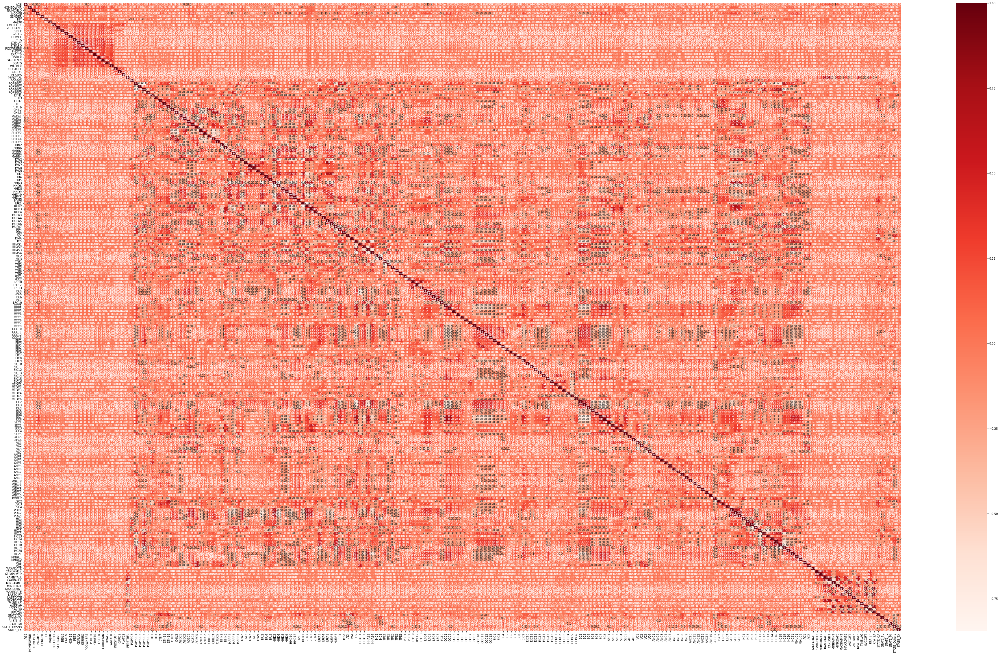

In [72]:
#Using Spearman correlation
%matplotlib inline

def cor_heatmap(cor):
    plt.figure(figsize=(68,40))
    sns.heatmap(data = cor, annot = True, cmap = plt.cm.Reds, fmt='.1')
    plt.show()

cor_spearman = numeric_data.corr(method ='spearman')
cor_heatmap(cor_spearman)

#do this after the split in different types and see which ones can be dropped


In [187]:
std_data.shape[0]/data.shape[0] 

0.9736720747914308

In [188]:
std_data.describe(include='all')

,AGE,HOMEOWNR,NUMCHLD,INCOME,GENDER,HIT,MAJOR,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,PEPSTRFL,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,RFA_2F,RFA_2A,STATE_CA,STATE_FL,STATE_IL,STATE_MI,STATE_Others,STATE_TX
count,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.00000,92900.000000,92900.000000,92900.000000
mean,-0.013477,-0.445759,0.200

### Outliers

<a class="anchor" id="outl">

In [189]:
import seaborn as sns
from math import ceil

In [190]:
numeric_data = std_data.select_dtypes(include=[np.number]).copy()

In [191]:
numeric_data.drop(['HOMEOWNR','GENDER',
 'COLLECT1',
 'VETERANS',
 'BIBLE',
 'CATLG',
 'HOMEE',
 'PETS',
 'CDPLAY',
 'STEREO',
 'PCOWNERS',
 'PHOTO',
 'CRAFTS',
 'FISHER',
 'GARDENIN',
 'BOATS',
 'WALKER',
 'KIDSTUFF',
 'CARDS',
 'PLATES',
 'PEPSTRFL',
 'STATE_CA',       
'STATE_FL',        
'STATE_IL',       
'STATE_MI',        
'STATE_Others','STATE_TX', 'RFA_2A', 'MAJOR','RFA_2F'], axis=1, inplace=True)

#encoders and binaries are not metric features

In [192]:
df_outliers2 = numeric_data.copy()

q25 = df_outliers2.quantile(.25)
q75 = df_outliers2.quantile(.75)
iqr = (q75 - q25) * 2.5

upper_lim = q75 + 7 * iqr
lower_lim = q25 - 7 * iqr

filters = []
for metric in numeric_data:
    llim = lower_lim[metric]
    ulim = upper_lim[metric]
    filters.append(df_outliers2[metric].between(llim, ulim, inclusive=True))

df_outliers3 = df_outliers2[np.all(filters, 0)]
print('Percentage of data kept after removing outliers:', np.round(df_outliers3.shape[0] / data.shape[0], 4))

#too much data lost

Percentage of data kept after removing outliers: 0.1745


In [194]:
from scipy import stats

In [195]:
z_scores = stats.zscore(df_outliers2)
abs_z_scores = np.abs(z_scores)
filtered_entries = (abs_z_scores < 10).all(axis=1)
new_df = df_outliers[filtered_entries]

print('Percentage of data kept after removing outliers:', np.round(new_df.shape[0] / data.shape[0], 4))

new_df


Percentage of data kept after removing outliers: 0.931


,AGE,HOMEOWNR,NUMCHLD,INCOME,GENDER,HIT,MAJOR,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,PEPSTRFL,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,CONTROLN,RFA_2F,RFA_2A,STATE_CA,STATE_FL,STATE_IL,STATE_MI,STATE_Others,STATE_TX
0,60.0,0,0.0,4.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,332,0,35,65,53,92,0,0,42,27,11,14,18,17,13,12,11,34,25,18,33,4,7,12,19,95,2,7,7,0,14,4,7,70,16,2,5,9,3,0,1,61,15,4,0,14,1,0,0,73,12883,28,4,51,1,54,3,88,8,0,0,4,1,13,14,2,45,64,44,62,53,0,9,3,8,13,9,0,3,9,15,19,5,4,3,3,41,1,0,7,13,6,5,0,4,9,4,1,3,10,2,1,7,78,2,16,10,39,21,8,4,3,5,20,3,19,4,39,0,34,23,18,16,1,4,0,23,0,0,5,1,0,0,0,0,0,2,0,74,8,0,4,96,77,19,13,5,14,46,90,0,10,0,0,65,40,99,99,6,2,10,7,333.0,6,14,240.0,14,5.0,1978.0,12.0,1429.0,10.0,761.0,2862.0,4.0,7.741935,95515,4,1,0.0,0.0,1.0,0.0,0.0,0.0
1,45.0,1,1.0,6.0,1,16,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,998,99,0,0,50,67,0,2,46,21,13,14,33,23,10,11,16,36,22,15,21,9,4,3,24,99,0,0,0,0,4,3,9,88,5,1,3,5,2,94,0,73,21,5,0,4,0,0,0,94,36175,6,2,66,3,44,9,80,14,0,0,6,0,2,24,12,71,81,57,64,57,0,22,24,4,21,13,2,1,6,4,1,0,3,1,6,13,1,2,8,18,11,4,3,4,10,7,11,1,6,2,1,16,69,5,5,5,12,21,7,30,20,14,24,4,24,10,15,0,55,10,11,0,0,2,0,3,1,1,2,3,1,1,0,3,0,0,0,39,7,27,16,99,92,53,5,2,56,0,96,0,4,0,0,0,99,99,99,20,4,6,5,333.0,6,13,47.0,1,10.0,1552.0,25.0,761.0,25.0,761.0,1005.0,18.0,15.666667,148535,2,3,1.0,0.0,0.0,0.0,0.0,0.0
2,59.0,0,0.0,3.0,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2669,0,2,98,51,96,0,0,40,25,13,20,19,16,13,15,14,30,22,19,35,2,9,9,19,69,1,3,3,0,22,7,18,65,14,2,5,11,3,0,4,51,14,5,24,11,2,3,6,44,11576,28,8,31,11,62,8,74,22,0,2,2,1,21,19,6,61,70,56,78,62,4,10,5,2,6,12,0,1,9,18,20,5,7,6,11,33,4,3,2,12,3,3,2,0,7,8,3,3,6,7,1,8,74,3,22,20,28,16,6,5,3,1,23,1,16,6,21,0,28,23,32,8,1,14,1,5,0,0,7,0,0,0,0,0,1,0,0,84,3,0,0,92,65,29,9,3,23,31,0,6,35,44,15,77,17,97,92,9,2,6,5,333.0,6,14,202.0,14,2.0,2252.0,16.0,2009.0,5.0,761.0,2556.0,12.0,7.481481,15078,4,1,0.0,0.0,0.0,0.0,1.0,0.0
3,69.0,0,0.0,1.0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,219,0,8,92,46,61,0,2,35,20,15,25,17,17,12,20,17,30,14,19,27,8,9,6,23,83,3,2,0,2,52,7,6,61,16,3,3,21,4,10,15,50,15,5,9,42,4,0,5,34,15130,22,14,26,20,54,3,58,36,0,6,0,0,17,13,0,43,68,45,33,31,23,17,3,0,6,6,0,0,13,12,0,0,0,42,6,3,0,0,0,23,3,3,6,0,3,3,3,3,3,0,3,6,87,0,28,12,14,27,10,3,5,0,19,1,17,0,23,0,14,40,31,16,0,1,0,13,0,0,4,0,0,0,3,0,0,0,0,67,41,3,0,94,43,27,4,0,19,55,45,22,17,0,16,77,22,93,89,16,2,6,6,333.0,6,14,109.0,7,2.0,3713.0,11.0,1156.0,10.0,761.0,3713.0,9.0,6.812500,172556,4,1,1.0,0.0,0.0,0.0,0.0,0.0
4,77.0,1,1.0,3.0,0,60,0,0,0,1,1,0,0,0,1,0,0,1,0,1,0,1,0,1,0,0,761,99,0,0,54,2,0,0,43,23,14,21,13,15,20,13,15,34,19,19,26,14,17,9,33,98,0,0,0,0,10,3,0,49,8,3,17,9,1,0,2,53,16,6,0,9,0,0,0,83,9836,35,8,11,14,80,4,73,22,1,3,1,2,1,24,3,76,65,49,80,31,10,17,8,2,6,15,3,7,22,9,0,7,2,2,6,1,5,2,2,12,2,7,6,4,15,29,4,3,26,3,2,7,49,12,16,20,30,13,3,12,5,2,26,1,20,7,28,4,9,16,53,20,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,65,0,0,0,90,45,18,25,0,3,67,9,14,72,3,0,1,21,99,96,6,2,7,11,333.0

In [196]:
df_outliers2[filtered_entries == False]

,AGE,NUMCHLD,INCOME,HIT,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT
CONTROLN,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
134891,0.578947,0.0,0.0,5.666667,-0.453856,-1.000000,99.0,0.000000,-0.666667,0.333333,1.0,0.0,1.333333,0.166667,2.8,-0.875,-0.142857,0.00,-0.2,-0.666667,-0.666667,0.75,0.75,0.25,-0.571429,5.666667,-1.4,-0.8,1.375,0.257143,2.000000,0.0,0.0,0.0,-0.12,0.000,0.1250,0.75,-0.272727,-1.0,-0.2,-0.857143,0.75,0.0,0.0,1.5,1.5,1.0,0.000000,-0.444444,0.428571,0.466667,0.0,-0.166667,-0.728914,0.058824,-0.666667,0.000000,0.272727,0.25,0.250000,0.250000,-0.625,0.0,1.00,0.000000,-0.5,-0.260870,-1.571429,-0.4,-2.227273,-0.1875,-0.5625,0.352941,0.30,-0.444444,0.6,-0.555556,0.333333,1.166667,-0.428571,0.0,1.5,1.333333,-0.750,-0.714286,1.25,-0.333333,1.00,-1.00,-0.923077,-0.25,1.333333,0.50,0.714286,-0.2,-0.333333,3.0,1.5,-1.0,2.0,-0.25,0.75,0.6,2.00,0.333333,0.4,-0.769231,0.0,-0.666667,-0.727273,-1.071429,0.555556,0.6,1.461538,1.428571,-0.75,3.125,0.0,1.000000,3.50,-1.000000,-0.5,-1.294118,1.181818,2.095238,-0.750000,0.0,8.8,-1.0,-0.250,0.0,0.0,-0.75,-0.5,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.68750,-0.25,1.0,-0.333333,0.571429,1.041667,1.466667,1.2,2.000000,0.466667,-0.057692,-0.323944,-0.285714,-0.153846,9.50,1.8,-0.055556,0.076923,0.0,-0.4,-0.666667,0.0,-0.666667,0.50,0.0,0.0,-0.5,-0.033333,-0.2,0.000000,0.059317,-0.222222,0.399123,0.0,1.196078,-0.254632,-0.333333,-0.151177
190166,0.000000,0.0,0.0,0.000000,0.149178,-0.656566,0.0,1.222222,0.000000,-0.133333,0.0,0.0,-0.833333,0.500000,-0.6,0.000,-0.285714,0.00,1.6,0.333333,0.333333,-0.50,-0.25,0.25,2.285714,-0.333333,-0.4,-0.8,-0.500,0.000000,-0.333333,0.0,0.0,0.0,0.12,1.500,3.7500,0.55,-0.272727,0.0,0.2,-0.285714,0.50,0.0,-0.2,0.2,0.0,0.0,0.000000,-0.222222,0.142857,0.933333,0.0,0.400000,0.079422,0.235294,-0.166667,0.458333,-0.363636,-2.65,4.250000,1.083333,-0.500,0.0,-0.75,-0.333333,-0.5,0.086957,0.000000,0.2,0.727273,-0.6250,0.2500,-0.117647,0.30,0.000000,0.1,0.111111,0.333333,1.333333,0.285714,0.0,1.5,0.000000,0.000,-0.428571,-0.25,-0.666667,0.00,1.00,-0.538462,0.00,0.333333,0.00,1.857143,-0.2,0.000000,0.0,-0.5,0.2,-0.2,-0.25,0.75,1.2,0.00,0.000000,-0.2,-0.076923,0.4,-0.333333,0.363636,0.642857,0.222222,-0.2,-0.230769,0.142857,0.50,-1.125,0.5,-1.142857,0.00,0.416667,1.0,-0.705882,-0.181818,0.523810,1.083333,1.0,0.2,0.0,0.250,0.0,0.0,0.50,2.5,0.0,2.0,0.0,0.0,-1.0,0.0,1.0,-1.31250,0.00,0.0,2.333333,0.285714,0.541667,0.000000,-1.0,14.333333,2.766667,-0.557692,-0.845070,-0.285714,2.000000,0.00,-0.2,-0.055556,0.076923,0.0,0.2,0.000000,0.0,0.333333,1.75,62.0,-4.0,-4.0,0.033333,-0.4,2.857143,-0.058672,1.444444,0.000000,1.5,1.196078,-0.364017,-0.666667,2.133690
190313,0.000000,0.0,0.0,0.000000,0.065740,0.000000,0.0,0.000000,0.000000,0.066667,0.0,0.0,-0.333333,-0.666667,-0.8,1.500,2.000000,0.25,-1.2,0.333333,1.666667,-0.25,-0.25,-1.00,-1.428571,1.000000,-1.0,-1.2,-0.500,0.771429,-0.333333,0.0,0.0,0.0,-0.84,-0.250,-0.1250,1.30,-1.000000,0

### PCA


### Take outliers with PCA
https://www.dummies.com/programming/big-data/data-science/python-for-data-science-developing-a-multivariate-approach-to-find-outliers/
https://stats.stackexchange.com/questions/328109/k-means-does-it-make-sense-to-remove-the-outliers-after-clustering-the-datasets

In [197]:
df_pca1 = numeric_data.copy()
df_pca1

,AGE,NUMCHLD,INCOME,HIT,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT
CONTROLN,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
95515,0.052632,0.0,0.0,0.000000,-0.323641,-1.000000,35.0,1.203704,0.666667,-0.066667,0.0,0.0,0.500000,1.000000,-0.2,-1.000,-0.285714,0.75,0.2,-0.666667,-1.666667,0.50,1.25,0.75,0.000000,0.333333,-0.6,1.0,-0.250,0.657143,0.333333,7.0,7.0,0.0,-0.40,-0.250,0.1250,0.40,0.181818,1.0,0.0,-0.428571,-0.25,0.0,-0.2,0.7,0.5,0.0,0.000000,0.444444,-0.142857,-0.133333,0.0,-0.433333,-0.123545,0.117647,0.000000,0.333333,-0.636364,0.05,-0.583333,0.750000,-0.500,0.0,-0.75,0.666667,0.0,0.086957,-0.714286,-0.4,-0.863636,-0.5000,-0.6250,-0.235294,0.15,-0.444444,-0.4,-0.888889,1.666667,0.166667,-0.857143,0.0,1.0,-0.166667,0.500,2.000000,0.25,0.333333,0.50,-0.75,1.923077,-0.75,-0.666667,0.75,-0.571429,0.0,0.333333,-1.5,1.5,0.2,-0.6,-1.25,-0.25,0.8,-0.25,-0.333333,0.0,0.538462,-0.6,1.111111,-0.181818,0.714286,0.000000,0.4,-0.615385,-0.285714,0.50,-0.375,0.5,0.142857,-0.50,0.666667,-0.5,0.235294,0.454545,-0.666667,0.583333,1.0,-0.2,-1.0,1.875,0.0,0.0,0.25,0.0,0.0,-1.0,0.0,0.0,-1.0,2.0,0.0,0.46875,1.50,0.0,0.666667,0.142857,0.583333,0.000000,1.4,1.666667,-0.066667,0.326923,0.422535,-0.285714,-0.282051,0.00,-0.2,3.555556,-1.057692,0.0,0.2,-0.666667,0.0,1.333333,0.25,0.0,0.0,1.0,1.811111,2.0,0.000000,0.255319,-0.555556,1.063596,-0.5,0.000000,0.455469,-0.333333,-0.552850
148535,-0.736842,1.0,1.0,5.333333,0.518331,0.000000,0.0,0.000000,-0.333333,-1.733333,0.0,2.0,1.166667,0.000000,0.2,-1.000,1.857143,2.25,-0.4,-0.833333,0.000000,1.00,0.50,0.00,-1.714286,2.000000,-1.2,-0.8,0.375,0.771429,-0.333333,0.0,0.0,0.0,-0.80,-0.375,0.2500,1.30,-0.818182,0.0,-0.4,-1.000000,-0.50,47.0,-0.4,1.9,3.5,1.0,0.000000,-0.666667,-0.285714,-0.133333,0.0,0.266667,3.038659,-1.176471,-0.333333,0.958333,-0.454545,-0.45,-0.083333,0.083333,0.250,0.0,-0.75,1.333333,-0.5,-0.391304,0.714286,1.6,0.318182,0.5625,0.1875,-0.117647,0.35,-0.444444,0.9,1.444444,0.333333,1.500000,-0.285714,2.0,0.0,-0.666667,-0.875,-0.571429,-1.00,0.000000,0.00,0.00,-0.230769,-0.75,0.000000,1.00,0.142857,1.0,0.000000,0.0,1.5,0.4,0.0,1.25,-0.75,0.0,-0.25,-0.333333,1.8,-0.153846,0.0,-0.111111,-0.636364,-1.214286,0.000000,0.2,1.384615,2.142857,2.75,0.125,1.0,0.857143,1.00,-1.333333,-0.5,1.470588,-0.727273,-1.000000,-0.750000,0.0,-0.6,-1.0,-0.625,1.0,1.0,-0.50,1.0,1.0,0.0,0.0,3.0,-1.0,0.0,0.0,-0.62500,1.25,13.5,4.666667,0.571429,1.208333,2.266667,-0.2,0.666667,1.333333,-0.557692,0.507042,-0.285714,-0.435897,0.00,-0.2,-0.055556,0.076923,0.0,0.2,4.000000,2.0,0.000000,-0.25,0.0,0.0,0.5,-0.333333,-0.6,0.714286,-0.019342,0.888889,-0.401316,1.0,0.000000,-0.654513,2.000000,0.572139
15078,0.000000,0.0,-0.5,0.666667,2.630847,-1.000000,2.0,1.814815,0.000000,0.200000,0.0,0.0,0.166667,0.666667,0.2,-0.250,-0.142857,0.50,0.2,-0.166667,-0.666667,-0.50,0.50,1.00,0.285714,-0.333333,-0.2,0.4,-0.250,-0.085714,0.000000,3.0,3.0,0.0,-0.08,0.125,0.8125,0.15,0.000000,1.

In [198]:
# Use PCA to reduce dimensionality of data
pca = PCA()
pca_feat = pca.fit_transform(df_pca1)
pca_feat  

array([[ 2.15760669e+01, -2.71190659e+00,  5.06524636e+00, ...,
         7.27861107e-03, -4.40748443e-02, -5.27195181e-04],
       [-1.58347784e+01,  4.45820045e+01, -3.27236112e+00, ...,
         5.04759735e-03, -4.46985249e-03,  8.70882235e-04],
       [-1.14517591e+01, -5.25436031e+00,  1.64289434e+00, ...,
        -1.00740995e-03, -1.43267128e-02,  4.01181865e-03],
       ...,
       [-1.35340407e+01, -4.32301615e+00, -1.61019764e+00, ...,
        -1.50715663e-02,  1.84767216e-02, -1.89836456e-03],
       [-1.37620898e+01,  1.45233794e+00,  3.40083799e+00, ...,
         1.48072010e-03, -1.46974215e-02,  1.21487046e-05],
       [-1.37291083e+01, -2.00754477e+00, -2.76755428e+00, ...,
         2.48827120e-02, -8.50583567e-03, -9.19795988e-03]])

In [199]:
# Output PCA table
pd.DataFrame(
    {"Eigenvalue": pca.explained_variance_,
     "Difference": np.insert(np.diff(pca.explained_variance_), 0, 0),
     "Proportion": pca.explained_variance_ratio_,
     "Cumulative": np.cumsum(pca.explained_variance_ratio_)},
    index=range(1, pca.n_components_ + 1)
)

,Eigenvalue,Difference,Proportion,Cumulative
1,985.042816,0.000000,6.881703e-01,0.688170
2,86.679750,-898.363066,6.055618e-02,0.748726
3,55.594762,-31.084988,3.883959e-02,0.787566
4,21.810930,-33.783832,1.523754e-02,0.802804
5,19.209095,-2.601835,1.341985e-02,0.816223
6,17.096047,-2.113048,1.194364e-02,0.828167
7,15.322386,-1.773662,1.070452e-02,0.838872
8,12.778541,-2.543845,8.927340e-03,0.847799
9,11.295553,-1.482987,7.891296e-03,0.855690
10,10.803569,-0.491985,7.547586e-03,0.863238


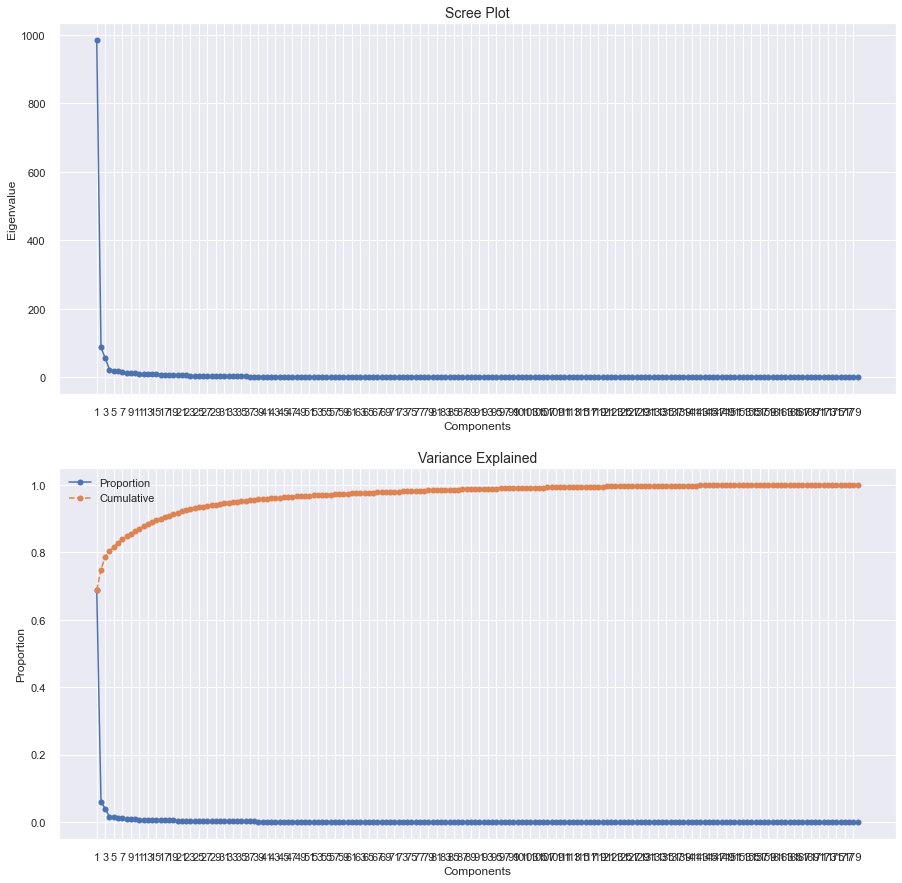

In [200]:
%matplotlib inline
# figure and axes
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 15))

# draw plots
ax1.plot(pca.explained_variance_, marker=".", markersize=12)
ax2.plot(pca.explained_variance_ratio_, marker=".", markersize=12, label="Proportion")
ax2.plot(np.cumsum(pca.explained_variance_ratio_), marker=".", markersize=12, linestyle="--", label="Cumulative")

# customizations
ax2.legend()
ax1.set_title("Scree Plot", fontsize=14)
ax2.set_title("Variance Explained", fontsize=14)
ax1.set_ylabel("Eigenvalue")
ax2.set_ylabel("Proportion")
ax1.set_xlabel("Components")
ax2.set_xlabel("Components")
ax1.set_xticks(range(0, pca.n_components_, 2))
ax1.set_xticklabels(range(1, pca.n_components_ + 1, 2))
ax2.set_xticks(range(0, pca.n_components_, 2))
ax2.set_xticklabels(range(1, pca.n_components_ + 1, 2))

plt.show()

#6

In [201]:
pca = PCA(n_components=12)
pca_feat = pca.fit_transform(df_pca1)
pca_feat_names = [f"PC{i}" for i in range(pca.n_components_)]
pca_df = pd.DataFrame(pca_feat, index=df_pca1.index, columns=pca_feat_names)  # remember index=df_pca.index
pca_df

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11
CONTROLN,,,,,,,,,,,,
95515,21.576067,-2.711907,5.065246,-4.900975,-1.298327,-3.492560,-0.406584,-2.889514,0.291641,-0.887448,0.843207,-1.145682
148535,-15.834778,44.582005,-3.272361,-0.571099,2.823195,-0.643793,-0.881158,-5.809546,3.441732,-2.544946,3.966160,2.331336
15078,-11.451759,-5.254360,1.642894,-4.023044,5.002956,-1.195825,-0.286074,-1.963196,-3.473678,1.256941,0.770757,-0.636104
172556,-5.761752,0.575735,1.536973,5.486249,8.107046,-1.145472,-0.058996,-6.290668,-3.407820,0.950339,4.224741,-1.631620
7112,-13.517540,-4.301749,-1.688355,1.844058,-1.287230,-0.303084,-2.727882,0.665610,1.359243,-1.284825,14.334400,13.115654
...,...,...,...,...,...,...,...,...,...,...,...,...
184568,-13.621149,-3.325496,-1.570705,3.365112,-0.172663,0.306436,0.228624,1.194278,6.103539,-0.682552,-6.115025,-0.540741
122706,-13.891308,-0.475268,-2.954685,-2.243342,-1.562922,1.991096,0.048531,-3.204227,3.633354,-1.568982,-0.623244,-0.854397
189641,-13.534041,-4.323016,-1.610198,2.511902,-1.521153,-0.040944,-0.663547,-1.964587,1.084893,-1.572711,-0.538566,-0.146950


In [202]:
# Reassigning df to contain pca variables
df_pca1 = pd.concat([df_pca1, pca_df], axis=1)  #df_pca1 em vez disto se calhar devia ser df_[numerical_data] - para nao incluir a normalizacao
df_pca1.head()

,AGE,NUMCHLD,INCOME,HIT,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11
CONTROLN,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
95515,0.052632,0.0,0.0,0.000000,-0.323641,-1.0,35.0,1.203704,0.666667,-0.066667,0.0,0.0,0.500000,1.000000,-0.2,-1.000,-0.285714,0.75,0.2,-0.666667,-1.666667,0.5,1.25,0.75,0.000000,0.333333,-0.6,1.0,-0.250,0.657143,0.333333,7.0,7.0,0.0,-0.40,-0.250,0.1250,0.40,0.181818,1.0,0.0,-0.428571,-0.25,0.0,-0.2,0.7,0.5,0.0,0.000000,0.444444,-0.142857,-0.133333,0.0,-0.433333,-0.123545,0.117647,0.000000,0.333333,-0.636364,0.05,-0.583333,0.750000,-0.50,0.0,-0.75,0.666667,0.0,0.086957,-0.714286,-0.4,-0.863636,-0.5000,-0.6250,-0.235294,0.15,-0.444444,-0.4,-0.888889,1.666667,0.166667,-0.857143,0.0,1.0,-0.166667,0.500,2.000000,0.25,0.333333,0.50,-0.75,1.923077,-0.75,-0.666667,0.75,-0.571429,0.0,0.333333,-1.5,1.5,0.2,-0.6,-1.25,-0.25,0.8,-0.25,-0.333333,0.0,0.538462,-0.6,1.111111,-0.181818,0.714286,0.000000,0.4,-0.615385,-0.285714,0.50,-0.375,0.5,0.142857,-0.50,0.666667,-0.5,0.235294,0.454545,-0.666667,0.583333,1.0,-0.2,-1.0,1.875,0.0,0.0,0.25,0.0,0.0,-1.0,0.0,0.0,-1.0,2.0,0.0,0.46875,1.50,0.0,0.666667,0.142857,0.583333,0.000000,1.4,1.666667,-0.066667,0.326923,0.422535,-0.285714,-0.282051,0.00,-0.2,3.555556,-1.057692,0.0,0.2,-0.666667,0.0,1.333333,0.25,0.0,0.0,1.0,1.811111,2.0,0.000000,0.255319,-0.555556,1.063596,-0.5,0.000000,0.455469,-0.333333,-0.552850,21.576067,-2.711907,5.065246,-4.900975,-1.298327,-3.492560,-0.406584,-2.889514,0.291641,-0.887448,0.843207,-1.145682
148535,-0.736842,1.0,1.0,5.333333,0.518331,0.0,0.0,0.000000,-0.333333,-1.733333,0.0,2.0,1.166667,0.000000,0.2,-1.000,1.857143,2.25,-0.4,-0.833333,0.000000,1.0,0.50,0.00,-1.714286,2.000000,-1.2,-0.8,0.375,0.771429,-0.333333,0.0,0.0,0.0,-0.80,-0.375,0.2500,1.30,-0.818182,0.0,-0.4,-1.000000,-0.50,47.0,-0.4,1.9,3.5,1.0,0.000000,-0.666667,-0.285714,-0.133333,0.0,0.266667,3.038659,-1.176471,-0.333333,0.958333,-0.454545,-0.45,-0.083333,0.083333,0.25,0.0,-0.75,1.333333,-0.5,-0.391304,0.714286,1.6,0.318182,0.5625,0.1875,-0.117647,0.35,-0.444444,0.9,1.444444,0.333333,1.500000,-0.285714,2.0,0.0,-0.666667,-0.875,-0.571429,-1.00,0.000000,0.00,0.00,-0.230769,-0.75,0.000000,1.00,0.142857,1.0,0.000000,0.0,1.5,0.4,0.0,1.25,-0.75,0.0,-0.25,-0.333333,1.8,-0.153846,0.0,-0.111111,-0.636364,-1.214286,0.000000,0.2,1.384615,2.142857,2.75,0.125,1.0,0.857143,1.00,-1.333333,-0.5,1.470588,-0.727273,-1.000000,-0.750000,0.0,-0.6,-1.0,-0.625,1.0,1.0,-0.50,1.0,1.0,0.0,0.0,3.0,-1.0,0.0,0.0,-0.62500,1.25,13.5,4.666667,0.571429,1.208333,2.266667,-0.2,0.666667,1.333333,-0.557692,0.507042,-0.285714,-0.435897,0.00,-0.2,-0.055556,0.076923,0.0,0.2,4.000000,2.0,0.000000,-0.25,0.0,0.0,0.5,-0.333333,-0.6,0.714286,-0.019342,0.888889,-0.401316,1.0,0.000000,-0.654513,2.000000,0.572139,-15.834778,44.582005,-3.272361,-0.571099,2.823195,-0.643793,-0.881158,-5.809546,3.441732,-2.544946,3.966160,2.3

In [89]:
metric_features = numeric_data.columns.tolist()

def _color_red_or_green(val):
    if val < -0.45:
        color = 'background-color: red'
    elif val > 0.45:
        color = 'background-color: green'
    else:
        color = ''
    return color

# Interpreting each Principal Component
loadings = df_pca1[metric_features + pca_feat_names].corr().loc[metric_features, pca_feat_names]
loadings.style.applymap(_color_red_or_green)

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11
AGE,0.039035,0.016014,0.019399,-0.024474,-0.011721,-0.017696,-0.007748,0.104394,-0.071666,0.014802,0.076837,0.079527
NUMCHLD,-0.002574,-0.027837,-0.032151,-0.006787,-0.017996,0.011057,-0.022390,-0.065880,0.050652,-0.048702,0.013994,0.005590
INCOME,-0.072806,0.215343,-0.065912,-0.107969,-0.083847,0.067366,-0.005533,-0.081799,0.197504,-0.043417,0.001207,-0.048137
HIT,0.009362,0.009554,-0.011198,-0.032880,-0.124548,0.028886,-0.080131,0.123279,0.125243,-0.134008,0.651419,0.638065
POP903,0.013516,0.031400,0.021810,0.101787,-0.023511,-0.006258,0.016024,-0.046984,-0.004242,0.077732,-0.244952,-0.092165
POP90C1,-0.546076,0.194847,0.027416,0.307183,-0.474209,-0.012733,-0.006265,0.146281,0.198881,-0.113078,-0.016966,0.020359
POP90C2,0.999897,0.013222,-0.004846,0.001193,-0.000519,0.000637,0.000140,-0.000190,0.000382,-0.000043,0.000376,-0.000671
POP90C3,-0.132178,-0.239714,-0.034330,-0.368441,0.543849,0.011404,0.006545,-0.181072,-0.236486,0.133498,0.005368,-0.016123
POP90C5,0.098677,0.006461,-0.148651,0.009375,-0.227839,-0.055057,-0.008511,0.323575,-0.140525,0.040982,-0.010674,0.053209
ETH1,0.062655,-0.019225,-0.119912,-0.623748,-0.093976,0.184315,-0.010033,0.134167,-0.013669,0.011115,0.014315,-0.108952


In [203]:
df = df_pca1.copy()
df_pca2 = pd.concat([df_pca1, std_data[categorical_data]], axis=1)  #depois arranjar, 
df_pca2

,AGE,NUMCHLD,INCOME,HIT,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11
CONTROLN,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
95515,0.052632,0.0,0.0,0.000000,-0.323641,-1.000000,35.0,1.203704,0.666667,-0.066667,0.0,0.0,0.500000,1.000000,-0.2,-1.000,-0.285714,0.75,0.2,-0.666667,-1.666667,0.50,1.25,0.75,0.000000,0.333333,-0.6,1.0,-0.250,0.657143,0.333333,7.0,7.0,0.0,-0.40,-0.250,0.1250,0.40,0.181818,1.0,0.0,-0.428571,-0.25,0.0,-0.2,0.7,0.5,0.0,0.000000,0.444444,-0.142857,-0.133333,0.0,-0.433333,-0.123545,0.117647,0.000000,0.333333,-0.636364,0.05,-0.583333,0.750000,-0.500,0.0,-0.75,0.666667,0.0,0.086957,-0.714286,-0.4,-0.863636,-0.5000,-0.6250,-0.235294,0.15,-0.444444,-0.4,-0.888889,1.666667,0.166667,-0.857143,0.0,1.0,-0.166667,0.500,2.000000,0.25,0.333333,0.50,-0.75,1.923077,-0.75,-0.666667,0.75,-0.571429,0.0,0.333333,-1.5,1.5,0.2,-0.6,-1.25,-0.25,0.8,-0.25,-0.333333,0.0,0.538462,-0.6,1.111111,-0.181818,0.714286,0.000000,0.4,-0.615385,-0.285714,0.50,-0.375,0.5,0.142857,-0.50,0.666667,-0.5,0.235294,0.454545,-0.666667,0.583333,1.0,-0.2,-1.0,1.875,0.0,0.0,0.25,0.0,0.0,-1.0,0.0,0.0,-1.0,2.0,0.0,0.46875,1.50,0.0,0.666667,0.142857,0.583333,0.000000,1.4,1.666667,-0.066667,0.326923,0.422535,-0.285714,-0.282051,0.00,-0.2,3.555556,-1.057692,0.0,0.2,-0.666667,0.0,1.333333,0.25,0.0,0.0,1.0,1.811111,2.0,0.000000,0.255319,-0.555556,1.063596,-0.5,0.000000,0.455469,-0.333333,-0.552850,21.576067,-2.711907,5.065246,-4.900975,-1.298327,-3.492560,-0.406584,-2.889514,0.291641,-0.887448,0.843207,-1.145682
148535,-0.736842,1.0,1.0,5.333333,0.518331,0.000000,0.0,0.000000,-0.333333,-1.733333,0.0,2.0,1.166667,0.000000,0.2,-1.000,1.857143,2.25,-0.4,-0.833333,0.000000,1.00,0.50,0.00,-1.714286,2.000000,-1.2,-0.8,0.375,0.771429,-0.333333,0.0,0.0,0.0,-0.80,-0.375,0.2500,1.30,-0.818182,0.0,-0.4,-1.000000,-0.50,47.0,-0.4,1.9,3.5,1.0,0.000000,-0.666667,-0.285714,-0.133333,0.0,0.266667,3.038659,-1.176471,-0.333333,0.958333,-0.454545,-0.45,-0.083333,0.083333,0.250,0.0,-0.75,1.333333,-0.5,-0.391304,0.714286,1.6,0.318182,0.5625,0.1875,-0.117647,0.35,-0.444444,0.9,1.444444,0.333333,1.500000,-0.285714,2.0,0.0,-0.666667,-0.875,-0.571429,-1.00,0.000000,0.00,0.00,-0.230769,-0.75,0.000000,1.00,0.142857,1.0,0.000000,0.0,1.5,0.4,0.0,1.25,-0.75,0.0,-0.25,-0.333333,1.8,-0.153846,0.0,-0.111111,-0.636364,-1.214286,0.000000,0.2,1.384615,2.142857,2.75,0.125,1.0,0.857143,1.00,-1.333333,-0.5,1.470588,-0.727273,-1.000000,-0.750000,0.0,-0.6,-1.0,-0.625,1.0,1.0,-0.50,1.0,1.0,0.0,0.0,3.0,-1.0,0.0,0.0,-0.62500,1.25,13.5,4.666667,0.571429,1.208333,2.266667,-0.2,0.666667,1.333333,-0.557692,0.507042,-0.285714,-0.435897,0.00,-0.2,-0.055556,0.076923,0.0,0.2,4.000000,2.0,0.000000,-0.25,0.0,0.0,0.5,-0.333333,-0.6,0.714286,-0.019342,0.888889,-0.401316,1.0,0.000000,-0.654513,2.000000,0.572139,-15.834778,44.582005,-3.272361,-0.571099,2.823195,-0.643793,-0.881158,-5.809546,3.441732,-2.54494

In [62]:
# Do this after checking the new pandas profiling report
#df_pca2.drop(columns=['PC11], inplace=True)

In [204]:
pc_features = df_pca2.columns[df_pca2.columns.str.startswith('PC')]#.drop(['PCOWNERS'])
df_pca2[pc_features]

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11
CONTROLN,,,,,,,,,,,,
95515,21.576067,-2.711907,5.065246,-4.900975,-1.298327,-3.492560,-0.406584,-2.889514,0.291641,-0.887448,0.843207,-1.145682
148535,-15.834778,44.582005,-3.272361,-0.571099,2.823195,-0.643793,-0.881158,-5.809546,3.441732,-2.544946,3.966160,2.331336
15078,-11.451759,-5.254360,1.642894,-4.023044,5.002956,-1.195825,-0.286074,-1.963196,-3.473678,1.256941,0.770757,-0.636104
172556,-5.761752,0.575735,1.536973,5.486249,8.107046,-1.145472,-0.058996,-6.290668,-3.407820,0.950339,4.224741,-1.631620
7112,-13.517540,-4.301749,-1.688355,1.844058,-1.287230,-0.303084,-2.727882,0.665610,1.359243,-1.284825,14.334400,13.115654
...,...,...,...,...,...,...,...,...,...,...,...,...
184568,-13.621149,-3.325496,-1.570705,3.365112,-0.172663,0.306436,0.228624,1.194278,6.103539,-0.682552,-6.115025,-0.540741
122706,-13.891308,-0.475268,-2.954685,-2.243342,-1.562922,1.991096,0.048531,-3.204227,3.633354,-1.568982,-0.623244,-0.854397
189641,-13.534041,-4.323016,-1.610198,2.511902,-1.521153,-0.040944,-0.663547,-1.964587,1.084893,-1.572711,-0.538566,-0.146950


https://www.dummies.com/programming/big-data/data-science/python-for-data-science-developing-a-multivariate-approach-to-find-outliers/

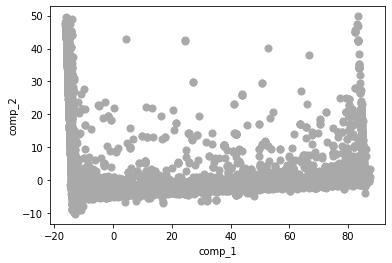

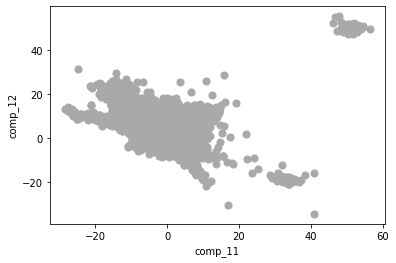

In [93]:
df9 = pd.DataFrame(pca_feat, columns=['comp_'+str(j+1) for j in range(12)])
first_two = df9.plot(kind='scatter', x='comp_1', y='comp_2', c='DarkGrey', s=50)
last_two = df9.plot(kind='scatter', x='comp_11', y='comp_12', c='DarkGrey', s=50)

nao usamos , 12x12


In [94]:
df

,AGE,NUMCHLD,INCOME,HIT,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,ETH11,ETH16,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,MSA,ADI,DMA,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11
CONTROLN,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
95515,0.052632,0.0,0.0,0.000000,-0.323641,-1.000000,35.0,1.203704,0.666667,-0.066667,0.0,0.0,0.0,-0.5,0.500000,1.000000,-0.2,-1.000,-0.285714,0.75,0.2,-0.666667,-1.666667,0.50,1.25,0.75,0.000000,0.333333,-0.6,1.0,-0.250,0.657143,0.333333,7.0,7.0,0.0,-0.40,-0.250,0.1250,0.40,0.181818,1.0,0.0,-0.428571,-0.25,0.0,-0.2,0.7,0.5,0.0,0.000000,0.444444,-0.142857,-0.133333,0.0,-0.433333,-0.615809,0.009346,0.197479,-0.123545,0.117647,0.000000,0.333333,-0.636364,0.05,-0.583333,0.750000,-0.500,0.0,-0.75,0.666667,0.0,0.086957,-0.714286,-0.4,-0.863636,-0.5000,-0.6250,-0.235294,0.15,-0.444444,-0.4,-0.888889,1.666667,0.166667,-0.857143,0.0,1.0,-0.166667,0.500,2.000000,0.25,0.333333,0.50,-0.75,1.923077,-0.75,-0.666667,0.75,-0.571429,0.0,0.333333,-1.5,1.5,0.2,-0.6,-1.25,-0.25,0.8,-0.25,-0.333333,0.0,0.538462,-0.6,1.111111,-0.181818,0.714286,0.000000,0.4,-0.615385,-0.285714,0.50,-0.375,0.5,0.142857,-0.50,0.666667,-0.5,0.235294,0.454545,-0.666667,0.583333,1.0,-0.2,-1.0,1.875,0.0,0.0,0.25,0.0,0.0,-1.0,0.0,0.0,-1.0,2.0,0.0,0.46875,1.50,0.0,0.666667,0.142857,0.583333,0.000000,1.4,1.666667,-0.066667,0.326923,0.422535,-0.285714,-0.282051,0.00,-0.2,3.555556,-1.057692,0.0,0.2,-0.666667,0.0,1.333333,0.25,0.0,0.0,1.0,1.811111,2.0,0.000000,0.255319,-0.555556,1.063596,-0.5,0.000000,0.455469,-0.333333,-0.552850,21.582011,-2.730909,5.057629,-4.713950,-1.415309,-3.716391,-0.398462,-2.929659,0.201314,-0.881070,0.882849,-1.085159
148535,-0.736842,1.0,1.0,5.333333,0.518331,0.000000,0.0,0.000000,-0.333333,-1.733333,0.0,2.0,0.0,1.5,1.166667,0.000000,0.2,-1.000,1.857143,2.25,-0.4,-0.833333,0.000000,1.00,0.50,0.00,-1.714286,2.000000,-1.2,-0.8,0.375,0.771429,-0.333333,0.0,0.0,0.0,-0.80,-0.375,0.2500,1.30,-0.818182,0.0,-0.4,-1.000000,-0.50,47.0,-0.4,1.9,3.5,1.0,0.000000,-0.666667,-0.285714,-0.133333,0.0,0.266667,0.207721,-0.757009,0.705882,3.038659,-1.176471,-0.333333,0.958333,-0.454545,-0.45,-0.083333,0.083333,0.250,0.0,-0.75,1.333333,-0.5,-0.391304,0.714286,1.6,0.318182,0.5625,0.1875,-0.117647,0.35,-0.444444,0.9,1.444444,0.333333,1.500000,-0.285714,2.0,0.0,-0.666667,-0.875,-0.571429,-1.00,0.000000,0.00,0.00,-0.230769,-0.75,0.000000,1.00,0.142857,1.0,0.000000,0.0,1.5,0.4,0.0,1.25,-0.75,0.0,-0.25,-0.333333,1.8,-0.153846,0.0,-0.111111,-0.636364,-1.214286,0.000000,0.2,1.384615,2.142857,2.75,0.125,1.0,0.857143,1.00,-1.333333,-0.5,1.470588,-0.727273,-1.000000,-0.750000,0.0,-0.6,-1.0,-0.625,1.0,1.0,-0.50,1.0,1.0,0.0,0.0,3.0,-1.0,0.0,0.0,-0.62500,1.25,13.5,4.666667,0.571429,1.208333,2.266667,-0.2,0.666667,1.333333,-0.557692,0.507042,-0.285714,-0.435897,0.00,-0.2,-0.055556,0.076923,0.0,0.2,4.000000,2.0,0.000000,-0.25,0.0,0.0,0.5,-0.333333,-0.6,0.714286,-0.019342,0.888889,-0.401316,1.0,0.000000,-0.654513,2.000000,0.57

In [95]:
outlying = (pca_feat[:,-1] < 1.4) & (pca_feat[:,-4] < 1.3)
df[outlying]

,AGE,NUMCHLD,INCOME,HIT,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,ETH11,ETH16,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,MSA,ADI,DMA,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11
CONTROLN,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
95515,0.052632,0.0,0.0,0.000000,-0.323641,-1.000000,35.0,1.203704,0.666667,-0.066667,0.0,0.0,0.0,-0.5,0.500000,1.000000,-0.2,-1.000,-0.285714,0.75,0.2,-0.666667,-1.666667,0.50,1.25,0.75,0.000000,0.333333,-0.6,1.0,-0.250,0.657143,0.333333,7.0,7.0,0.0,-0.40,-0.250,0.1250,0.40,0.181818,1.0,0.0,-0.428571,-0.25,0.0,-0.2,0.7,0.5,0.0,0.000000,0.444444,-0.142857,-0.133333,0.0,-0.433333,-0.615809,0.009346,0.197479,-0.123545,0.117647,0.000000,0.333333,-0.636364,0.05,-0.583333,0.750000,-0.500,0.0,-0.75,0.666667,0.0,0.086957,-0.714286,-0.4,-0.863636,-0.5000,-0.6250,-0.235294,0.15,-0.444444,-0.4,-0.888889,1.666667,0.166667,-0.857143,0.0,1.0,-0.166667,0.500,2.000000,0.25,0.333333,0.50,-0.75,1.923077,-0.75,-0.666667,0.75,-0.571429,0.0,0.333333,-1.5,1.5,0.2,-0.6,-1.25,-0.25,0.8,-0.25,-0.333333,0.0,0.538462,-0.6,1.111111,-0.181818,0.714286,0.000000,0.4,-0.615385,-0.285714,0.50,-0.375,0.5,0.142857,-0.50,0.666667,-0.5,0.235294,0.454545,-0.666667,0.583333,1.0,-0.2,-1.0,1.875,0.0,0.0,0.25,0.0,0.0,-1.0,0.0,0.0,-1.0,2.0,0.0,0.46875,1.50,0.0,0.666667,0.142857,0.583333,0.000000,1.4,1.666667,-0.066667,0.326923,0.422535,-0.285714,-0.282051,0.00,-0.2,3.555556,-1.057692,0.0,0.2,-0.666667,0.0,1.333333,0.25,0.0,0.0,1.0,1.811111,2.0,0.000000,0.255319,-0.555556,1.063596,-0.5,0.000000,0.455469,-0.333333,-0.552850,21.582011,-2.730909,5.057629,-4.713950,-1.415309,-3.716391,-0.398462,-2.929659,0.201314,-0.881070,0.882849,-1.085159
15078,0.000000,0.0,-0.5,0.666667,2.630847,-1.000000,2.0,1.814815,0.000000,0.200000,0.0,0.0,0.0,-0.5,0.166667,0.666667,0.2,-0.250,-0.142857,0.50,0.2,-0.166667,-0.666667,-0.50,0.50,1.00,0.285714,-0.333333,-0.2,0.4,-0.250,-0.085714,0.000000,3.0,3.0,0.0,-0.08,0.125,0.8125,0.15,0.000000,1.0,0.0,-0.142857,-0.25,0.0,0.4,-0.3,0.0,1.0,1.846154,0.111111,0.000000,0.066667,3.0,-1.400000,-0.615809,0.495327,-0.491597,-0.300988,0.117647,0.666667,-0.500000,0.272727,0.45,-0.166667,-0.416667,1.250,0.0,-0.25,0.000000,0.0,0.434783,0.000000,0.4,-0.136364,-0.1250,0.1250,0.705882,0.60,0.000000,-0.3,-0.666667,-0.333333,-1.000000,-0.428571,0.0,0.0,-0.166667,0.875,2.142857,0.25,1.333333,1.25,1.25,1.307692,0.00,0.333333,-0.50,-0.714286,-0.6,-0.333333,-0.5,-0.5,-0.2,0.2,-0.75,-0.25,0.0,1.00,-0.333333,0.2,0.230769,-0.4,1.777778,0.727273,-0.071429,-0.555556,0.0,-0.538462,-0.285714,-0.50,0.000,-0.5,-0.285714,0.00,-0.833333,-0.5,-0.117647,0.454545,0.000000,-0.083333,1.0,1.8,0.0,-0.375,0.0,0.0,0.75,-0.5,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.78125,0.25,0.0,-0.666667,-0.428571,0.083333,0.666667,0.6,1.000000,0.233333,0.038462,-0.845070,0.571429,0.358974,11.00,2.8,4.222222,-1.500000,-2.0,-1.2,0.333333,0.0,0.000000,-0.25,0.0,0.0,1.0,1.388889,2.0,-0.428571,0.431979,-0.111111,2.335526,-1.0,0.000000,0.272564,1.000000,-0.5898

https://www.datasciencelearner.com/projection-detecting-outliers-dbscan-method/

In [205]:
# Based on the hyperparameters found in the previous class
dbscan = DBSCAN(eps=7.3, min_samples=20, n_jobs=4)
dbscan_labels = dbscan.fit_predict(df_pca2[pc_features])
Counter(dbscan_labels)


#5618 com 6
#3634 com 7
#3225 com 7.3

Counter({0: 89477, 1: 205, -1: 3180, 2: 38})

In [98]:
(92900-3225)/data.shape[0]

0.9398712950153021

In [206]:
df_pca2[dbscan_labels==-1]

,AGE,NUMCHLD,INCOME,HIT,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11
CONTROLN,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
190313,0.000000,0.0,0.0,0.000000,0.065740,0.0,0.0,0.000000,0.000000,0.066667,0.0,0.0,-0.333333,-0.666667,-0.8,1.500,2.000000,0.25,-1.2,0.333333,1.666667,-0.25,-0.25,-1.00,-1.428571,1.000000,-1.0,-1.2,-0.500,0.771429,-0.333333,0.0,0.0,0.0,-0.84,-0.250,-0.1250,1.30,-1.000000,0.0,-0.4,-1.000000,-0.75,1.0,-0.4,1.8,3.0,0.0,0.000000,-0.777778,-0.285714,-0.133333,0.0,0.433333,0.802362,-1.235294,-0.666667,0.916667,-0.454545,-1.35,1.250000,0.833333,-0.375,0.0,-0.50,0.000000,0.0,3.086957,2.142857,3.6,0.272727,1.5625,0.7500,0.117647,0.55,-0.444444,2.1,1.333333,0.333333,-0.333333,-0.428571,0.0,0.5,-0.166667,-0.875,-0.571429,-0.75,-1.000000,-0.25,-1.00,0.692308,0.25,0.000000,0.00,-1.285714,0.4,1.333333,-1.5,1.0,0.4,0.2,0.75,0.00,0.4,-0.50,1.000000,-0.4,0.384615,-0.2,-0.666667,-1.000000,-1.214286,0.444444,0.8,2.076923,1.142857,0.50,1.250,2.0,1.000000,0.25,0.500000,0.5,1.647059,-0.636364,-0.761905,0.083333,0.0,-0.2,0.0,0.875,0.0,0.0,-0.25,0.5,0.0,1.0,0.0,0.0,-1.0,1.0,0.0,-0.34375,-0.25,0.5,-0.333333,0.571429,1.166667,0.333333,-0.6,2.000000,2.300000,-0.461538,0.211268,-0.285714,-0.025641,0.00,0.8,0.166667,-0.096154,0.0,0.2,1.333333,2.0,-1.666667,0.00,92.0,-6.0,-5.0,-0.100000,0.4,-0.428571,0.805287,-0.777778,1.932018,-0.8,0.000000,0.272564,0.500000,-0.774323,-13.942187,-1.869365,-3.663917,-4.495753,-6.540727,7.226049,91.072622,-4.317307,5.780551,-0.511072,5.288274,1.903349
146222,0.000000,0.0,0.0,0.000000,-0.428571,0.0,0.0,0.000000,-1.000000,-2.933333,0.0,0.0,-1.000000,1.000000,1.8,1.875,-0.571429,-1.00,-1.4,-0.166667,0.000000,-0.25,-1.00,1.75,-1.285714,4.333333,1.2,-0.2,1.750,-0.742857,2.000000,20.0,0.0,20.0,2.00,0.125,-0.3125,-1.15,2.090909,2.0,1.2,1.428571,1.00,3.5,3.8,-1.6,0.0,4.0,0.000000,1.888889,2.000000,1.933333,0.0,0.133333,-0.784034,0.058824,2.166667,-0.791667,3.454545,-0.45,1.000000,-2.000000,1.000,6.0,0.50,1.333333,-0.5,0.565217,0.285714,4.4,-1.318182,0.5625,0.0000,-0.588235,-1.15,2.000000,-0.7,-0.333333,-0.333333,-1.166667,-0.571429,2.0,-0.5,0.000000,0.750,0.428571,0.75,1.333333,3.00,-0.50,0.153846,-0.50,0.000000,1.00,-1.571429,0.2,3.000000,2.0,1.0,-1.2,-0.4,0.25,-0.25,0.4,-0.75,0.000000,1.0,0.230769,-0.2,1.777778,2.181818,-0.857143,-1.222222,-0.6,0.000000,-0.714286,1.00,-0.125,0.5,0.285714,-0.25,-0.750000,-0.5,0.588235,-0.454545,0.142857,-0.750000,1.0,-1.0,0.0,-0.875,0.0,0.0,-0.25,1.5,0.0,1.0,0.0,0.0,-1.0,0.0,0.0,-0.46875,11.75,2.0,-0.666667,-2.285714,-1.375000,-1.066667,-0.4,0.000000,-0.533333,1.000000,0.225352,1.285714,-0.230769,0.00,-0.2,-0.055556,0.076923,0.0,-2.0,1.333333,-2.0,0.000000,-0.25,0.0,-2.0,-1.0,-0.111111,-0.2,0.000000,0.941973,-0.222222,0.399123,0.0,1.594771,0.618649,0.500000,-0.293137,-13.459505,0.111093,23.153351,13.591373,0.116739,9.641294,-0.482218,-7.351335,-4.249832,0.659690,1.

In [207]:
lof = LocalOutlierFactor(n_neighbors=20, contamination=.04)
lof_labels = lof.fit_predict(df_pca2[pc_features])
Counter(lof_labels)

Counter({1: 89184, -1: 3716})

In [252]:
outliers = df_pca2[lof_labels==-1].merge(df_pca2[dbscan_labels==-1], on='CONTROLN')
outliers_ = outliers.merge(df_pca2[filtered_entries == False], on='CONTROLN')
outliers_.index

Int64Index([190313, 185130, 183367,  43238, 191754, 105012, 162938, 190422,
            160343,  13048,
            ...
            159493, 184830,  37761,   7916, 153299, 139169, 190314, 190309,
            139107,  33495],
           dtype='int64', name='CONTROLN', length=371)

In [209]:
(92900-len(outliers_.index))/data.shape[0]  #percentage of data prevailed after taking outliers

0.9697836750094327

In [260]:
#save the outliers in the dataframe

df_outliers = df_.loc[outliers_.index.to_list(),:]
df_outliers

,AGE,HOMEOWNR,NUMCHLD,INCOME,GENDER,HIT,MAJOR,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,PEPSTRFL,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,RFA_2F,RFA_2A,STATE_CA,STATE_FL,STATE_IL,STATE_MI,STATE_Others,STATE_TX
CONTROLN,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
190313,NaN,0,0.0,NaN,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,640,99,0,0,51,94,0,0,37,17,8,34,34,15,6,18,21,31,19,11,23,6,5,1,17,99,0,0,0,0,3,4,3,88,3,1,3,5,1,2,0,72,20,4,0,3,0,0,0,99,19703,5,0,65,3,26,25,89,9,0,1,2,1,82,34,22,70,97,66,68,61,0,34,23,4,10,12,0,2,9,4,1,1,0,0,2,25,5,2,4,8,8,8,0,3,10,8,9,4,8,1,5,5,76,4,0,1,12,25,10,39,13,5,33,6,25,7,37,2,58,11,16,10,0,4,1,15,0,0,3,2,0,2,0,0,0,1,0,48,1,1,1,99,91,24,3,6,85,5,75,0,20,0,5,4,90,99,99,12,4,1,6,425.0,0,2,68.0,6,2.0,2831.0,10.0,1825.0,7.0,761.0,2556.0,9.0,6.181818,3,0,0.0,0.0,0.0,0.0,0.0,1.0
185130,86.0,1,0.0,2.0,0,0,1,0,0,0,0,0,1,1,0,0,0,0,1,0,1,1,0,0,0,0,6294,91,1,8,50,94,1,0,42,19,13,30,27,14,8,16,16,35,21,13,30,5,12,3,21,75,1,0,0,0,32,6,4,66,12,3,8,13,6,0,2,56,16,5,11,20,3,8,1,94,12266,15,6,34,9,43,23,82,12,2,2,3,37,2,21,4,71,77,60,65,50,5,9,9,3,12,17,0,1,12,14,9,7,5,2,7,23,8,3,5,18,6,5,2,1,5,5,6,2,4,3,2,7,79,4,4,12,36,30,8,8,3,2,29,3,23,5,35,1,42,12,22,18,1,4,1,13,0,0,6,1,1,1,0,0,1,2,0,37,1,2,2,98,74,28,4,7,30,9,1,0,85,1,12,18,57,99,98,12,3,3,5,333.0,6,37,1405.0,1,5.0,2160.0,200.0,1005.0,100.0,425.0,1917.0,8.0,100.357143,2,3,0.0,0.0,0.0,0.0,1.0,0.0
183367,NaN,0,0.0,3.0,1,2,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,27,0,0,99,48,95,5,0,50,14,10,22,20,24,10,6,6,50,13,25,41,0,23,2,17,86,2,0,0,0,30,74,84,52,15,4,11,19,0,0,39,35,13,2,7,26,0,0,0,38,5591,0,0,0,75,25,37,65,35,0,0,0,0,35,42,0,99,99,33,99,0,0,0,0,0,0,0,0,0,35,65,0,0,0,0,30,0,35,0,0,0,0,0,35,0,0,0,0,0,0,0,0,0,99,0,0,82,0,0,18,0,0,0,49,13,25,11,53,0,0,0,0,0,0,11,0,0,0,0,0,0,0,0,0,0,0,25,0,38,0,0,0,99,33,0,3,0,0,0,0,0,0,33,67,86,0,50,33,0,0,0,0,333.0,6,10,152.0,17,2.0,2070.0,10.0,3255.0,7.0,761.0,3592.0,11.0,5.428571,3,0,0.0,0.0,0.0,0.0,1.0,0.0
43238,51.0,0,0.0,3.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,565,99,0,0,54,93,0,0,34,36,10,16,13,12,17,12,13,26,25,24,38,2,7,11,29,43,24,6,6,0,27,5,3,55,22,0,2,14,4,0,2,51,13,4,0,3,23,1,0,86,16053,40,2,53,5,54,5,69,7,16,5,4,0,4,28,8,76,64,59,83,63,0,4,6,0,15,30,0,4,4,21,12,4,1,0,4,25,8,2,5,21,14,7,0,0,2,2,7,2,7,3,0,2,85,3,18,13,40,13,4,6,5,10,17,1,20,7,18,2,0,6,75,7,0,0,1,7,2,0,6,11,0,32,0,0,0,0,1,64,1,3,32,81,37,15,7,0,20,55,99,0,0,0,0,0,99,95,96,10,3,7,6,333.0,6,13,78.0,4,10.0,2313.0,22.0,1309.0,15.0,730.0,2100.0,7.0,15.600000,1,2,0.0,0.0,1.0,0.0,0.0,0.0
191754,65.0,1,0.0,4.0,0,240,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,226,99,0,0,55,80,0,0,37,12,56,11,11,6,6,15,13,20,7,45,37,7,4,5,64,99,0,47,0,47,10,6,0,54,56,2,4,18,6,0,2,62,14,4,0,9,0,0,0,86,11269,42,0,79,10,26,37,51,11,2,28,7,0,4,11,2,39,60,44,62,37,0,24,12,8,3,26,0,2,14,4,2,1,1,1,3,1,0,

### Remove the outliers to the non standardized dataset

In [69]:
df_.drop(outliers_.index, axis=0,inplace=True)
df_

,AGE,HOMEOWNR,NUMCHLD,INCOME,GENDER,HIT,MAJOR,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,PEPSTRFL,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,MSA,ADI,DMA,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,RFA_2F,RFA_2A,STATE_CA,STATE_FL,STATE_IL,STATE_MI,STATE_Others,STATE_TX
CONTROLN,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
95515,60.0,0,0.0,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,332,0,35,65,53,92,0,0,42,27,11,14,18,17,13,12,11,34,25,18,33,4,7,12,19,95,2,7,7,0,14,4,7,70,16,2,5,9,3,0,1,61,15,4,0,14,1,0,0,73,0.0,177.0,682.0,12883,28,4,51,1,54,3,88,8,0,0,4,1,13,14,2,45,64,44,62,53,0,9,3,8,13,9,0,3,9,15,19,5,4,3,3,41,1,0,7,13,6,5,0,4,9,4,1,3,10,2,1,7,78,2,16,10,39,21,8,4,3,5,20,3,19,4,39,0,34,23,18,16,1,4,0,23,0,0,5,1,0,0,0,0,0,2,0,74,8,0,4,96,77,19,13,5,14,46,90,0,10,0,0,65,40,99,99,6,2,10,7,333.0,6,14,240.0,14,5.0,1978.0,12.0,1429.0,10.0,761.0,2862.0,4.0,7.741935,4,1,0.0,0.0,1.0,0.0,0.0,0.0
148535,45.0,1,1.0,6.0,1,16,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,998,99,0,0,50,67,0,2,46,21,13,14,33,23,10,11,16,36,22,15,21,9,4,3,24,99,0,0,0,0,4,3,9,88,5,1,3,5,2,94,0,73,21,5,0,4,0,0,0,94,4480.0,13.0,803.0,36175,6,2,66,3,44,9,80,14,0,0,6,0,2,24,12,71,81,57,64,57,0,22,24,4,21,13,2,1,6,4,1,0,3,1,6,13,1,2,8,18,11,4,3,4,10,7,11,1,6,2,1,16,69,5,5,5,12,21,7,30,20,14,24,4,24,10,15,0,55,10,11,0,0,2,0,3,1,1,2,3,1,1,0,3,0,0,0,39,7,27,16,99,92,53,5,2,56,0,96,0,4,0,0,0,99,99,99,20,4,6,5,333.0,6,13,47.0,1,10.0,1552.0,25.0,761.0,25.0,761.0,1005.0,18.0,15.666667,2,3,1.0,0.0,0.0,0.0,0.0,0.0
15078,NaN,0,0.0,3.0,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2669,0,2,98,51,96,0,0,40,25,13,20,19,16,13,15,14,30,22,19,35,2,9,9,19,69,1,3,3,0,22,7,18,65,14,2,5,11,3,0,4,51,14,5,24,11,2,3,6,44,0.0,281.0,518.0,11576,28,8,31,11,62,8,74,22,0,2,2,1,21,19,6,61,70,56,78,62,4,10,5,2,6,12,0,1,9,18,20,5,7,6,11,33,4,3,2,12,3,3,2,0,7,8,3,3,6,7,1,8,74,3,22,20,28,16,6,5,3,1,23,1,16,6,21,0,28,23,32,8,1,14,1,5,0,0,7,0,0,0,0,0,1,0,0,84,3,0,0,92,65,29,9,3,23,31,0,6,35,44,15,77,17,97,92,9,2,6,5,333.0,6,14,202.0,14,2.0,2252.0,16.0,2009.0,5.0,761.0,2556.0,12.0,7.481481,4,1,0.0,0.0,0.0,0.0,1.0,0.0
172556,69.0,0,0.0,1.0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,219,0,8,92,46,61,0,2,35,20,15,25,17,17,12,20,17,30,14,19,27,8,9,6,23,83,3,2,0,2,52,7,6,61,16,3,3,21,4,10,15,50,15,5,9,42,4,0,5,34,9340.0,67.0,862.0,15130,22,14,26,20,54,3,58,36,0,6,0,0,17,13,0,43,68,45,33,31,23,17,3,0,6,6,0,0,13,12,0,0,0,42,6,3,0,0,0,23,3,3,6,0,3,3,3,3,3,0,3,6,87,0,28,12,14,27,10,3,5,0,19,1,17,0,23,0,14,40,31,16,0,1,0,13,0,0,4,0,0,0,3,0,0,0,0,67,41,3,0,94,43,27,4,0,19,55,45,22,17,0,16,77,22,93,89,16,2,6,6,333.0,6,14,109.0,7,2.0,3713.0,11.0,1156.0,10.0,761.0,3713.0,9.0,6.812500,4,1,1.0,0.0,0.0,0.0,0.0,0.0
7112,77.0,1,1.0,3.0,0,60,0,0,0,1,1,0,0,0,1,0,0,1,0,1,0,1,0,1,0,0,761,99,0,0,54,2,0,0,43,23,14,21,13,15,20,13,15,34,19,19,26,14,17,9,33,98,0,0,0,0,10,3,0,49,8,3,17,9,1,0,2,53,16,6,0,9

In [70]:
#df_.to_csv('sem_outliers.csv')

In [6]:
#correr isto para importar o df sem outliers 
df_ = pd.read_csv('sem_outliers.csv')

In [7]:
df_.set_index('CONTROLN', inplace=True)

In [8]:
df_

,AGE,HOMEOWNR,NUMCHLD,INCOME,GENDER,HIT,MAJOR,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,PEPSTRFL,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,MSA,ADI,DMA,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,RFA_2F,RFA_2A,STATE_CA,STATE_FL,STATE_IL,STATE_MI,STATE_Others,STATE_TX
CONTROLN,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
95515,60.0,0,0.0,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,332,0,35,65,53,92,0,0,42,27,11,14,18,17,13,12,11,34,25,18,33,4,7,12,19,95,2,7,7,0,14,4,7,70,16,2,5,9,3,0,1,61,15,4,0,14,1,0,0,73,0.0,177.0,682.0,12883,28,4,51,1,54,3,88,8,0,0,4,1,13,14,2,45,64,44,62,53,0,9,3,8,13,9,0,3,9,15,19,5,4,3,3,41,1,0,7,13,6,5,0,4,9,4,1,3,10,2,1,7,78,2,16,10,39,21,8,4,3,5,20,3,19,4,39,0,34,23,18,16,1,4,0,23,0,0,5,1,0,0,0,0,0,2,0,74,8,0,4,96,77,19,13,5,14,46,90,0,10,0,0,65,40,99,99,6,2,10,7,333.0,6,14,240.0,14,5.0,1978.0,12.0,1429.0,10.0,761.0,2862.0,4.0,7.741935,4,1,0.0,0.0,1.0,0.0,0.0,0.0
148535,45.0,1,1.0,6.0,1,16,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,998,99,0,0,50,67,0,2,46,21,13,14,33,23,10,11,16,36,22,15,21,9,4,3,24,99,0,0,0,0,4,3,9,88,5,1,3,5,2,94,0,73,21,5,0,4,0,0,0,94,4480.0,13.0,803.0,36175,6,2,66,3,44,9,80,14,0,0,6,0,2,24,12,71,81,57,64,57,0,22,24,4,21,13,2,1,6,4,1,0,3,1,6,13,1,2,8,18,11,4,3,4,10,7,11,1,6,2,1,16,69,5,5,5,12,21,7,30,20,14,24,4,24,10,15,0,55,10,11,0,0,2,0,3,1,1,2,3,1,1,0,3,0,0,0,39,7,27,16,99,92,53,5,2,56,0,96,0,4,0,0,0,99,99,99,20,4,6,5,333.0,6,13,47.0,1,10.0,1552.0,25.0,761.0,25.0,761.0,1005.0,18.0,15.666667,2,3,1.0,0.0,0.0,0.0,0.0,0.0
15078,NaN,0,0.0,3.0,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2669,0,2,98,51,96,0,0,40,25,13,20,19,16,13,15,14,30,22,19,35,2,9,9,19,69,1,3,3,0,22,7,18,65,14,2,5,11,3,0,4,51,14,5,24,11,2,3,6,44,0.0,281.0,518.0,11576,28,8,31,11,62,8,74,22,0,2,2,1,21,19,6,61,70,56,78,62,4,10,5,2,6,12,0,1,9,18,20,5,7,6,11,33,4,3,2,12,3,3,2,0,7,8,3,3,6,7,1,8,74,3,22,20,28,16,6,5,3,1,23,1,16,6,21,0,28,23,32,8,1,14,1,5,0,0,7,0,0,0,0,0,1,0,0,84,3,0,0,92,65,29,9,3,23,31,0,6,35,44,15,77,17,97,92,9,2,6,5,333.0,6,14,202.0,14,2.0,2252.0,16.0,2009.0,5.0,761.0,2556.0,12.0,7.481481,4,1,0.0,0.0,0.0,0.0,1.0,0.0
172556,69.0,0,0.0,1.0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,219,0,8,92,46,61,0,2,35,20,15,25,17,17,12,20,17,30,14,19,27,8,9,6,23,83,3,2,0,2,52,7,6,61,16,3,3,21,4,10,15,50,15,5,9,42,4,0,5,34,9340.0,67.0,862.0,15130,22,14,26,20,54,3,58,36,0,6,0,0,17,13,0,43,68,45,33,31,23,17,3,0,6,6,0,0,13,12,0,0,0,42,6,3,0,0,0,23,3,3,6,0,3,3,3,3,3,0,3,6,87,0,28,12,14,27,10,3,5,0,19,1,17,0,23,0,14,40,31,16,0,1,0,13,0,0,4,0,0,0,3,0,0,0,0,67,41,3,0,94,43,27,4,0,19,55,45,22,17,0,16,77,22,93,89,16,2,6,6,333.0,6,14,109.0,7,2.0,3713.0,11.0,1156.0,10.0,761.0,3713.0,9.0,6.812500,4,1,1.0,0.0,0.0,0.0,0.0,0.0
7112,77.0,1,1.0,3.0,0,60,0,0,0,1,1,0,0,0,1,0,0,1,0,1,0,1,0,1,0,0,761,99,0,0,54,2,0,0,43,23,14,21,13,15,20,13,15,34,19,19,26,14,17,9,33,98,0,0,0,0,10,3,0,49,8,3,17,9,1,0,2,53,16,6,0,9

### Divide the data by different perspectives

<a class="anchor" id="div">

In [11]:
df_.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 92526 entries, 95515 to 185114
Data columns (total 213 columns):
AGE             float64
HOMEOWNR        int64
NUMCHLD         float64
INCOME          float64
GENDER          int64
HIT             int64
MAJOR           int64
COLLECT1        int64
VETERANS        int64
BIBLE           int64
CATLG           int64
HOMEE           int64
PETS            int64
CDPLAY          int64
STEREO          int64
PCOWNERS        int64
PHOTO           int64
CRAFTS          int64
FISHER          int64
GARDENIN        int64
BOATS           int64
WALKER          int64
KIDSTUFF        int64
CARDS           int64
PLATES          int64
PEPSTRFL        int64
POP903          int64
POP90C1         int64
POP90C2         int64
POP90C3         int64
POP90C5         int64
ETH1            int64
ETH3            int64
ETH7            int64
CHIL2           int64
CHIL3           int64
AGEC1           int64
AGEC2           int64
AGEC3           int64
AGEC4           int64

#demographic: 'AGE', 'NUMCHLD', 'STATE', 'HOMEOWNR', 'GENDER', 'INCOME', 'STATE_CA', 'STATE_FL', 'STATE_IL', 'STATE_MI', 'STATE_Others', 'STATE_TX'


#summary:  'MAXADATE', 'CARDPM12', 'NUMPRM12', 'RAMNTALL', 'CARDGIFT', 'MINRAMNT', 'MINRDATE', 'MAXRAMNT', 'MAXRDATE', 'LASTGIFT', 'LASTDATE', 'NEXTDATE', 'TIMELAG', 'AVGGIFT', 'RFA_2F',  'RFA_2A', 'MAJOR'


#census: 'POP903', 'POP90C1', 'POP90C2', 'POP90C3', 'POP90C5', 'ETH1', 'ETH3', 'ETH7', 'ETH11', 'ETH16', 'CHIL2', 'CHIL3', 'AGEC1', 'AGEC2', 'AGEC3', 'AGEC4', 'AGEC5', 'CHILC1', 'CHILC2', 'CHILC3', 'CHILC4', 'CHILC5', 'HHN2', 'HHN6', 'MARR2', 'MARR3', 'MARR4', 'DW2', 'DW3', 'DW7', 'DW8', 'DW9', 'HU2', 'HU4', 'HU5', 'HHD3', 'HHD6', 'HHD8', 'HHD9', 'HHD10', 'HHD12', 'HVP6', 'HUR1', 'RHP2', 'RHP3', 'RHP4', 'HUPA3', 'HUPA4', 'HUPA5', 'HUPA6', 'HUPA7', 'RP4', 'MSA', 'ADI', 'DMA', 'IC5', 'HHAS1', 'HHAS2', 'HHAS3', 'HHAS4', 'MC2', 'MC3', 'TPE1', 'TPE2', 'TPE3', 'TPE8', 'TPE9', 'PEC1', 'PEC2', 'TPE10', 'TPE12', 'TPE13', 'LFC4', 'LFC5', 'LFC6', 'LFC7', 'LFC10', 'OCC1', 'OCC2', 'OCC3', 'OCC4', 'OCC5', 'OCC6', 'OCC7', 'OCC8', 'OCC10', 'OCC11', 'OCC12', 'OCC13', 'EIC1', 'EIC3', 'EIC4', 'EIC5', 'EIC6', 'EIC7', 'EIC8', 'EIC9', 'EIC10', 'EIC11', 'EIC12', 'EIC13', 'EIC14', 'EIC15', 'EIC16', 'OEDC1', 'OEDC2', 'OEDC3', 'OEDC4', 'OEDC5', 'OEDC6', 'EC2', 'EC3', 'EC4', 'EC5', 'EC6', 'EC7', 'EC8', 'SEC1', 'SEC2', 'SEC3', 'SEC4', 'SEC5', 'AFC5', 'AFC6', 'VC1', 'VC2', 'VC3', 'VC4', 'ANC1', 'ANC2', 'ANC3', 'ANC4', 'ANC5', 'ANC6', 'ANC7', 'ANC8', 'ANC9', 'ANC10', 'ANC11', 'ANC12', 'ANC13', 'ANC14', 'ANC15', 'POBC2', 'LSC2', 'LSC3', 'LSC4', 'VOC1', 'VOC2', 'VOC3', 'HC1', 'HC3', 'HC5', 'HC8', 'HC11', 'HC12', 'HC13', 'HC14', 'HC16', 'HC18', 'HC19', 'HC20', 'HC21', 'MHUC1', 'MHUC2', 'AC1', 'AC2'    

-PCA?


#interests:  'HIT', 'COLLECT1', 'VETERANS', 'BIBLE', 'CATLG', 'HOMEE', 'PETS', 'CDPLAY', 'STEREO', 'PCOWNERS', 'PHOTO', 'CRAFTS', 'FISHER', 'GARDENIN', 'BOATS', 'WALKER', 'KIDSTUFF', 'CARDS', 'PLATES', 'PEPSTRFL'

In [9]:
demographic = ['AGE', 'NUMCHLD', 'HOMEOWNR', 'GENDER', 'INCOME', 
              'STATE_CA', 'STATE_FL', 'STATE_IL', 'STATE_MI', 'STATE_Others', 'STATE_TX']


summary = [ 'MAXADATE', 'CARDPM12', 'NUMPRM12', 'RAMNTALL', 'CARDGIFT', 'MINRAMNT', 
           'MINRDATE', 'MAXRAMNT', 'MAXRDATE', 'LASTGIFT', 'LASTDATE', 'NEXTDATE', 
           'TIMELAG', 'AVGGIFT', 'RFA_2F',  'RFA_2A', 'MAJOR','PEPSTRFL']


census = ['POP903', 'POP90C1', 'POP90C2', 'POP90C3', 'POP90C5', 'ETH1', 'ETH3', 'ETH7', 
          'CHIL2', 'CHIL3', 'AGEC1', 'AGEC2', 'AGEC3', 'AGEC4', 'AGEC5', 'CHILC1', 'CHILC2', 'CHILC3', 'CHILC4', 
          'CHILC5', 'HHN2', 'HHN6', 'MARR2', 'MARR3', 'MARR4', 'DW2', 'DW3', 'DW7', 'DW8', 'DW9', 'HU2', 'HU4', 'HU5', 
          'HHD3', 'HHD6', 'HHD8', 'HHD9', 'HHD10', 'HHD12', 'HVP6', 'HUR1', 'RHP2', 'RHP3', 'RHP4', 'HUPA3', 'HUPA4', 
          'HUPA5', 'HUPA6', 'HUPA7', 'RP4', 'IC5', 'HHAS1', 'HHAS2', 'HHAS3', 'HHAS4', 'MC2', 
          'MC3', 'TPE1', 'TPE2', 'TPE3', 'TPE8', 'TPE9', 'PEC1', 'PEC2', 'TPE10', 'TPE12', 'TPE13', 'LFC4', 'LFC5', 
          'LFC6', 'LFC7', 'LFC10', 'OCC1', 'OCC2', 'OCC3', 'OCC4', 'OCC5', 'OCC6', 'OCC7', 'OCC8', 'OCC10', 'OCC11', 
          'OCC12', 'OCC13', 'EIC1', 'EIC3', 'EIC4', 'EIC5', 'EIC6', 'EIC7', 'EIC8', 'EIC9', 'EIC10', 'EIC11', 'EIC12', 
          'EIC13', 'EIC14', 'EIC15', 'EIC16', 'OEDC1', 'OEDC2', 'OEDC3', 'OEDC4', 'OEDC5', 'OEDC6', 'EC2', 'EC3', 'EC4', 
          'EC5', 'EC6', 'EC7', 'EC8', 'SEC1', 'SEC2', 'SEC3', 'SEC4', 'SEC5', 'AFC5', 'AFC6', 'VC1', 'VC2', 'VC3', 'VC4', 
          'ANC1', 'ANC2', 'ANC3', 'ANC4', 'ANC5', 'ANC6', 'ANC7', 'ANC8', 'ANC9', 'ANC10', 'ANC11', 'ANC12', 'ANC13', 
          'ANC14', 'ANC15', 'POBC2', 'LSC2', 'LSC3', 'LSC4', 'VOC1', 'VOC2', 'VOC3', 'HC1', 'HC3', 'HC5', 'HC8', 'HC11', 
          'HC12', 'HC13', 'HC14', 'HC16', 'HC18', 'HC19', 'HC20', 'HC21', 'MHUC1', 'MHUC2', 'AC1', 'AC2']    




interests = ['HIT', 'COLLECT1', 'VETERANS', 'BIBLE', 'CATLG', 'HOMEE', 'PETS', 'CDPLAY', 'STEREO', 'PCOWNERS',
             'PHOTO', 'CRAFTS', 'FISHER', 'GARDENIN', 'BOATS', 'WALKER', 'KIDSTUFF', 'CARDS', 'PLATES']


df_dem = df_[demographic].copy()
df_sum = df_[summary].copy()
df_cen = df_[census].copy()
df_int = df_[interests].copy()

In [10]:
imp_mean = IterativeImputer(random_state=0)
df_complete = imp_mean.fit_transform(df_dem[df_dem.columns])
df_dem[df_dem.columns] = df_complete

In [11]:
#arrendondar unidade
to_round = ['AGE', 'NUMCHLD', 'INCOME']

df_dem[to_round] = df_dem[to_round].apply(np.ceil).astype(int)

#, 'NEXTDATE', 'TIMELAG'

In [12]:
df_complete1 = imp_mean.fit_transform(df_sum[df_sum.columns])
df_sum[df_sum.columns] = df_complete1

In [13]:
#arrendondar unidade
to_round1 = ['NEXTDATE', 'TIMELAG']

df_sum[to_round1] = df_sum[to_round1].apply(np.ceil).astype(int)

In [14]:
#desvio padrão

sd =[] 
for col in df_cen:
    sd.append(np.std(df_cen[col]))
sd = pd.DataFrame(sd, index=df_cen.columns).sort_values([0] , ascending=False)
df_cen = df_cen[sd[sd[0]>10].index]

In [15]:
df_cen

,IC5,POP903,POP90C1,POP90C3,HC11,HC19,POP90C2,HC8,HC13,HC18,DW2,HC5,RP4,POBC2,HU5,HU2,ETH1,PEC2,HVP6,VOC2,HUPA6,VC3,LFC7,HHAS3,TPE13,MC2,HHD3,LFC6,HUPA3,VC1,HHAS1,LFC4,LFC5,HC12,LSC2,HHD6,TPE1,VOC3,VC4,OEDC5,HC16,MC3,AFC5,EIC4
CONTROLN,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
95515,12883,332,0,65,90,40,35,46,10,65,95,14,73,74,7,14,92,13,0,77,0,18,53,51,45,54,70,62,0,34,28,64,44,0,8,16,88,19,16,78,0,3,39,41
148535,36175,998,99,0,96,99,0,0,4,0,99,56,94,39,9,4,67,2,94,92,0,11,57,66,71,44,88,64,0,55,6,81,57,0,7,5,80,53,0,69,0,9,15,13
15078,11576,2669,0,98,0,17,2,31,35,77,69,23,44,84,18,22,96,21,0,65,3,32,62,31,61,62,65,78,24,28,28,70,56,6,3,14,74,29,8,74,15,8,21,33
172556,15130,219,0,92,45,22,8,55,17,77,83,19,34,67,6,52,61,17,10,43,0,31,31,26,43,54,61,33,9,14,22,68,45,22,41,16,58,27,16,87,16,3,23,3
7112,9836,761,99,0,9,21,0,67,72,1,98,3,83,65,0,10,2,1,0,45,0,53,31,11,76,80,49,80,0,9,35,65,49,14,0,8,73,18,20,49,0,4,28,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
184568,18807,10037,99,0,86,98,0,9,12,7,38,32,97,26,3,44,78,2,0,60,12,11,57,70,69,37,56,69,13,48,9,83,69,1,3,17,76,19,25,59,1,27,35,4
122706,26538,361,96,4,82,67,0,6,16,31,88,90,79,51,0,12,91,3,5,84,0,19,43,61,61,17,85,48,10,43,8,87,52,2,3,4,80,29,15,78,0,36,31,9
189641,12178,205,99,0,97,99,0,99,0,0,95,0,91,82,10,34,82,25,0,42,0,20,24,26,69,57,43,77,0,46,10,70,69,0,5,20,83,12,20,52,4,3,18,14


In [16]:
df_dem.reset_index(inplace=True)
dem = df_dem.columns.to_list()
dem.remove('CONTROLN')

df_sum.reset_index(inplace=True)
sum_ = df_sum.columns.to_list()
sum_.remove('CONTROLN')

df_cen.reset_index(inplace=True)
cen = df_cen.columns.to_list()
cen.remove('CONTROLN')

df_int.reset_index(inplace=True)
int_ = df_int.columns.to_list()
int_.remove('CONTROLN')

In [17]:
scaler = StandardScaler()
df_dem[dem] = pd.DataFrame(scaler.fit_transform(df_dem[dem]), columns = dem)

scaler1 = StandardScaler()
df_sum[sum_] = pd.DataFrame(scaler1.fit_transform(df_sum[sum_]), columns = sum_)

scaler2 = StandardScaler()
df_cen[cen] = pd.DataFrame(scaler2.fit_transform(df_cen[cen]), columns = cen)

scaler3 = StandardScaler()
df_int[int_] = pd.DataFrame(scaler3.fit_transform(df_int[int_]), columns = int_)

In [18]:
df_dem.set_index(['CONTROLN'],inplace=True) #unique number 
df_sum.set_index(['CONTROLN'],inplace=True)
df_cen.set_index(['CONTROLN'],inplace=True)
df_int.set_index(['CONTROLN'],inplace=True)

In [19]:
df_dem

,AGE,NUMCHLD,HOMEOWNR,GENDER,INCOME,STATE_CA,STATE_FL,STATE_IL,STATE_MI,STATE_Others,STATE_TX
CONTROLN,,,,,,,,,,,
95515,0.063676,-0.360928,-1.116803,-0.863304,-0.479693,-0.472793,-0.310143,3.715714,-0.251929,-1.048718,-0.292015
148535,-0.961093,1.300858,0.895413,0.817879,1.320075,2.115092,-0.310143,-0.269127,-0.251929,-1.048718,-0.292015
15078,0.131994,-0.360928,-1.116803,0.817879,-0.479693,-0.472793,-0.310143,-0.269127,-0.251929,0.953545,-0.292015
172556,0.678537,-0.360928,-1.116803,-0.863304,-1.679539,2.115092,-0.310143,-0.269127,-0.251929,-1.048718,-0.292015
7112,1.225080,1.300858,0.895413,-0.863304,-0.479693,-0.472793,3.224319,-0.269127,-0.251929,-1.048718,-0.292015
...,...,...,...,...,...,...,...,...,...,...,...
184568,0.131994,-0.360928,-1.116803,0.817879,-0.479693,-0.472793,-0.310143,-0.269127,-0.251929,0.953545,-0.292015
122706,-0.824457,1.300858,0.895413,0.817879,1.919998,-0.472793,-0.310143,-0.269127,-0.251929,-1.048718,3.424485
189641,-0.004642,-0.360928,-1.116803,0.817879,-0.479693,-0.472793,-0.310143,-0.269127,3.969368,-1.048718,-0.292015


In [20]:
df_sum

,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,RFA_2F,RFA_2A,MAJOR,PEPSTRFL
CONTROLN,,,,,,,,,,,,,,,,,,
95515,-0.054401,0.543057,0.263954,1.318587,1.987839,-0.387309,0.124043,-0.551818,0.448062,-0.611523,-0.095397,0.713749,-0.552585,-0.661429,1.952801,-0.972255,-0.049592,1.054529
148535,-0.054401,0.543057,0.040615,-0.533500,-0.896215,0.288122,-0.315511,0.388291,-0.628635,0.676629,-0.095397,-0.982297,1.230875,0.301708,0.086164,1.406257,-0.049592,-0.948291
15078,-0.054401,0.543057,0.263954,0.953928,1.987839,-0.792567,0.406761,-0.262553,1.382918,-1.040908,-0.095397,0.434272,0.466535,-0.693083,1.952801,-0.972255,-0.049592,1.054529
172556,-0.054401,0.543057,0.263954,0.061471,0.434887,-0.792567,1.914246,-0.624134,0.008035,-0.611523,-0.095397,1.490990,0.084365,-0.774388,1.952801,-0.972255,-0.049592,1.054529
7112,-0.054401,3.856569,2.720683,1.452936,0.656737,-0.657481,-0.315511,-0.334870,-0.678601,-0.182139,-0.353278,3.993503,0.721315,-0.768024,0.086164,0.217001,-0.049592,-0.948291
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
184568,-0.054401,-0.285321,-0.182724,-0.744618,-1.118066,2.314412,-1.195651,0.388291,-0.728568,0.676629,-0.611159,-1.259948,0.339145,1.436040,-0.847155,1.406257,-0.049592,-0.948291
122706,-0.054401,-1.942077,-1.076081,-0.792600,-1.118066,1.638982,-1.225574,0.026711,-0.775311,0.247245,-0.852403,-1.171355,0.339145,0.828362,-0.847155,0.217001,-0.049592,-0.948291
189641,-0.054401,1.371435,0.933971,-0.427940,-0.230664,-0.657481,-1.225574,-0.696450,-0.090287,-0.611523,-2.632614,-0.900098,-0.679975,-0.595340,1.019483,-0.972255,-0.049592,1.054529


In [21]:
df_cen

,IC5,POP903,POP90C1,POP90C3,HC11,HC19,POP90C2,HC8,HC13,HC18,DW2,HC5,RP4,POBC2,HU5,HU2,ETH1,PEC2,HVP6,VOC2,HUPA6,VC3,LFC7,HHAS3,TPE13,MC2,HHD3,LFC6,HUPA3,VC1,HHAS1,LFC4,LFC5,HC12,LSC2,HHD6,TPE1,VOC3,VC4,OEDC5,HC16,MC3,AFC5,EIC4
CONTROLN,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
95515,-0.352473,-0.424938,-1.247266,0.959688,1.061732,-0.924867,0.678899,0.306590,-0.717164,1.851259,1.101689,-0.372590,-0.179904,0.773495,-0.325189,-0.752620,0.326534,-0.289322,-0.357930,0.891926,-0.621009,-0.930579,0.222571,0.460536,-0.944426,0.179597,0.697272,-0.179167,-0.597726,0.218715,0.074797,-0.479078,-0.736888,-0.573939,0.165141,-0.107562,1.002969,-0.115303,0.432684,0.747362,-0.512595,-0.916860,0.738342,2.368015
148535,2.406506,-0.108115,0.844518,-0.657877,1.230893,0.754386,-0.438131,-1.168788,-0.931870,-0.571457,1.257643,1.381534,0.721196,-0.878214,-0.229971,-1.236379,-0.949901,-0.865113,4.838648,1.728501,-0.621009,-1.347170,0.462203,1.363070,0.628741,-0.470900,1.873973,-0.047884,-0.597726,1.691006,-1.536216,0.781314,0.275543,-0.573939,0.082030,-1.042099,0.283438,3.057497,-1.069701,-0.113329,-0.512595,-0.327475,-1.643113,-0.410769
15078,-0.507290,0.686797,-1.247266,1.780913,-1.475684,-1.579491,-0.374301,-0.174511,0.177446,2.298530,0.087994,0.003294,-1.424280,1.245412,0.198510,-0.365614,0.530764,0.129435,-0.357930,0.222666,-0.451667,-0.097398,0.761744,-0.742842,0.023677,0.699995,0.370411,0.871096,1.065822,-0.201939,0.074797,-0.034234,0.197664,-0.078091,-0.250410,-0.277478,-0.256210,0.817873,-0.318508,0.364832,0.926209,-0.425706,-1.047750,1.574077
172556,-0.086312,-0.478694,-1.247266,1.631599,-0.206976,-1.437182,-0.182810,0.595251,-0.466673,2.298530,0.633830,-0.163766,-1.853375,0.443153,-0.372798,1.085661,-1.256245,-0.079944,0.194897,-1.004311,-0.621009,-0.156911,-1.095406,-1.043687,-1.065439,0.179597,0.108922,-2.082769,0.026104,-1.183467,-0.364570,-0.182515,-0.659009,1.244169,2.907774,-0.107562,-1.695272,0.631238,0.432684,1.608053,1.022129,-0.916860,-0.849295,-1.403192
7112,-0.713396,-0.220858,0.844518,-0.657877,-1.221943,-1.465644,-0.438131,0.980132,1.501467,-0.534184,1.218654,-0.832003,0.249191,0.348770,-0.658452,-0.946124,-4.268632,-0.917457,-0.357930,-0.892767,-0.621009,1.152375,-1.095406,-1.946221,0.931273,1.870889,-0.675545,1.002379,-0.597726,-1.534012,0.587393,-0.404937,-0.347491,0.583039,-0.499740,-0.787225,-0.346152,-0.208621,0.808280,-2.025976,-0.512595,-0.818629,-0.353158,-1.601676
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
184568,0.349235,4.191832,0.844518,-0.657877,0.948958,0.725924,-0.438131,-0.880127,-0.645595,-0.310549,-1.120642,0.379178,0.849924,-1.491705,-0.515625,0.698654,-0.388269,-0.865113,-0.357930,-0.056192,0.056358,-1.347170,0.462203,1.603746,0.507728,-0.926248,-0.217939,0.280323,0.303363,1.200243,-1.316533,0.929596,1.210094,-0.491298,-0.250410,-0.022604,-0.076328,-0.115303,1.277775,-1.069652,-0.416675,1.440679,0.341433,-1.303950
122706,1.264986,-0.411143,0.781131,-0.558335,0.836184,-0.156396,-0.438131,-0.976347,-0.502457,0.583992,0.828772,2.801540,0.077553,-0.311914,-0.658452,-0.849372,0.275477,-0.812768,-0.081516,1.282328,-0.621009,-0.871066,-0.376509,1.062225,0.023677,-2.227241,1.677856,-1.098147,0.095419,0.849697,-1.389761,1.226159,-0.113854,-0.408657,-0.250410,-1.127056,0.283438,0.817873,0.338785,0.747362,-0.512595,2.324757,-0.055477,-0.807738
189641,-0.435982,-0.485353,0.844518,-0.657877,1.259086,0.754386,-0.438131,2.006481,-1.075007,-0.571457,1.101689,-0.957298,0.592467,1.151028,-0.182362,0.214896,-0.184040,0.338813,-0.357930,-1.060082,-0.621009,-0.811553,-1.514762,-1.043687,0.507728,0.374746,-1.067779,0.805454,-0.597726,1.060024,-1.243305,-0.034234,1.210094,-0.573939,-0.084190,0.232269,0.553262,-0.768527,0.808280,-1.739079,-0.128914,-0.916860,-1.345431,-0.311527


In [22]:
df_int

,HIT,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES
CONTROLN,,,,,,,,,,,,,,,,,,,
95515,-0.388768,-0.241827,-0.351875,-0.321750,-0.301245,-0.097087,-0.423091,-0.386068,-0.395568,-0.353424,-0.230944,-0.308003,-0.286022,-0.407239,-0.148029,-0.353366,-0.128934,-0.105474,-0.077188
148535,1.502558,-0.241827,-0.351875,-0.321750,-0.301245,-0.097087,-0.423091,-0.386068,-0.395568,-0.353424,-0.230944,-0.308003,-0.286022,-0.407239,-0.148029,-0.353366,-0.128934,-0.105474,-0.077188
15078,-0.152352,-0.241827,-0.351875,-0.321750,-0.301245,-0.097087,-0.423091,-0.386068,-0.395568,-0.353424,-0.230944,-0.308003,-0.286022,-0.407239,-0.148029,-0.353366,-0.128934,-0.105474,-0.077188
172556,-0.152352,-0.241827,-0.351875,-0.321750,-0.301245,-0.097087,-0.423091,-0.386068,-0.395568,-0.353424,-0.230944,-0.308003,-0.286022,-0.407239,-0.148029,-0.353366,-0.128934,-0.105474,-0.077188
7112,6.703703,-0.241827,-0.351875,3.108002,3.319561,-0.097087,-0.423091,-0.386068,2.528012,-0.353424,-0.230944,3.246725,-0.286022,2.455562,-0.148029,2.829924,-0.128934,9.481033,-0.077188
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
184568,-0.388768,-0.241827,-0.351875,-0.321750,-0.301245,-0.097087,-0.423091,-0.386068,-0.395568,-0.353424,-0.230944,-0.308003,-0.286022,-0.407239,-0.148029,-0.353366,-0.128934,-0.105474,-0.077188
122706,-0.270560,-0.241827,-0.351875,-0.321750,-0.301245,-0.097087,-0.423091,-0.386068,-0.395568,-0.353424,-0.230944,-0.308003,-0.286022,-0.407239,-0.148029,-0.353366,-0.128934,-0.105474,-0.077188
189641,-0.388768,-0.241827,-0.351875,-0.321750,-0.301245,-0.097087,-0.423091,-0.386068,-0.395568,-0.353424,-0.230944,-0.308003,-0.286022,-0.407239,-0.148029,-0.353366,-0.128934,-0.105474,-0.077188


## Correlations between the variables

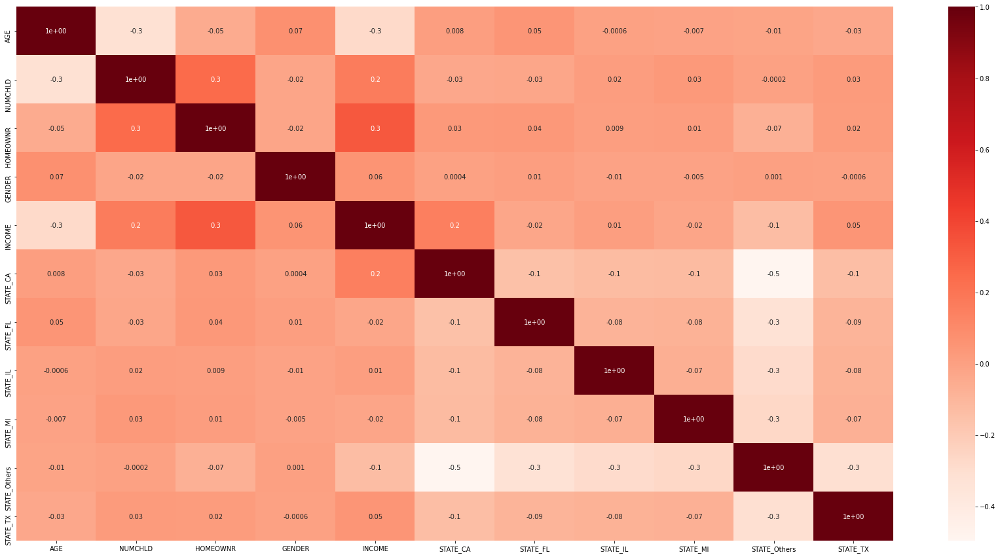

In [54]:
#Using Spearman correlation
%matplotlib inline

def cor_heatmap(cor):
    plt.figure(figsize=(30,15))
    sns.heatmap(data = cor, annot = True, cmap = plt.cm.Reds, fmt='.1')
    plt.show()

cor_spearman = df_dem.corr(method ='spearman')
cor_heatmap(cor_spearman)

In [126]:
from sklearn.feature_selection import SelectFromModel
from sklearn.ensemble import RandomForestRegressor

def corr_rf(df):
    feature_table = pd.DataFrame(index=df.columns)
    i=0
    for col in df:
        embeded_rf_selector = SelectFromModel(RandomForestRegressor(n_estimators=100), max_features=len(df.columns)-1)
        embeded_rf_selector.fit(df.drop(col,axis=1), df[col])
        embeded_rf_support = embeded_rf_selector.get_support()
        embeded_rf_support = list(embeded_rf_support)
        embeded_rf_support.insert(i,True)
        i+=1

        feature_table[col]=embeded_rf_support
    feature_table['Total'] = np.sum(feature_table, axis=1)
    feature_table = feature_table.sort_values(['Total'] , ascending=False)
    return feature_table

corr_rf(df_dem)

,AGE,NUMCHLD,HOMEOWNR,GENDER,INCOME,STATE_CA,STATE_FL,STATE_IL,STATE_MI,STATE_Others,STATE_TX,Total
STATE_IL,False,False,False,False,False,True,True,True,True,True,True,6
STATE_MI,False,False,False,False,False,True,True,True,True,True,True,6
STATE_TX,False,False,False,False,False,True,True,True,True,True,True,6
AGE,True,True,True,True,True,False,False,False,False,False,False,5
INCOME,True,True,True,True,True,False,False,False,False,False,False,5
STATE_FL,False,False,False,False,False,True,True,True,False,True,True,5
HOMEOWNR,False,True,True,True,True,False,False,False,False,False,False,4
STATE_CA,False,False,False,False,False,True,True,False,False,True,True,4
STATE_Others,False,False,False,False,False,True,True,False,False,True,False,3
NUMCHLD,True,True,False,False,False,False,False,False,False,False,False,2


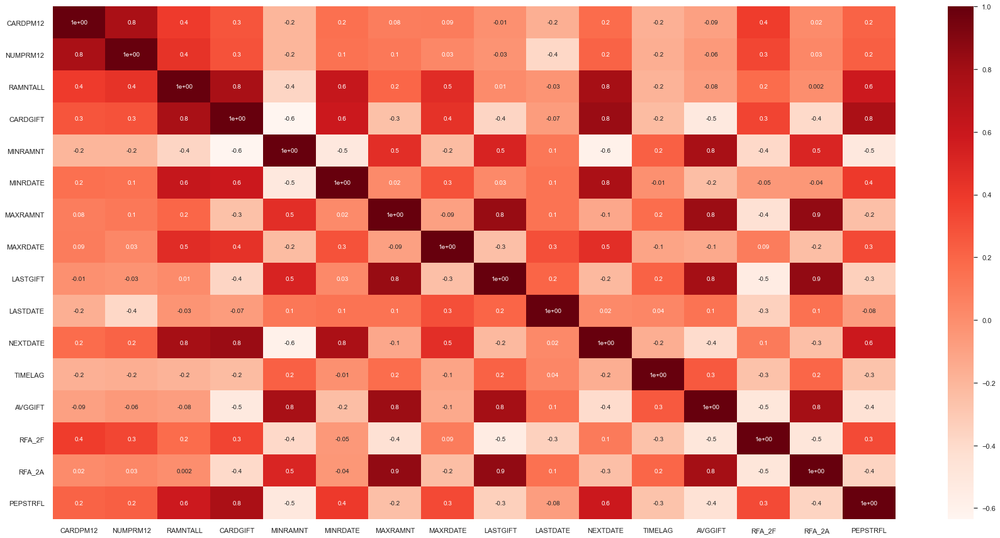

In [130]:
#Using Spearman correlation
%matplotlib inline

def cor_heatmap(cor):
    plt.figure(figsize=(30,15))
    sns.heatmap(data = cor, annot = True, cmap = plt.cm.Reds, fmt='.1')
    plt.show()

cor_spearman = df_sum.corr(method ='spearman')
cor_heatmap(cor_spearman)

In [23]:
df_sum.drop(['MAXADATE', 'MAJOR'], axis=1, inplace=True)  #no correlation

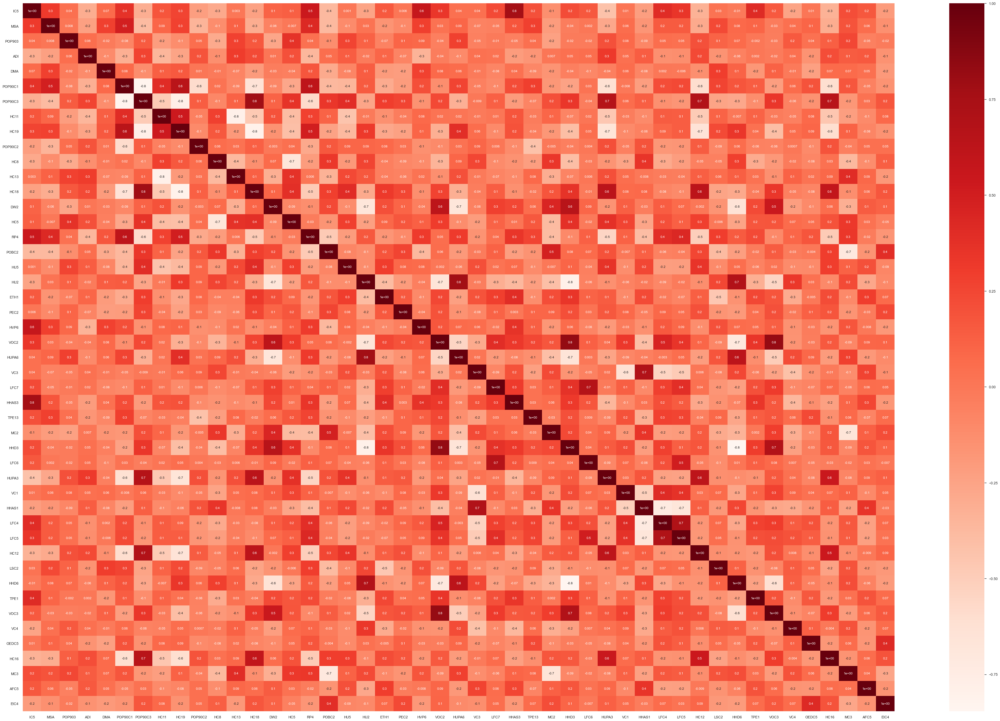

In [179]:
#Using Spearman correlation
%matplotlib inline

def cor_heatmap(cor):
    plt.figure(figsize=(60,40))
    sns.heatmap(data = cor, annot = True, cmap = plt.cm.Reds, fmt='.1')
    plt.show()

cor_spearman = df_cen.corr(method ='spearman')
cor_heatmap(cor_spearman)

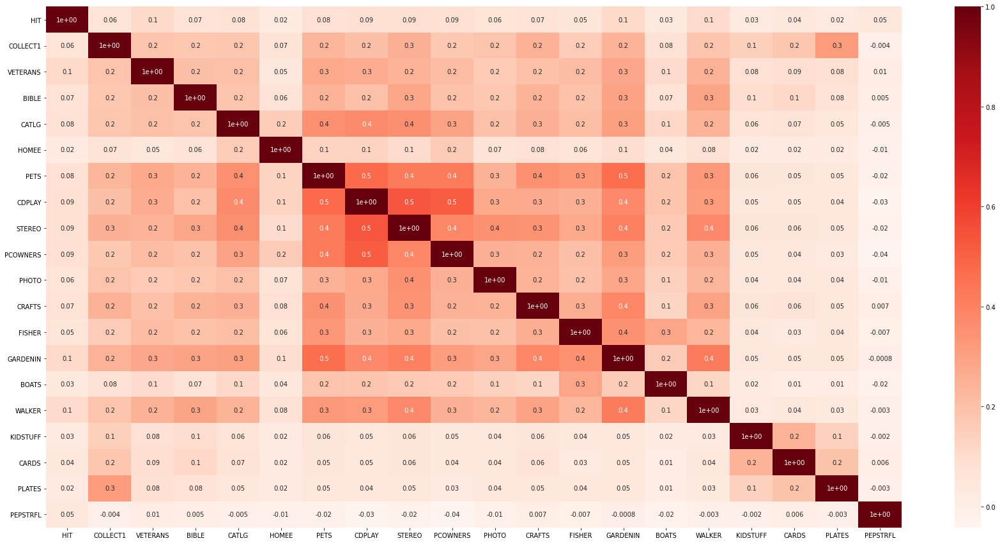

In [58]:
#Using Spearman correlation
%matplotlib inline

def cor_heatmap(cor):
    plt.figure(figsize=(30,15))
    sns.heatmap(data = cor, annot = True, cmap = plt.cm.Reds, fmt='.1')
    plt.show()

cor_spearman = df_int.corr(method ='spearman')
cor_heatmap(cor_spearman)

In [123]:
#PEPSTRFL, HOMEE E HIT FAZER DROP

## PCA for census variables

<a class="anchor" id="pca">

In [292]:
#experimentamos e nao usamos, nao achamos que fosse necessario

In [258]:
# Use PCA to reduce dimensionality of data
pca = PCA()
pca_feat = pca.fit_transform(df_cen)
pca_feat  

# Output PCA table
pd.DataFrame(
    {"Eigenvalue": pca.explained_variance_,
     "Difference": np.insert(np.diff(pca.explained_variance_), 0, 0),
     "Proportion": pca.explained_variance_ratio_,
     "Cumulative": np.cumsum(pca.explained_variance_ratio_)},
    index=range(1, pca.n_components_ + 1)
)

,Eigenvalue,Difference,Proportion,Cumulative
1,7.905290,0.000000,0.179664,0.179664
2,5.953856,-1.951434,0.135313,0.314977
3,4.201096,-1.752760,0.095478,0.410456
4,3.936020,-0.265076,0.089454,0.499910
5,2.115360,-1.820660,0.048076,0.547986
6,1.881942,-0.233419,0.042771,0.590756
7,1.677236,-0.204705,0.038119,0.628875
8,1.402463,-0.274773,0.031874,0.660749
9,1.111232,-0.291232,0.025255,0.686004
10,1.020737,-0.090495,0.023198,0.709202


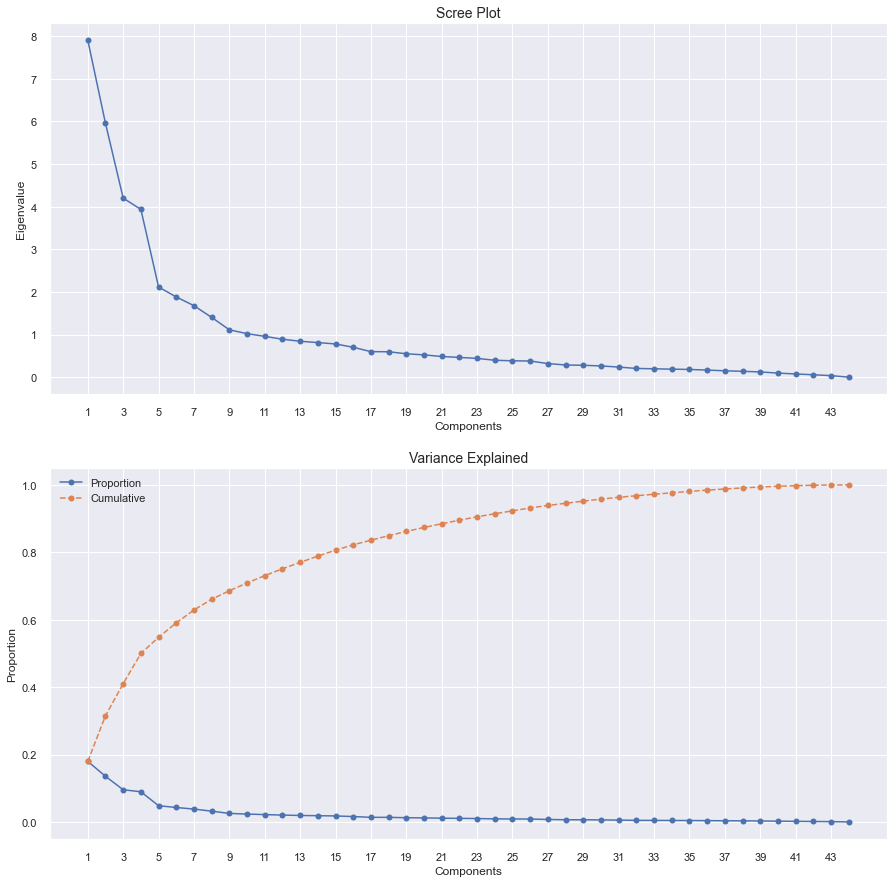

In [259]:
%matplotlib inline
# figure and axes
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 15))

# draw plots
ax1.plot(pca.explained_variance_, marker=".", markersize=12)
ax2.plot(pca.explained_variance_ratio_, marker=".", markersize=12, label="Proportion")
ax2.plot(np.cumsum(pca.explained_variance_ratio_), marker=".", markersize=12, linestyle="--", label="Cumulative")

# customizations
ax2.legend()
ax1.set_title("Scree Plot", fontsize=14)
ax2.set_title("Variance Explained", fontsize=14)
ax1.set_ylabel("Eigenvalue")
ax2.set_ylabel("Proportion")
ax1.set_xlabel("Components")
ax2.set_xlabel("Components")
ax1.set_xticks(range(0, pca.n_components_, 2))
ax1.set_xticklabels(range(1, pca.n_components_ + 1, 2))
ax2.set_xticks(range(0, pca.n_components_, 2))
ax2.set_xticklabels(range(1, pca.n_components_ + 1, 2))

plt.show()

In [260]:
pca = PCA(n_components=7)
pca_feat = pca.fit_transform(df_cen)
pca_feat_names = [f"PC{i}" for i in range(pca.n_components_)]
pca_df = pd.DataFrame(pca_feat, index=df_cen.index, columns=pca_feat_names)  
pca_df

,PC0,PC1,PC2,PC3,PC4,PC5,PC6
CONTROLN,,,,,,,
95515,-2.408221,0.101923,-1.323414,-1.291452,-0.421332,-1.056894,-0.846627
148535,-1.292321,-5.845610,-0.888832,0.906693,2.395407,1.751108,3.156739
15078,-3.648010,1.681980,1.385633,-1.466670,-0.652436,1.169754,-1.292910
172556,-1.144774,3.372742,0.841250,-2.453636,2.452960,0.903020,1.984479
7112,0.446927,1.959718,-1.192694,-1.144573,1.902857,-0.406280,1.121172
...,...,...,...,...,...,...,...
184568,2.172393,-2.905227,1.913579,0.570003,-0.603130,-0.036392,1.483605
122706,-0.834068,-3.793905,1.852519,1.408131,1.322322,-1.488468,1.587608
189641,1.554024,-0.861986,-1.583491,-3.228019,-0.063700,0.178429,0.790787


In [261]:
# Reassigning df to contain pca variables
df_pca_cen = pd.concat([df_cen, pca_df], axis=1)  #df_pca1 em vez disto se calhar devia ser df_[numerical_data] - para nao incluir a normalizacao
df_pca_cen.head()

,IC5,POP903,POP90C1,POP90C3,HC11,HC19,POP90C2,HC8,HC13,HC18,DW2,HC5,RP4,POBC2,HU5,HU2,ETH1,PEC2,HVP6,VOC2,HUPA6,VC3,LFC7,HHAS3,TPE13,MC2,HHD3,LFC6,HUPA3,VC1,HHAS1,LFC4,LFC5,HC12,LSC2,HHD6,TPE1,VOC3,VC4,OEDC5,HC16,MC3,AFC5,EIC4,PC0,PC1,PC2,PC3,PC4,PC5,PC6
CONTROLN,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
95515,-0.352473,-0.424938,-1.247266,0.959688,1.061732,-0.924867,0.678899,0.306590,-0.717164,1.851259,1.101689,-0.372590,-0.179904,0.773495,-0.325189,-0.752620,0.326534,-0.289322,-0.357930,0.891926,-0.621009,-0.930579,0.222571,0.460536,-0.944426,0.179597,0.697272,-0.179167,-0.597726,0.218715,0.074797,-0.479078,-0.736888,-0.573939,0.165141,-0.107562,1.002969,-0.115303,0.432684,0.747362,-0.512595,-0.916860,0.738342,2.368015,-2.408221,0.101923,-1.323414,-1.291452,-0.421332,-1.056894,-0.846627
148535,2.406506,-0.108115,0.844518,-0.657877,1.230893,0.754386,-0.438131,-1.168788,-0.931870,-0.571457,1.257643,1.381534,0.721196,-0.878214,-0.229971,-1.236379,-0.949901,-0.865113,4.838648,1.728501,-0.621009,-1.347170,0.462203,1.363070,0.628741,-0.470900,1.873973,-0.047884,-0.597726,1.691006,-1.536216,0.781314,0.275543,-0.573939,0.082030,-1.042099,0.283438,3.057497,-1.069701,-0.113329,-0.512595,-0.327475,-1.643113,-0.410769,-1.292321,-5.845610,-0.888832,0.906693,2.395407,1.751108,3.156739
15078,-0.507290,0.686797,-1.247266,1.780913,-1.475684,-1.579491,-0.374301,-0.174511,0.177446,2.298530,0.087994,0.003294,-1.424280,1.245412,0.198510,-0.365614,0.530764,0.129435,-0.357930,0.222666,-0.451667,-0.097398,0.761744,-0.742842,0.023677,0.699995,0.370411,0.871096,1.065822,-0.201939,0.074797,-0.034234,0.197664,-0.078091,-0.250410,-0.277478,-0.256210,0.817873,-0.318508,0.364832,0.926209,-0.425706,-1.047750,1.574077,-3.648010,1.681980,1.385633,-1.466670,-0.652436,1.169754,-1.292910
172556,-0.086312,-0.478694,-1.247266,1.631599,-0.206976,-1.437182,-0.182810,0.595251,-0.466673,2.298530,0.633830,-0.163766,-1.853375,0.443153,-0.372798,1.085661,-1.256245,-0.079944,0.194897,-1.004311,-0.621009,-0.156911,-1.095406,-1.043687,-1.065439,0.179597,0.108922,-2.082769,0.026104,-1.183467,-0.364570,-0.182515,-0.659009,1.244169,2.907774,-0.107562,-1.695272,0.631238,0.432684,1.608053,1.022129,-0.916860,-0.849295,-1.403192,-1.144774,3.372742,0.841250,-2.453636,2.452960,0.903020,1.984479
7112,-0.713396,-0.220858,0.844518,-0.657877,-1.221943,-1.465644,-0.438131,0.980132,1.501467,-0.534184,1.218654,-0.832003,0.249191,0.348770,-0.658452,-0.946124,-4.268632,-0.917457,-0.357930,-0.892767,-0.621009,1.152375,-1.095406,-1.946221,0.931273,1.870889,-0.675545,1.002379,-0.597726,-1.534012,0.587393,-0.404937,-0.347491,0.583039,-0.499740,-0.787225,-0.346152,-0.208621,0.808280,-2.025976,-0.512595,-0.818629,-0.353158,-1.601676,0.446927,1.959718,-1.192694,-1.144573,1.902857,-0.406280,1.121172


In [262]:
metric_features = df_cen.columns.tolist()

def _color_red_or_green(val):
    if val < -0.45:
        color = 'background-color: red'
    elif val > 0.45:
        color = 'background-color: green'
    else:
        color = ''
    return color

# Interpreting each Principal Component
loadings = df_pca_cen.corr().loc[metric_features, pca_feat_names]
loadings.style.applymap(_color_red_or_green)

,PC0,PC1,PC2,PC3,PC4,PC5,PC6
IC5,0.0887631,-0.458775,-0.197458,0.515239,0.0901928,0.419158,0.0902834
POP903,0.0817305,0.0275576,0.165108,0.0317627,-0.000900899,-0.0116581,-0.0500314
POP90C1,0.60251,-0.495357,-0.169157,0.0951189,0.330187,0.0952618,-0.158861
POP90C3,-0.711276,0.40176,0.305665,-0.0825564,-0.0122109,0.256025,0.011627
HC11,0.295864,-0.372001,-0.61212,-0.283677,0.0517965,-0.0699901,0.0603446
HC19,0.732563,-0.306095,-0.357873,0.0243697,-0.0664348,-0.207416,0.00503116
POP90C2,-0.0031649,0.229083,-0.135706,-0.0369042,-0.486867,-0.475562,0.217519
HC8,0.254921,0.266942,-0.552257,-0.383911,-0.0550678,0.179846,0.0255413
HC13,0.128733,0.0808216,0.550554,0.452402,-0.0257979,-0.151311,-0.156952
HC18,-0.645874,0.271488,0.270169,-0.0786834,0.00987965,0.296036,-0.0483014


In [263]:
df_pca_cen[pca_feat_names]

,PC0,PC1,PC2,PC3,PC4,PC5,PC6
CONTROLN,,,,,,,
95515,-2.408221,0.101923,-1.323414,-1.291452,-0.421332,-1.056894,-0.846627
148535,-1.292321,-5.845610,-0.888832,0.906693,2.395407,1.751108,3.156739
15078,-3.648010,1.681980,1.385633,-1.466670,-0.652436,1.169754,-1.292910
172556,-1.144774,3.372742,0.841250,-2.453636,2.452960,0.903020,1.984479
7112,0.446927,1.959718,-1.192694,-1.144573,1.902857,-0.406280,1.121172
...,...,...,...,...,...,...,...
184568,2.172393,-2.905227,1.913579,0.570003,-0.603130,-0.036392,1.483605
122706,-0.834068,-3.793905,1.852519,1.408131,1.322322,-1.488468,1.587608
189641,1.554024,-0.861986,-1.583491,-3.228019,-0.063700,0.178429,0.790787


In [264]:
df_pca_cen[metric_features]

,IC5,POP903,POP90C1,POP90C3,HC11,HC19,POP90C2,HC8,HC13,HC18,DW2,HC5,RP4,POBC2,HU5,HU2,ETH1,PEC2,HVP6,VOC2,HUPA6,VC3,LFC7,HHAS3,TPE13,MC2,HHD3,LFC6,HUPA3,VC1,HHAS1,LFC4,LFC5,HC12,LSC2,HHD6,TPE1,VOC3,VC4,OEDC5,HC16,MC3,AFC5,EIC4
CONTROLN,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
95515,-0.352473,-0.424938,-1.247266,0.959688,1.061732,-0.924867,0.678899,0.306590,-0.717164,1.851259,1.101689,-0.372590,-0.179904,0.773495,-0.325189,-0.752620,0.326534,-0.289322,-0.357930,0.891926,-0.621009,-0.930579,0.222571,0.460536,-0.944426,0.179597,0.697272,-0.179167,-0.597726,0.218715,0.074797,-0.479078,-0.736888,-0.573939,0.165141,-0.107562,1.002969,-0.115303,0.432684,0.747362,-0.512595,-0.916860,0.738342,2.368015
148535,2.406506,-0.108115,0.844518,-0.657877,1.230893,0.754386,-0.438131,-1.168788,-0.931870,-0.571457,1.257643,1.381534,0.721196,-0.878214,-0.229971,-1.236379,-0.949901,-0.865113,4.838648,1.728501,-0.621009,-1.347170,0.462203,1.363070,0.628741,-0.470900,1.873973,-0.047884,-0.597726,1.691006,-1.536216,0.781314,0.275543,-0.573939,0.082030,-1.042099,0.283438,3.057497,-1.069701,-0.113329,-0.512595,-0.327475,-1.643113,-0.410769
15078,-0.507290,0.686797,-1.247266,1.780913,-1.475684,-1.579491,-0.374301,-0.174511,0.177446,2.298530,0.087994,0.003294,-1.424280,1.245412,0.198510,-0.365614,0.530764,0.129435,-0.357930,0.222666,-0.451667,-0.097398,0.761744,-0.742842,0.023677,0.699995,0.370411,0.871096,1.065822,-0.201939,0.074797,-0.034234,0.197664,-0.078091,-0.250410,-0.277478,-0.256210,0.817873,-0.318508,0.364832,0.926209,-0.425706,-1.047750,1.574077
172556,-0.086312,-0.478694,-1.247266,1.631599,-0.206976,-1.437182,-0.182810,0.595251,-0.466673,2.298530,0.633830,-0.163766,-1.853375,0.443153,-0.372798,1.085661,-1.256245,-0.079944,0.194897,-1.004311,-0.621009,-0.156911,-1.095406,-1.043687,-1.065439,0.179597,0.108922,-2.082769,0.026104,-1.183467,-0.364570,-0.182515,-0.659009,1.244169,2.907774,-0.107562,-1.695272,0.631238,0.432684,1.608053,1.022129,-0.916860,-0.849295,-1.403192
7112,-0.713396,-0.220858,0.844518,-0.657877,-1.221943,-1.465644,-0.438131,0.980132,1.501467,-0.534184,1.218654,-0.832003,0.249191,0.348770,-0.658452,-0.946124,-4.268632,-0.917457,-0.357930,-0.892767,-0.621009,1.152375,-1.095406,-1.946221,0.931273,1.870889,-0.675545,1.002379,-0.597726,-1.534012,0.587393,-0.404937,-0.347491,0.583039,-0.499740,-0.787225,-0.346152,-0.208621,0.808280,-2.025976,-0.512595,-0.818629,-0.353158,-1.601676
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
184568,0.349235,4.191832,0.844518,-0.657877,0.948958,0.725924,-0.438131,-0.880127,-0.645595,-0.310549,-1.120642,0.379178,0.849924,-1.491705,-0.515625,0.698654,-0.388269,-0.865113,-0.357930,-0.056192,0.056358,-1.347170,0.462203,1.603746,0.507728,-0.926248,-0.217939,0.280323,0.303363,1.200243,-1.316533,0.929596,1.210094,-0.491298,-0.250410,-0.022604,-0.076328,-0.115303,1.277775,-1.069652,-0.416675,1.440679,0.341433,-1.303950
122706,1.264986,-0.411143,0.781131,-0.558335,0.836184,-0.156396,-0.438131,-0.976347,-0.502457,0.583992,0.828772,2.801540,0.077553,-0.311914,-0.658452,-0.849372,0.275477,-0.812768,-0.081516,1.282328,-0.621009,-0.871066,-0.376509,1.062225,0.023677,-2.227241,1.677856,-1.098147,0.095419,0.849697,-1.389761,1.226159,-0.113854,-0.408657,-0.250410,-1.127056,0.283438,0.817873,0.338785,0.747362,-0.512595,2.324757,-0.055477,-0.807738
189641,-0.435982,-0.485353,0.844518,-0.657877,1.259086,0.754386,-0.438131,2.006481,-1.075007,-0.571457,1.101689,-0.957298,0.592467,1.151028,-0.182362,0.214896,-0.184040,0.338813,-0.357930,-1.060082,-0.621009,-0.811553,-1.514762,-1.043687,0.507728,0.374746,-1.067779,0.805454,-0.597726,1.060024,-1.243305,-0.034234,1.210094,-0.573939,-0.084190,0.232269,0.553262,-0.768527,0.808280,-1.739079,-0.128914,-0.916860,-1.345431,-0.311527


In [ ]:
# Do this after checking the new pandas profiling report
#df_pca2.drop(columns=['PC11], inplace=True)

# Clustering

## Testing on K-means and Hierarchical clustering

<a class="anchor" id="hier">

In [24]:
def kelbowplots(clus_estim, data):
    """
    This function produces the k-elbow plot for a given clustering estimator according to 2 different clustering quality measures: "Distortion" and "Calinski Harabasz".
    """
    sns.set()
    fig, axes = plt.subplots(1, 2, figsize=(20,7))

    # Plot the data
    metrics = ["distortion", "calinski_harabasz"]
    ylabels = ["Distortion measure", "Calinski Harabasz measure"]
    titles = ["Distortion measure plot", "Calinski Harabasz measure plot"]
    for ax, m, yl, tl in zip(axes.flatten(), metrics, ylabels, titles):
        # KElbowVisualizer produces the elbow plot for several quality measures
        KElbowVisualizer(clus_estim, metric=m, timings=False, locate_elbow=False, ax=ax).fit(data)
        ax.invert_xaxis()
        ax.set_ylabel(yl, fontsize=13)
        ax.set_xlabel("Number of clusters", fontsize=13)
        ax.set_title(tl, fontsize=13)

    # Set figure
    plt.suptitle("K-Elbow Plots", fontsize=23)

    plt.show()

In [25]:
#K means Clustering 
def clus_Kmeans(df, nclust):
    model = KMeans(nclust, random_state=0)
    model.fit(df)
    clust_labels = model.predict(df)
    cent = model.cluster_centers_
    return (clust_labels, cent)

In [26]:
def get_ss(df):
    """Computes the sum of squares for all variables given a dataset
    """
    ss = np.sum(df.var() * (df.count() - 1))
    return ss  # return sum of sum of squares of each df variable

def r2(df, labels):
    sst = get_ss(df)
    ssw = np.sum(df.groupby(labels).apply(get_ss))
    return 1 - ssw/sst
    
def get_r2_scores(df, clusterer, min_k=2, max_k=10):
    """
    Loop over different values of k. To be used with sklearn clusterers.
    """
    r2_clust = {}
    for n in range(min_k, max_k):
        clust = clone(clusterer).set_params(n_clusters=n)
        labels = clust.fit_predict(df)
        r2_clust[n] = r2(df, labels)
    return r2_clust


# Set up the clusterers
kmeans = KMeans(
    init='k-means++',
    n_init=20,
    random_state=42
)

hierarchical = AgglomerativeClustering(
    affinity='euclidean'
)

In [27]:
def get_ss_variables(df):
    """Get the SS for each variable
    """
    ss_vars = df.var() * (df.count() - 1)
    return ss_vars

def r2_variables(df, labels):
    """Get the R² for each variable
    """
    sst_vars = get_ss_variables(df)
    ssw_vars = np.sum(df.groupby(labels).apply(get_ss_variables))
    return 1 - ssw_vars/sst_vars

In [28]:
def get_r2_hc(df, link_method, max_nclus, min_nclus=1, dist="euclidean"):
    """This function computes the R2 for a set of cluster solutions given by the application of a hierarchical method.
    The R2 is a measure of the homogenity of a cluster solution. It is based on SSt = SSw + SSb and R2 = SSb/SSt. 
    
    Parameters:
    df (DataFrame): Dataset to apply clustering
    link_method (str): either "ward", "complete", "average", "single"
    max_nclus (int): maximum number of clusters to compare the methods
    min_nclus (int): minimum number of clusters to compare the methods. Defaults to 1.
    dist (str): distance to use to compute the clustering solution. Must be a valid distance. Defaults to "euclidean".
    
    Returns:
    ndarray: R2 values for the range of cluster solutions
    """
    def get_ss(df):
        ss = np.sum(df.var() * (df.count() - 1))
        return ss  # return sum of sum of squares of each df variable
    
    sst = get_ss(df)  # get total sum of squares
    
    r2 = []  # where we will store the R2 metrics for each cluster solution
    
    for i in range(min_nclus, max_nclus+1):  # iterate over desired ncluster range
        cluster = AgglomerativeClustering(n_clusters=i, affinity=dist, linkage=link_method)
        hclabels = cluster.fit_predict(df) #get cluster labels
        df_concat = pd.concat((df, pd.Series(hclabels, name='labels')), axis=1)  # concat df with labels
        ssw_labels = df_concat.groupby(by='labels').apply(get_ss)  # compute ssw for each cluster labels
        ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
        r2.append(ssb / sst)  # save the R2 of the given cluster solution
        
    return np.array(r2)

In [29]:
def cluster_profiles(df, label_columns, figsize, compar_titles=None):
    """
    Pass df with labels columns of one or multiple clustering labels. 
    Then specify this label columns to perform the cluster profile according to them.
    """
    if compar_titles == None:
        compar_titles = [""]*len(label_columns)
        
    sns.set()
    fig, axes = plt.subplots(nrows=len(label_columns), ncols=2, figsize=figsize, squeeze=False)
    for ax, label, titl in zip(axes, label_columns, compar_titles):
        # Filtering df
        drop_cols = [i for i in label_columns if i!=label]
        dfax = df.drop(drop_cols, axis=1)
        
        # Getting the cluster centroids and counts
        centroids = dfax.groupby(by=label, as_index=False).mean()
        counts = dfax.groupby(by=label, as_index=False).count().iloc[:,[0,1]]
        counts.columns = [label, "counts"]
        
        # Setting Data
        pd.plotting.parallel_coordinates(centroids, label, color=sns.color_palette(), ax=ax[0])
        sns.barplot(x=label, y="counts", data=counts, ax=ax[1])

        #Setting Layout
        handles, _ = ax[0].get_legend_handles_labels()
        cluster_labels = ["Cluster {}".format(i) for i in range(len(handles))]
        ax[0].annotate(s=titl, xy=(0.95,1.1), xycoords='axes fraction', fontsize=13, fontweight = 'heavy') 
        ax[0].legend(handles, cluster_labels) # Adaptable to number of clusters
        ax[0].axhline(color="black", linestyle="--")
        ax[0].set_title("Cluster Means - {} Clusters".format(len(handles)), fontsize=13)
        ax[0].set_xticklabels(ax[0].get_xticklabels(), rotation=-20)
        ax[1].set_xticklabels(cluster_labels)
        ax[1].set_xlabel("")
        ax[1].set_ylabel("Absolute Frequency")
        ax[1].set_title("Cluster Sizes - {} Clusters".format(len(handles)), fontsize=13)
    
    plt.subplots_adjust(hspace=0.4, top=0.90)
    plt.suptitle("Cluster Simple Profilling", fontsize=23)
    plt.show()


### Sample of the dataframe

https://datascience.stackexchange.com/questions/47889/how-to-run-agglomerativeclustering-on-a-big-data-in-python

In [30]:
df_dem = df_dem.drop(['STATE_CA', 'STATE_FL', 'STATE_IL', 'STATE_MI', 'STATE_Others', 'STATE_TX'], axis=1)
#only the metric features

In [60]:
df_sample = df_.sample(n=20000)
df_dem_sample = df_dem.sample(n=20000)
df_sum_sample = df_sum.sample(n=20000)
df_cen_sample = df_cen.sample(n=20000)
df_int_sample = df_int.sample(n=20000)

df_pca_sample = df_pca_cen[pca_feat_names].sample(n=20000)

#we've runned this cell and the ones below 4x times we got the same final results

### Finding the optimal clusterer on demographic variables

<a class="anchor" id="r2">

In [61]:
# Obtaining the R² scores for each cluster solution on demographic variables
r2_scores = {}
r2_scores['kmeans'] = get_r2_scores(df_dem_sample, kmeans)

for linkage in ['complete', 'average', 'single', 'ward']:  #hierarchical
    r2_scores[linkage] = get_r2_scores(
        df_dem_sample, hierarchical.set_params(linkage=linkage)
    )
    
pd.DataFrame(r2_scores)

,kmeans,complete,average,single,ward
2,0.231600,0.102706,0.085805,0.000708,0.208784
3,0.377374,0.105978,0.087506,0.000955,0.352299
4,0.465850,0.188031,0.104195,0.234046,0.435171
5,0.550724,0.305951,0.104954,0.234212,0.503829
6,0.601864,0.316956,0.105401,0.235159,0.549493
7,0.641657,0.353812,0.119564,0.235463,0.590190
8,0.668813,0.357134,0.241099,0.235641,0.622083
9,0.692505,0.370460,0.245756,0.236474,0.649115


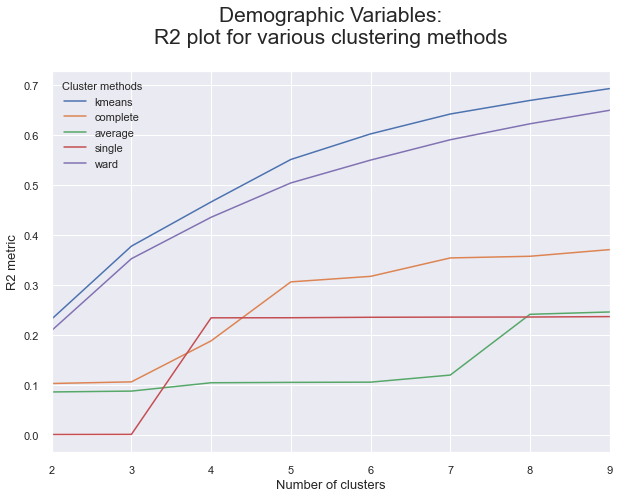

In [62]:
# Visualizing the R² scores for each cluster solution on demographic variables
pd.DataFrame(r2_scores).plot.line(figsize=(10,7))

plt.title("Demographic Variables:\nR2 plot for various clustering methods\n", fontsize=21)
plt.legend(title="Cluster methods", title_fontsize=11)
plt.xlabel("Number of clusters", fontsize=13)
plt.ylabel("R2 metric", fontsize=13)
plt.show()

#kmeans seems to be the best option, 5 clusters

### Repeat the process for summary variables

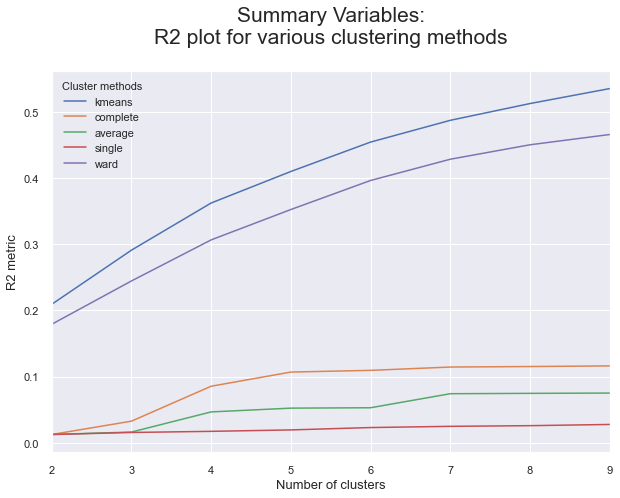

In [63]:
# Obtaining the R² scores for each cluster solution on product variables
r2_scores = {}
r2_scores['kmeans'] = get_r2_scores(df_sum_sample, kmeans)

for linkage in ['complete', 'average', 'single', 'ward']:
    r2_scores[linkage] = get_r2_scores(
        df_sum_sample, hierarchical.set_params(linkage=linkage)
    )

# Visualizing the R² scores for each cluster solution on product variables
pd.DataFrame(r2_scores).plot.line(figsize=(10,7))

plt.title("Summary Variables:\nR2 plot for various clustering methods\n", fontsize=21)
plt.legend(title="Cluster methods", title_fontsize=11)
plt.xlabel("Number of clusters", fontsize=13)
plt.ylabel("R2 metric", fontsize=13)
plt.show()

# clusters, kmeans, elbow


#4 to 6

### Repeat the process for census variables

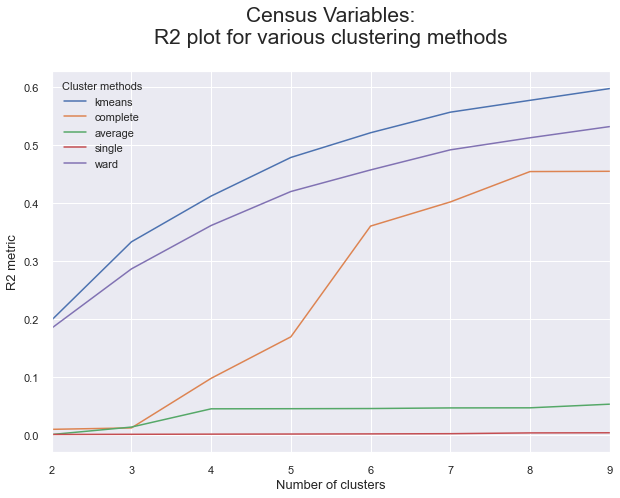

In [266]:
# Obtaining the R² scores for each cluster solution on product variables
r2_scores = {}
r2_scores['kmeans'] = get_r2_scores(df_pca_sample, kmeans)

for linkage in ['complete', 'average', 'single', 'ward']:
    r2_scores[linkage] = get_r2_scores(
        df_pca_sample, hierarchical.set_params(linkage=linkage)
    )

# Visualizing the R² scores for each cluster solution on product variables
pd.DataFrame(r2_scores).plot.line(figsize=(10,7))

plt.title("Census Variables:\nR2 plot for various clustering methods\n", fontsize=21)
plt.legend(title="Cluster methods", title_fontsize=11)
plt.xlabel("Number of clusters", fontsize=13)
plt.ylabel("R2 metric", fontsize=13)
plt.show()

# clusters, kmeans, elbow

#5

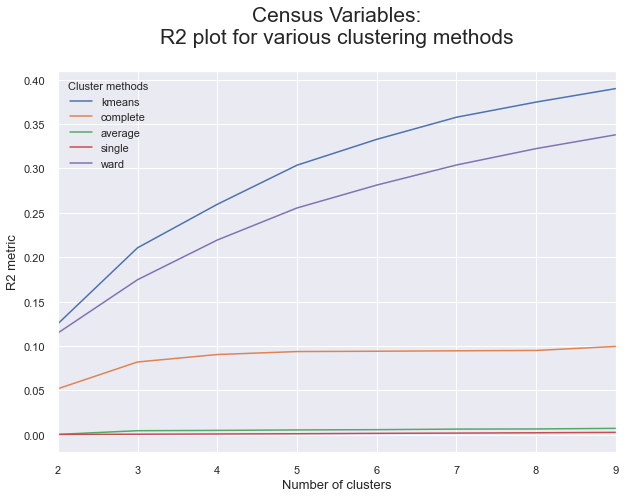

In [64]:
# Obtaining the R² scores for each cluster solution on product variables
r2_scores = {}
r2_scores['kmeans'] = get_r2_scores(df_cen_sample, kmeans)

for linkage in ['complete', 'average', 'single', 'ward']:
    r2_scores[linkage] = get_r2_scores(
        df_cen_sample, hierarchical.set_params(linkage=linkage)
    )

# Visualizing the R² scores for each cluster solution on product variables
pd.DataFrame(r2_scores).plot.line(figsize=(10,7))

plt.title("Census Variables:\nR2 plot for various clustering methods\n", fontsize=21)
plt.legend(title="Cluster methods", title_fontsize=11)
plt.xlabel("Number of clusters", fontsize=13)
plt.ylabel("R2 metric", fontsize=13)
plt.show()

# clusters, kmeans, elbow
#5

### Repeat the process for interest variables

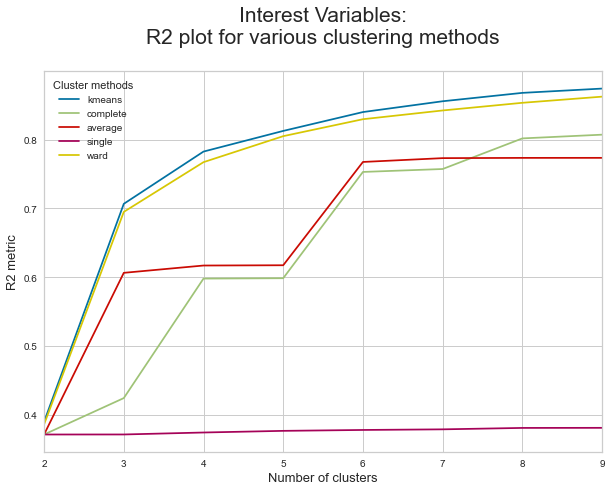

In [34]:
# Obtaining the R² scores for each cluster solution on product variables
r2_scores = {}
r2_scores['kmeans'] = get_r2_scores(df_int_sample, kmeans)

for linkage in ['complete', 'average', 'single', 'ward']:
    r2_scores[linkage] = get_r2_scores(
        df_int_sample, hierarchical.set_params(linkage=linkage)
    )

# Visualizing the R² scores for each cluster solution on product variables
pd.DataFrame(r2_scores).plot.line(figsize=(10,7))

plt.title("Interest Variables:\nR2 plot for various clustering methods\n", fontsize=21)
plt.legend(title="Cluster methods", title_fontsize=11)
plt.xlabel("Number of clusters", fontsize=13)
plt.ylabel("R2 metric", fontsize=13)
plt.show()

# clusters, kmeans, elbow

For our dataset, none of he hierarchical clusters seems to be as good as k-means, so we won't be testing with the hierarchical clustering.

## Demograghic segmentation

### Defining the number of clusters:


In [46]:
range_clusters = range(1, 11)

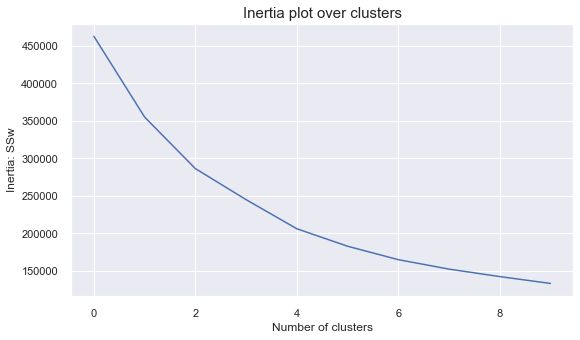

In [66]:
inertia = []
for n_clus in range_clusters:  # iterate over desired ncluster range
    kmclust = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
    kmclust.fit(df_dem)
    inertia.append(kmclust.inertia_)  # save the inertia of the given cluster solution

# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(inertia)
plt.ylabel("Inertia: SSw")
plt.xlabel("Number of clusters")
plt.title("Inertia plot over clusters", size=15)
plt.show()

#4

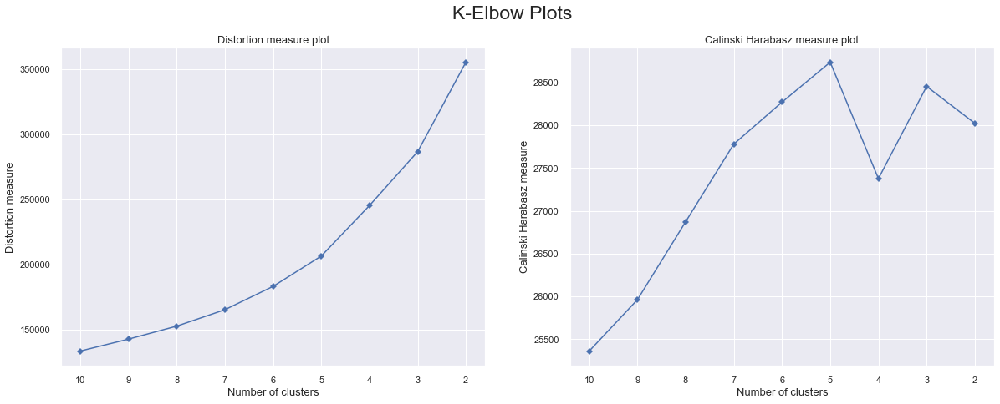

In [67]:
# Instantiate a scikit-learn K-Means model
clus_estim = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
# K-elbow plots
kelbowplots(clus_estim, df_dem)
#5 clusters

For n_clusters = 2, the average silhouette_score is : 0.26251763907397924
For n_clusters = 3, the average silhouette_score is : 0.286936170456073
For n_clusters = 4, the average silhouette_score is : 0.2849109456652177
For n_clusters = 5, the average silhouette_score is : 0.30436936068151965
For n_clusters = 6, the average silhouette_score is : 0.3209020243745266
For n_clusters = 7, the average silhouette_score is : 0.32631375509679317
For n_clusters = 8, the average silhouette_score is : 0.3208454506777561
For n_clusters = 9, the average silhouette_score is : 0.3311382498450741
For n_clusters = 10, the average silhouette_score is : 0.32964332940565433


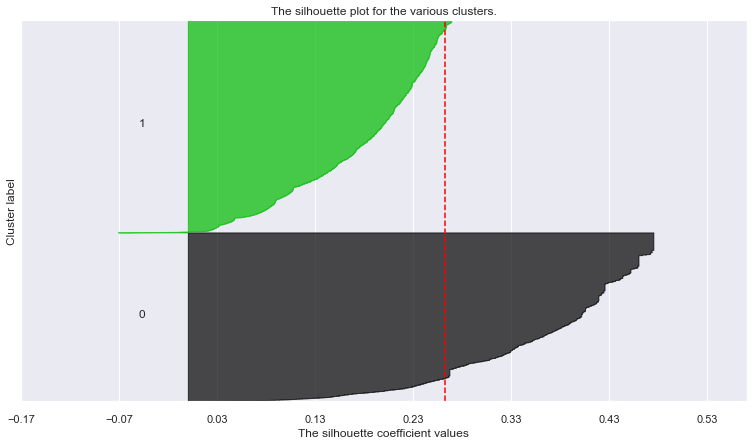

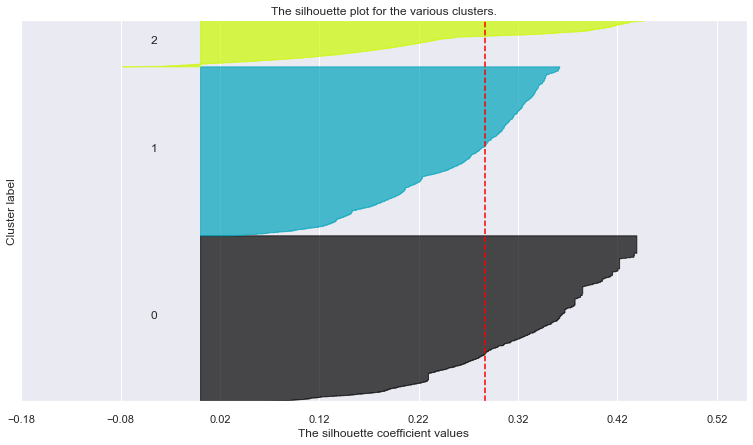

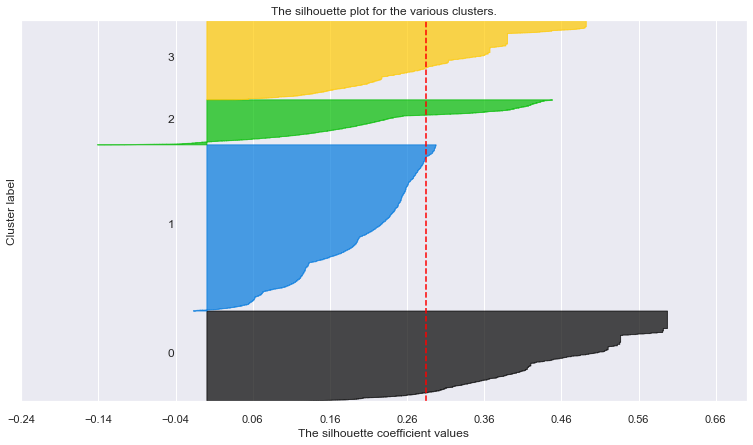

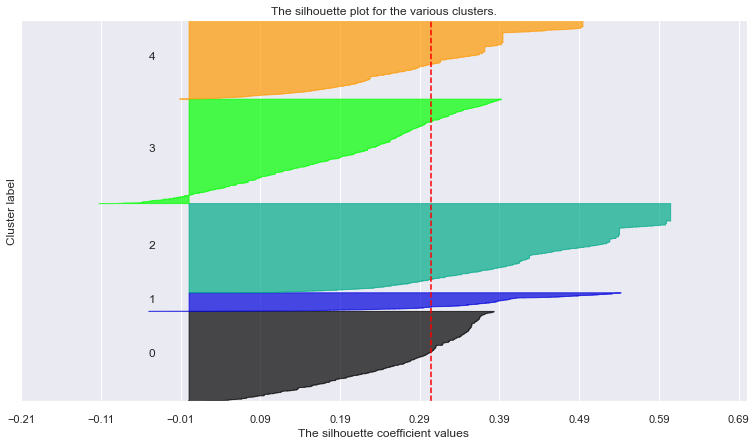

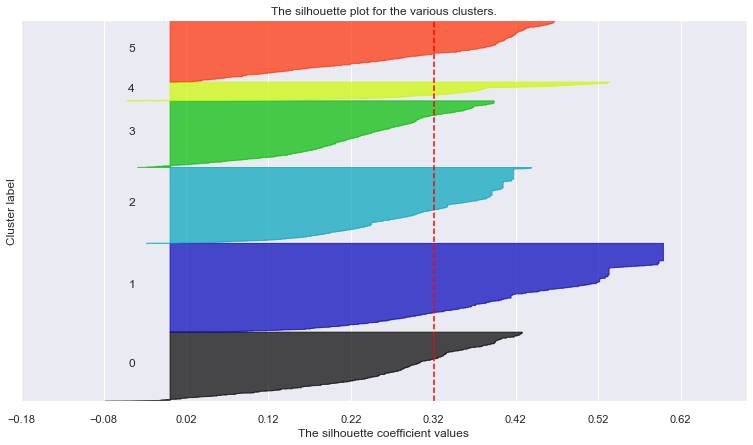

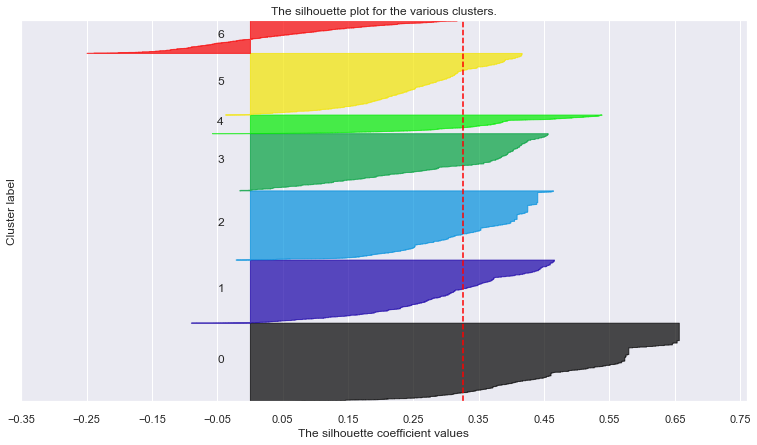

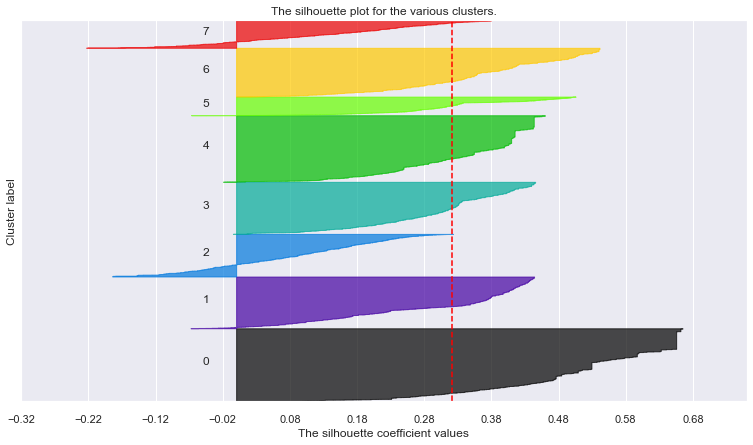

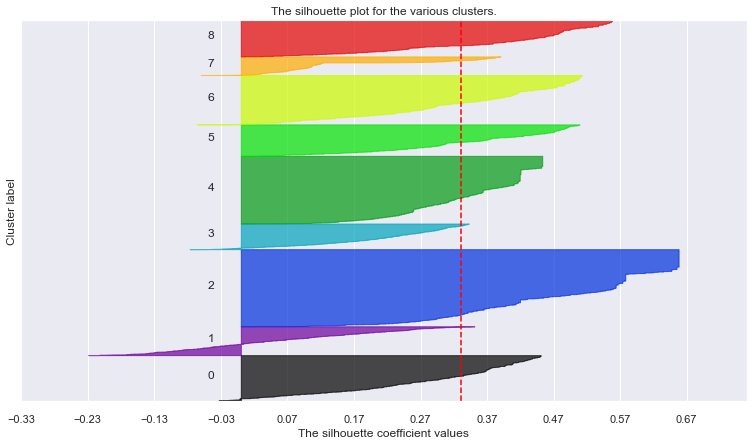

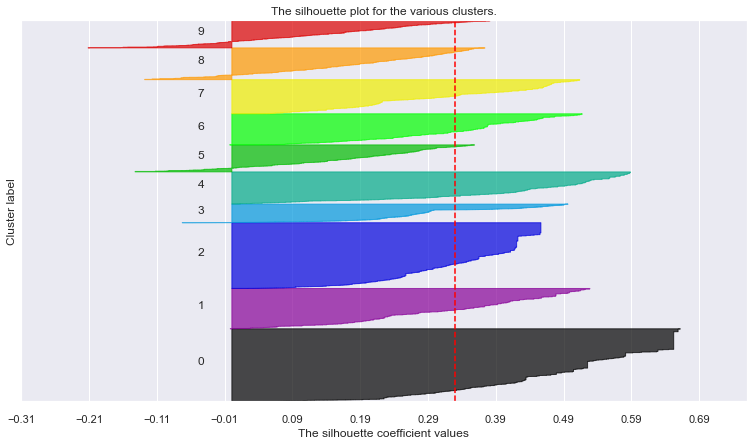

In [68]:
# Adapted from:
# https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html#sphx-glr-auto-examples-cluster-plot-kmeans-silhouette-analysis-py

# Storing average silhouette metric
avg_silhouette = []
for nclus in range_clusters:
    # Skip nclus == 1
    if nclus == 1:
        continue
    
    # Create a figure
    fig = plt.figure(figsize=(13, 7))

    # Initialize the KMeans object with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    kmclust = KMeans(n_clusters=nclus, init='k-means++', n_init=15, random_state=1)
    cluster_labels = kmclust.fit_predict(df_dem)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed clusters
    silhouette_avg = silhouette_score(df_dem, cluster_labels)
    avg_silhouette.append(silhouette_avg)
    print(f"For n_clusters = {nclus}, the average silhouette_score is : {silhouette_avg}")

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(df_dem, cluster_labels)

    y_lower = 10
    for i in range(nclus):
        # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()
        
        # Get y_upper to demarcate silhouette y range size
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        
        # Filling the silhouette
        color = cm.nipy_spectral(float(i) / nclus)
        plt.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    plt.title("The silhouette plot for the various clusters.")
    plt.xlabel("The silhouette coefficient values")
    plt.ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    plt.axvline(x=silhouette_avg, color="red", linestyle="--")
    
    # The silhouette coefficient can range from -1, 1
    xmin, xmax = np.round(sample_silhouette_values.min() -0.1, 2), np.round(sample_silhouette_values.max() + 0.1, 2)
    plt.xlim([xmin, xmax])
    
    # The (nclus+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    plt.ylim([0, len(df_dem) + (nclus + 1) * 10])

    plt.yticks([])  # Clear the yaxis labels / ticks
    plt.xticks(np.arange(xmin, xmax, 0.1))

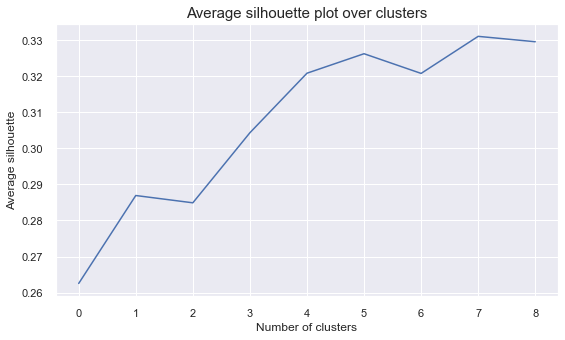

In [69]:
# The average silhouette plot
# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(avg_silhouette)
plt.ylabel("Average silhouette")
plt.xlabel("Number of clusters")
plt.title("Average silhouette plot over clusters", size=15)
plt.show()

#devia ser 5?

From the graphs above, the optimal number of clusters for the demographic segmentation is 5.

In [70]:
# Performing kmeans and appending the cluster labels to a new dataframe that keeps the cluster labels
clust_labels, cent = clus_Kmeans(df_dem, 5)
kmeans_dem_df = df_dem.copy()
kmeans_dem_df["kmeans_dem_labels"] = clust_labels

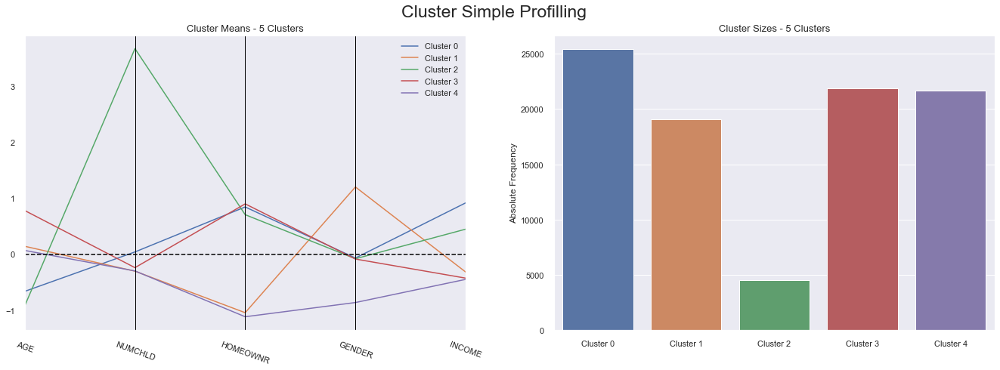

In [71]:
cluster_profiles(kmeans_dem_df, ["kmeans_dem_labels"], figsize=(23, 7))

In [72]:
# We are essentially decomposing the R² into the R² for each variable
r2_variables(kmeans_dem_df, ['kmeans_dem_labels']).drop('kmeans_dem_labels').sort_values()

AGE         0.310509
INCOME      0.350693
GENDER      0.473157
NUMCHLD     0.711448
HOMEOWNR    0.924388
dtype: float64

In [73]:
#R2 score

r2(kmeans_dem_df, ["kmeans_dem_labels"])

0.7017114523712487

## Summary segmentation

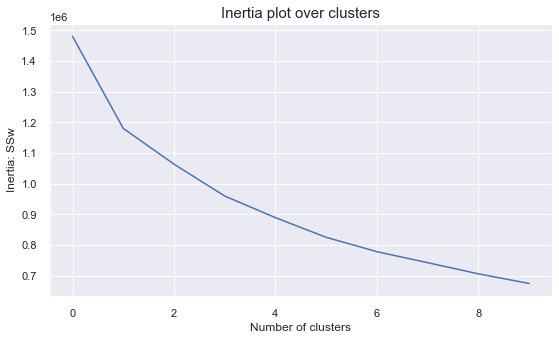

In [74]:
inertia = []
for n_clus in range_clusters:  # iterate over desired ncluster range
    kmclust = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
    kmclust.fit(df_sum)
    inertia.append(kmclust.inertia_)  # save the inertia of the given cluster solution

# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(inertia)
plt.ylabel("Inertia: SSw")
plt.xlabel("Number of clusters")
plt.title("Inertia plot over clusters", size=15)
plt.show()

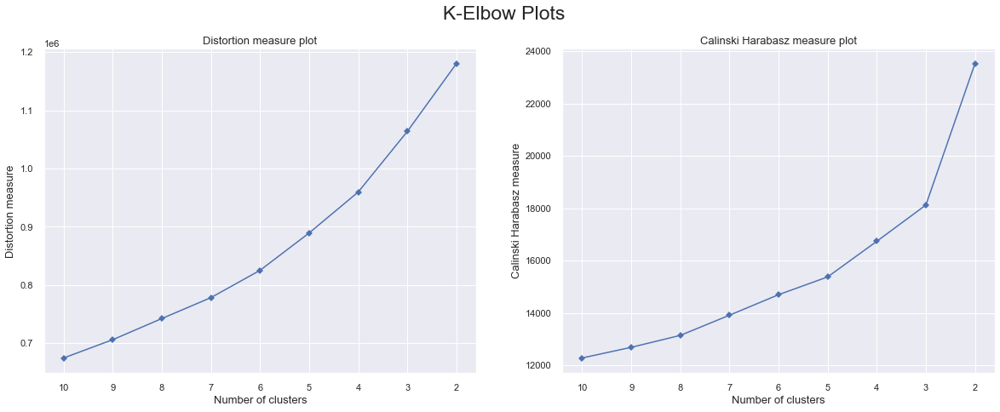

In [75]:
# Instantiate a scikit-learn K-Means model
clus_estim = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
# K-elbow plots
kelbowplots(clus_estim, df_sum)

For n_clusters = 2, the average silhouette_score is : 0.22278899862181592
For n_clusters = 3, the average silhouette_score is : 0.22579342274684783
For n_clusters = 4, the average silhouette_score is : 0.20547098584376602
For n_clusters = 5, the average silhouette_score is : 0.206881207565048
For n_clusters = 6, the average silhouette_score is : 0.1913465029889374
For n_clusters = 7, the average silhouette_score is : 0.16290423279027846
For n_clusters = 8, the average silhouette_score is : 0.16025932880776494
For n_clusters = 9, the average silhouette_score is : 0.1605390468913132
For n_clusters = 10, the average silhouette_score is : 0.16771161503542373


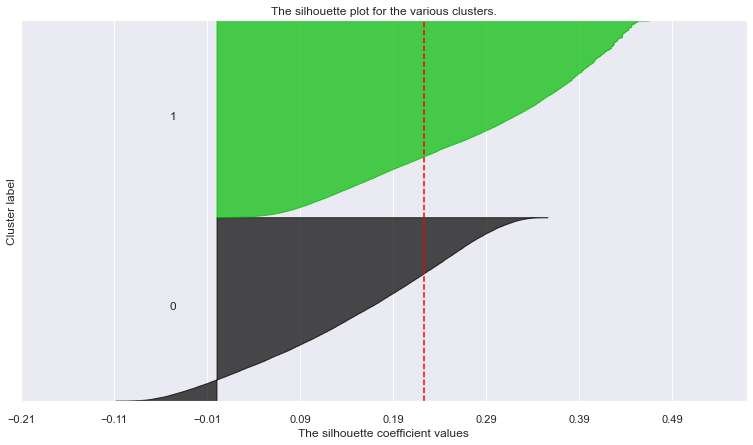

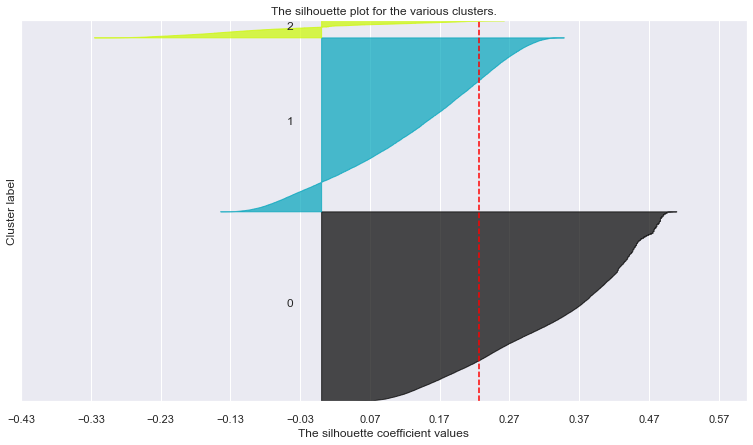

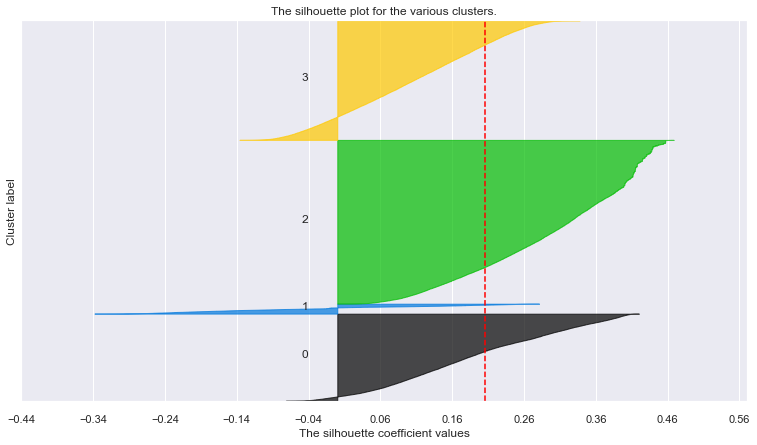

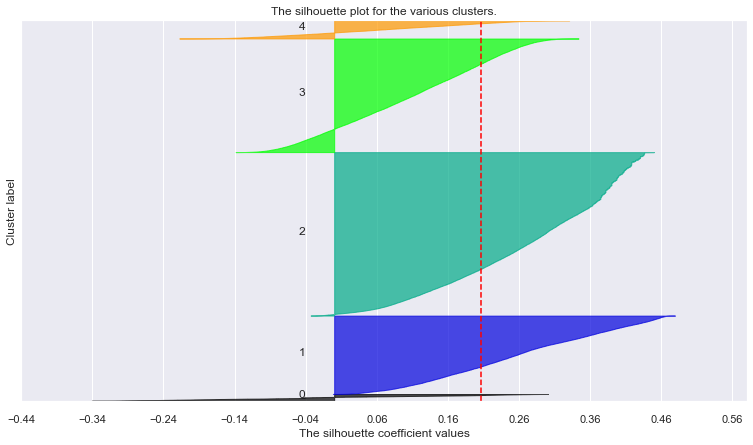

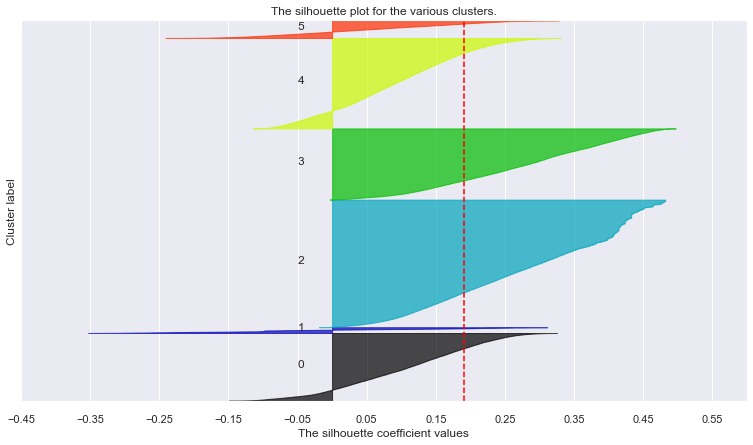

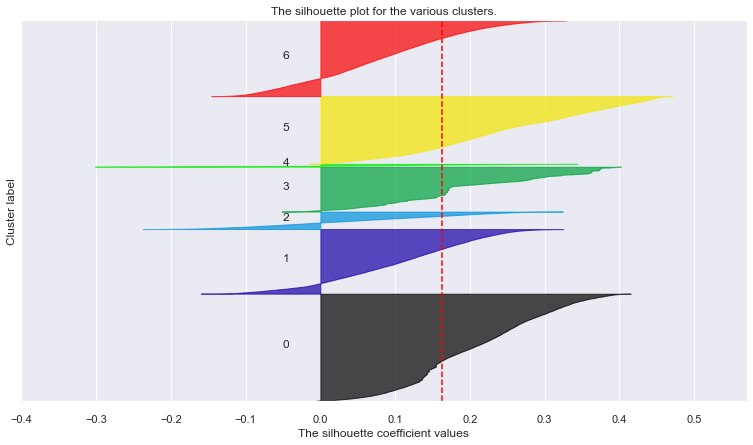

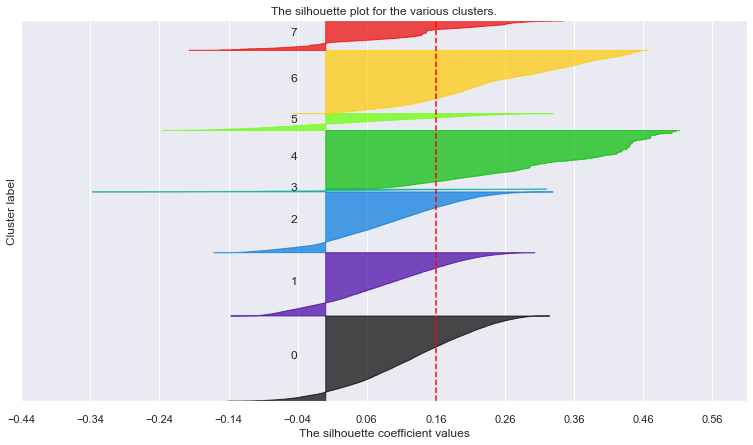

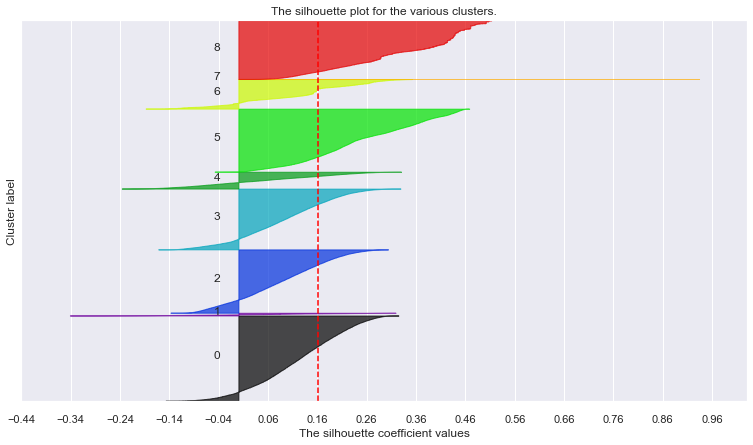

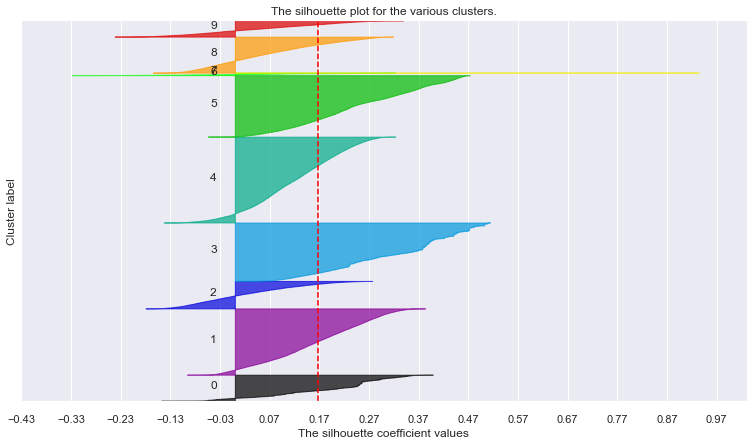

In [76]:
# Adapted from:
# https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html#sphx-glr-auto-examples-cluster-plot-kmeans-silhouette-analysis-py

# Storing average silhouette metric
avg_silhouette = []
for nclus in range_clusters:
    # Skip nclus == 1
    if nclus == 1:
        continue
    
    # Create a figure
    fig = plt.figure(figsize=(13, 7))

    # Initialize the KMeans object with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    kmclust = KMeans(n_clusters=nclus, init='k-means++', n_init=15, random_state=1)
    cluster_labels = kmclust.fit_predict(df_sum)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed clusters
    silhouette_avg = silhouette_score(df_sum, cluster_labels)
    avg_silhouette.append(silhouette_avg)
    print(f"For n_clusters = {nclus}, the average silhouette_score is : {silhouette_avg}")

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(df_sum, cluster_labels)

    y_lower = 10
    for i in range(nclus):
        # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()
        
        # Get y_upper to demarcate silhouette y range size
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        
        # Filling the silhouette
        color = cm.nipy_spectral(float(i) / nclus)
        plt.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    plt.title("The silhouette plot for the various clusters.")
    plt.xlabel("The silhouette coefficient values")
    plt.ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    plt.axvline(x=silhouette_avg, color="red", linestyle="--")
    
    # The silhouette coefficient can range from -1, 1
    xmin, xmax = np.round(sample_silhouette_values.min() -0.1, 2), np.round(sample_silhouette_values.max() + 0.1, 2)
    plt.xlim([xmin, xmax])
    
    # The (nclus+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    plt.ylim([0, len(df_sum) + (nclus + 1) * 10])

    plt.yticks([])  # Clear the yaxis labels / ticks
    plt.xticks(np.arange(xmin, xmax, 0.1))

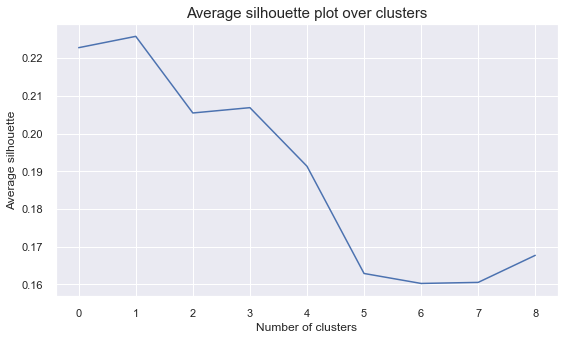

In [77]:
# The average silhouette plot
# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(avg_silhouette)
plt.ylabel("Average silhouette")
plt.xlabel("Number of clusters")
plt.title("Average silhouette plot over clusters", size=15)
plt.show()

#4 to 6

From the graphs above, the optimal number of clusters for the demographic segmentation is 5. However, we have negative silhouette samples and for this reason, the clustering approach can be improved.

In [32]:
# Performing kmeans and appending the cluster labels to a new dataframe that keeps the cluster labels
clust_labels, cent = clus_Kmeans(df_sum, 3)
kmeans_sum_df = df_sum.copy()
kmeans_sum_df["kmeans_sum_labels"] = clust_labels

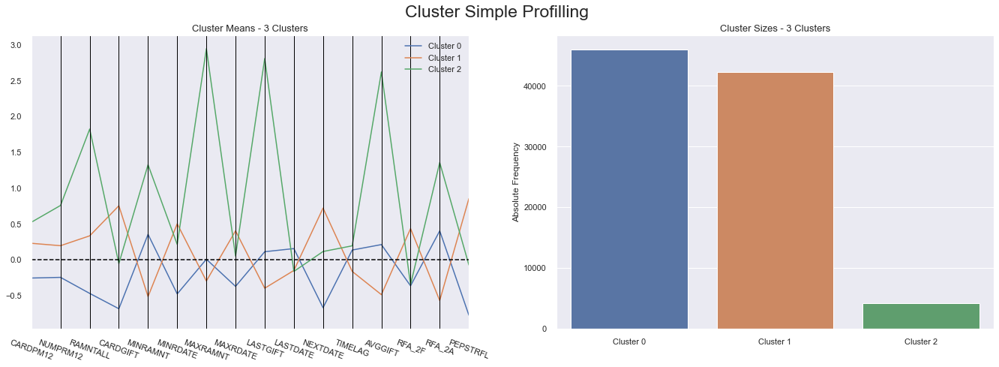

In [79]:
cluster_profiles(kmeans_sum_df, ["kmeans_sum_labels"], figsize=(23, 7))

In [35]:
# We are essentially decomposing the R² into the R² for each variable
r2_variables(kmeans_sum_df, ['kmeans_sum_labels']).drop('kmeans_sum_labels').sort_values()

TIMELAG     0.022993
LASTDATE    0.023442
CARDPM12    0.068911
NUMPRM12    0.073716
MAXRDATE    0.142929
RFA_2F      0.157628
MINRDATE    0.230139
MINRAMNT    0.262992
RAMNTALL    0.311749
RFA_2A      0.312431
MAXRAMNT    0.434313
LASTGIFT    0.436722
AVGGIFT     0.442585
NEXTDATE    0.460297
CARDGIFT    0.491698
PEPSTRFL    0.630556
dtype: float64

In [33]:
#R2 score

r2(kmeans_sum_df, ["kmeans_sum_labels"])

0.2963356850883794

With this cluster we were able to see the most important variables for summary segmentation. We will only keep the variables that have an R2 score above 0.30. In the chapter "Clustering with the most important features" we will proceed our exploration.

In [34]:
summ = r2_variables(kmeans_sum_df, ['kmeans_sum_labels']).drop('kmeans_sum_labels').sort_values().tail(8).index.to_list()

## Census segmentation

### PCA

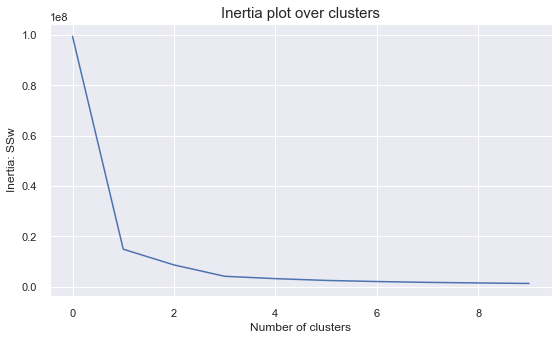

In [188]:
inertia = []
for n_clus in range_clusters:  # iterate over desired ncluster range
    kmclust = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
    kmclust.fit(df_pca_cen[pca_feat_names])
    inertia.append(kmclust.inertia_)  # save the inertia of the given cluster solution

# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(inertia)
plt.ylabel("Inertia: SSw")
plt.xlabel("Number of clusters")
plt.title("Inertia plot over clusters", size=15)
plt.show()

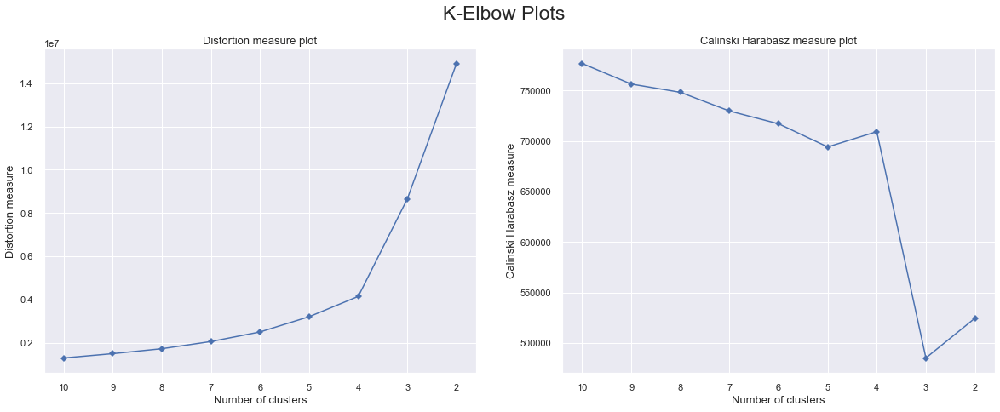

In [189]:
# Instantiate a scikit-learn K-Means model
clus_estim = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
# K-elbow plots
kelbowplots(clus_estim, df_pca_cen[pca_feat_names])

For n_clusters = 2, the average silhouette_score is : 0.7859355502648512
For n_clusters = 3, the average silhouette_score is : 0.6322754479492814
For n_clusters = 4, the average silhouette_score is : 0.6330704551869687
For n_clusters = 5, the average silhouette_score is : 0.641767003193882
For n_clusters = 6, the average silhouette_score is : 0.38144905441153804
For n_clusters = 7, the average silhouette_score is : 0.3889382433575379
For n_clusters = 8, the average silhouette_score is : 0.37968865996667145
For n_clusters = 9, the average silhouette_score is : 0.3266627404213214
For n_clusters = 10, the average silhouette_score is : 0.3339315379726648


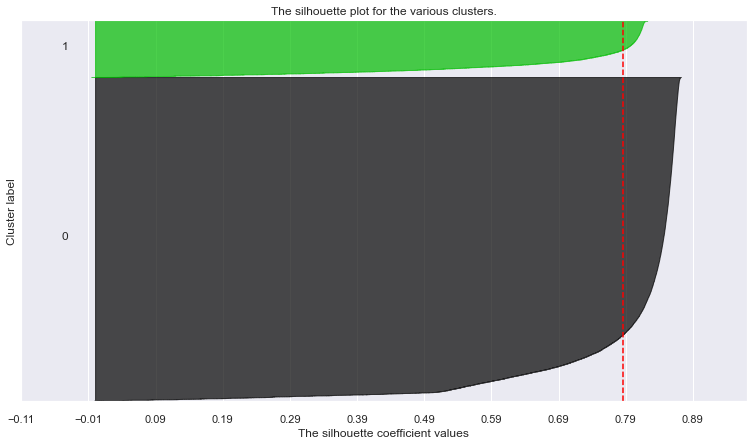

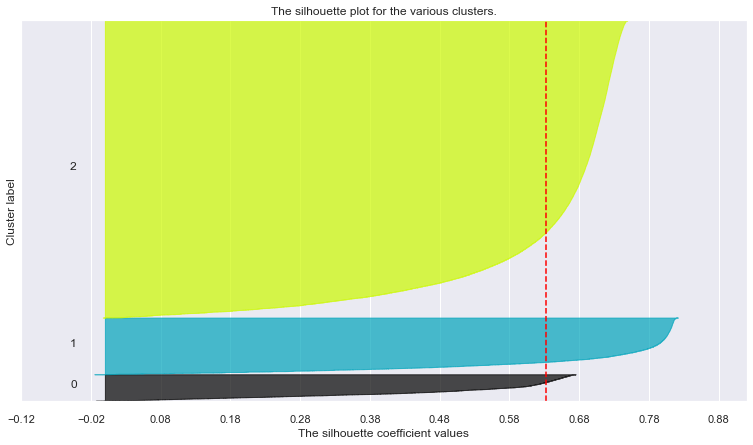

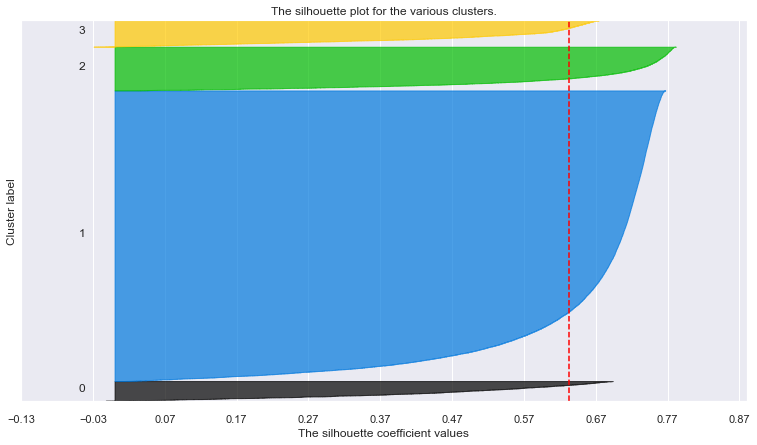

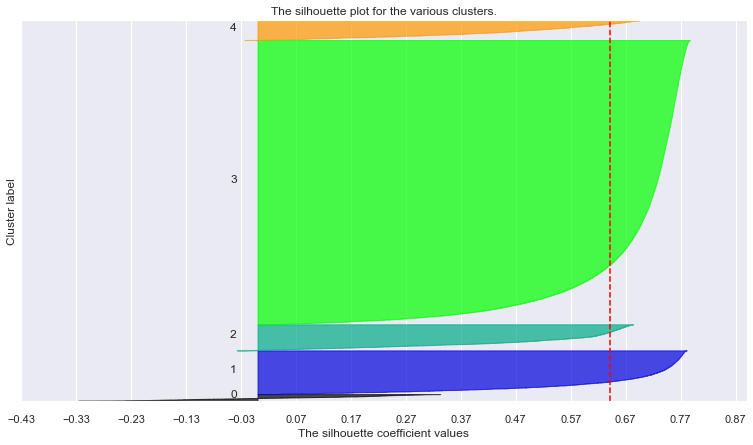

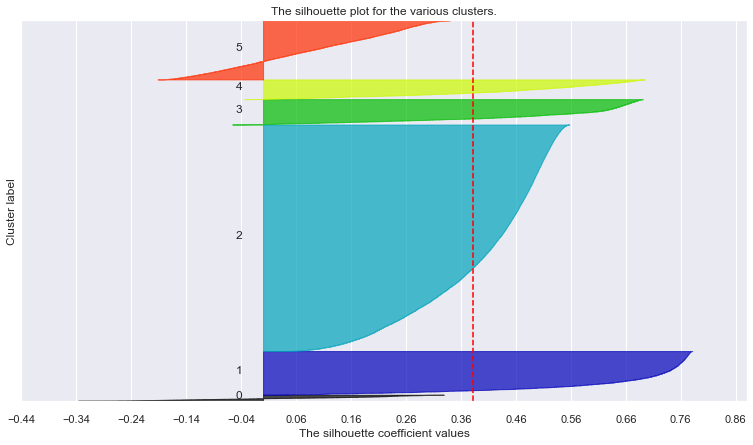

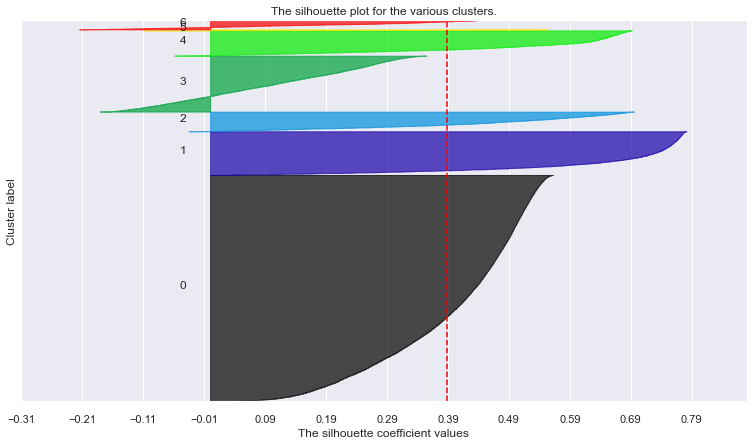

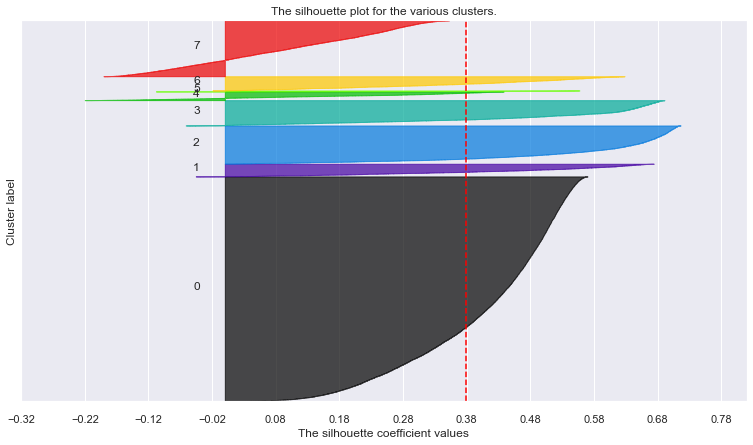

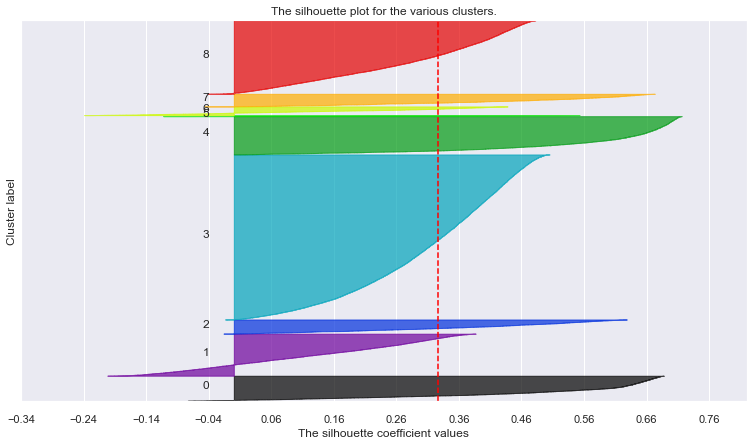

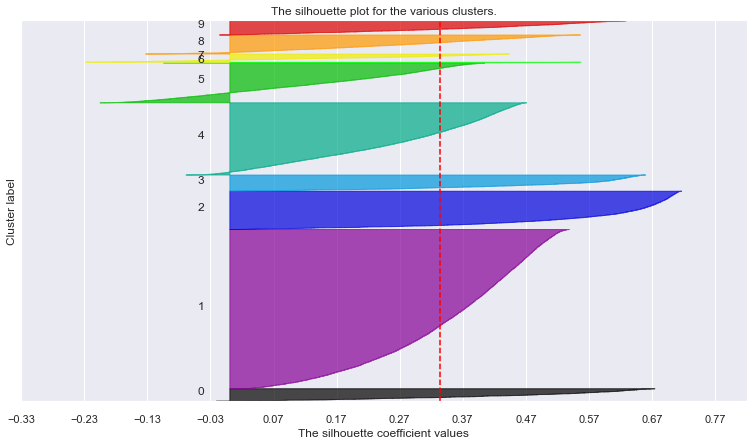

In [97]:
# Adapted from:
# https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html#sphx-glr-auto-examples-cluster-plot-kmeans-silhouette-analysis-py

# Storing average silhouette metric
avg_silhouette = []
for nclus in range_clusters:
    # Skip nclus == 1
    if nclus == 1:
        continue
    
    # Create a figure
    fig = plt.figure(figsize=(13, 7))

    # Initialize the KMeans object with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    kmclust = KMeans(n_clusters=nclus, init='k-means++', n_init=15, random_state=1)
    cluster_labels = kmclust.fit_predict(df_pca_cen[pca_feat_names])

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed clusters
    silhouette_avg = silhouette_score(df_pca_cen[pca_feat_names], cluster_labels)
    avg_silhouette.append(silhouette_avg)
    print(f"For n_clusters = {nclus}, the average silhouette_score is : {silhouette_avg}")

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(df_pca_cen[pca_feat_names], cluster_labels)

    y_lower = 10
    for i in range(nclus):
        # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()
        
        # Get y_upper to demarcate silhouette y range size
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        
        # Filling the silhouette
        color = cm.nipy_spectral(float(i) / nclus)
        plt.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    plt.title("The silhouette plot for the various clusters.")
    plt.xlabel("The silhouette coefficient values")
    plt.ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    plt.axvline(x=silhouette_avg, color="red", linestyle="--")
    
    # The silhouette coefficient can range from -1, 1
    xmin, xmax = np.round(sample_silhouette_values.min() -0.1, 2), np.round(sample_silhouette_values.max() + 0.1, 2)
    plt.xlim([xmin, xmax])
    
    # The (nclus+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    plt.ylim([0, len(df_pca_cen[pca_feat_names]) + (nclus + 1) * 10])

    plt.yticks([])  # Clear the yaxis labels / ticks
    plt.xticks(np.arange(xmin, xmax, 0.1))

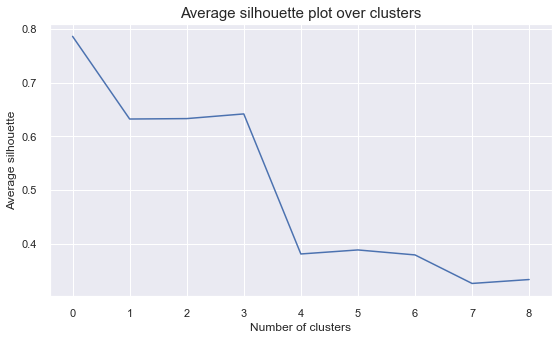

In [98]:
# The average silhouette plot
# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(avg_silhouette)
plt.ylabel("Average silhouette")
plt.xlabel("Number of clusters")
plt.title("Average silhouette plot over clusters", size=15)
plt.show()

In [190]:
# Performing kmeans and appending the cluster labels to a new dataframe that keeps the cluster labels
clust_labels, cent = clus_Kmeans(df_pca_cen[pca_feat_names], 4)
kmeans_cen_df = df_pca_cen[pca_feat_names].copy()
kmeans_cen_df["kmeans_cen_labels"] = clust_labels

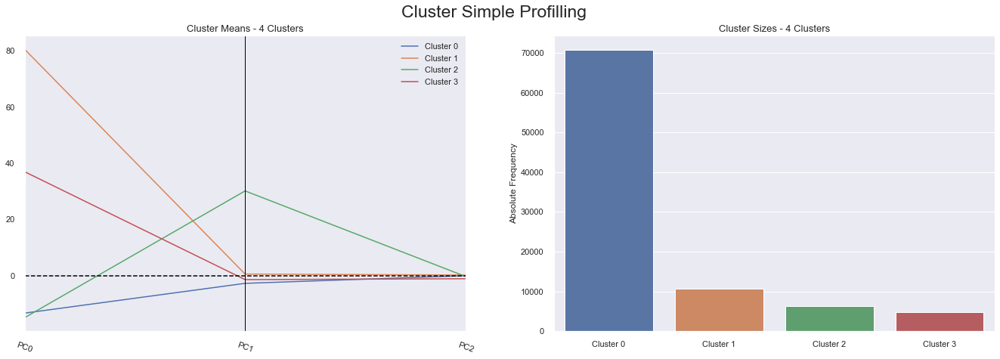

In [191]:
cluster_profiles(kmeans_cen_df, ["kmeans_cen_labels"], figsize=(23, 7))

In [ ]:
#only PC0 AND PC1 worth keepin

In [192]:
# We are essentially decomposing the R² into the R² for each variable
r2_variables(kmeans_cen_df, ['kmeans_cen_labels']).drop('kmeans_cen_labels').sort_values()

PC2    0.006333
PC1    0.825495
PC0    0.979967
dtype: float64

### Census variables

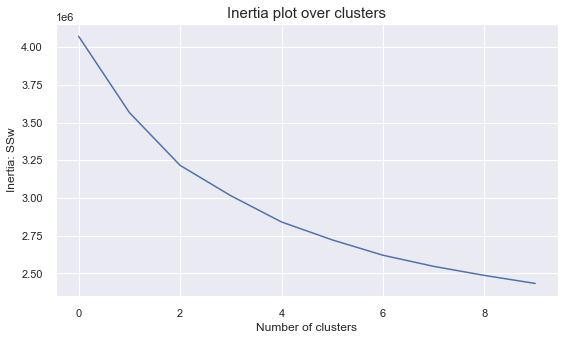

In [86]:
inertia = []
for n_clus in range_clusters:  # iterate over desired ncluster range
    kmclust = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
    kmclust.fit(df_cen)
    inertia.append(kmclust.inertia_)  # save the inertia of the given cluster solution

# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(inertia)
plt.ylabel("Inertia: SSw")
plt.xlabel("Number of clusters")
plt.title("Inertia plot over clusters", size=15)
plt.show()

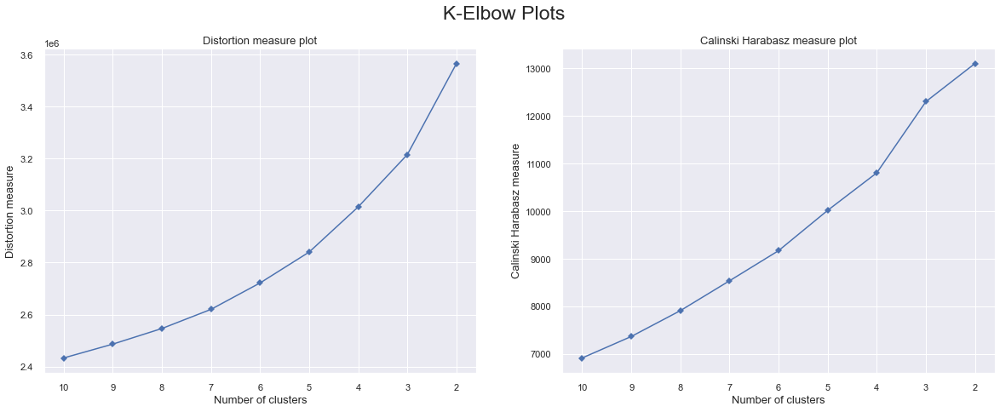

In [87]:
# Instantiate a scikit-learn K-Means model
clus_estim = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
# K-elbow plots
kelbowplots(clus_estim, df_cen)

For n_clusters = 2, the average silhouette_score is : 0.12682448234419702
For n_clusters = 3, the average silhouette_score is : 0.12261529970712944
For n_clusters = 4, the average silhouette_score is : 0.11829450575505869
For n_clusters = 5, the average silhouette_score is : 0.12132511702328254
For n_clusters = 6, the average silhouette_score is : 0.11470870618169282
For n_clusters = 7, the average silhouette_score is : 0.11718585945087988
For n_clusters = 8, the average silhouette_score is : 0.11572675055790263
For n_clusters = 9, the average silhouette_score is : 0.10107169213722722
For n_clusters = 10, the average silhouette_score is : 0.092924035287782


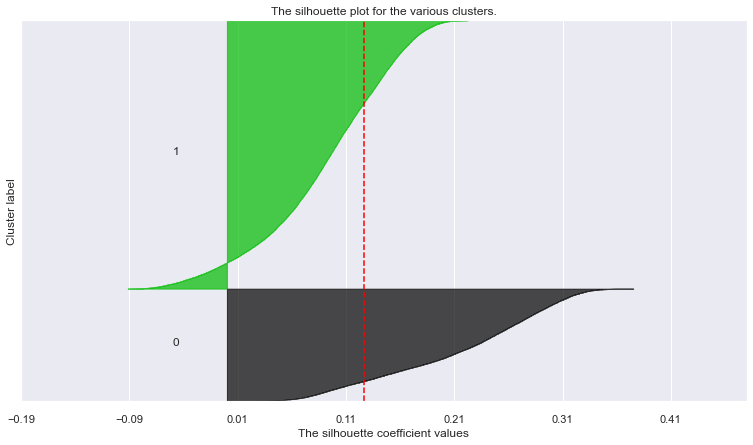

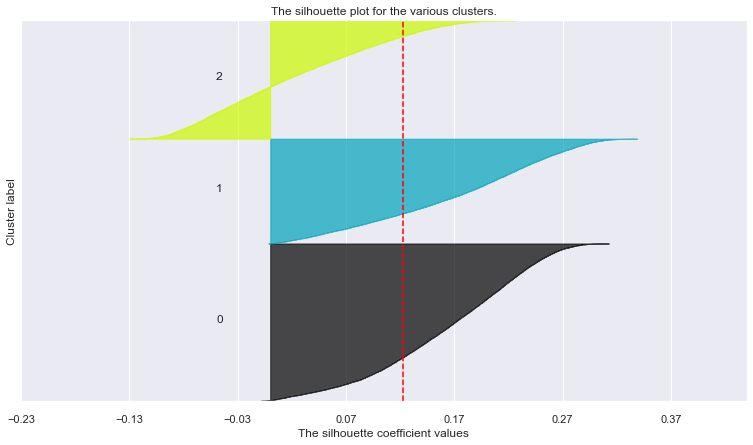

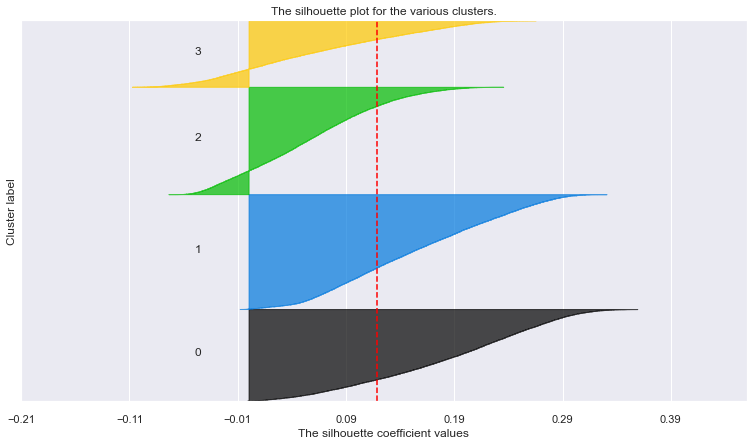

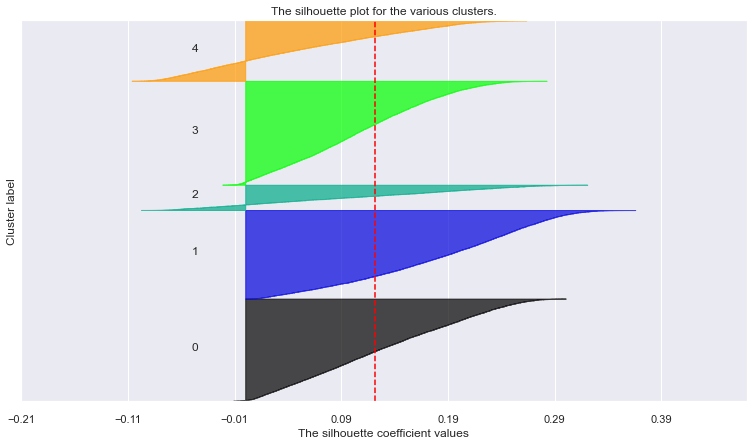

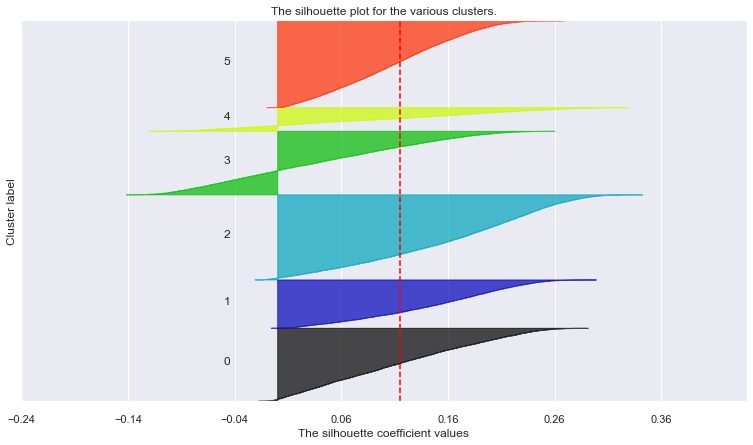

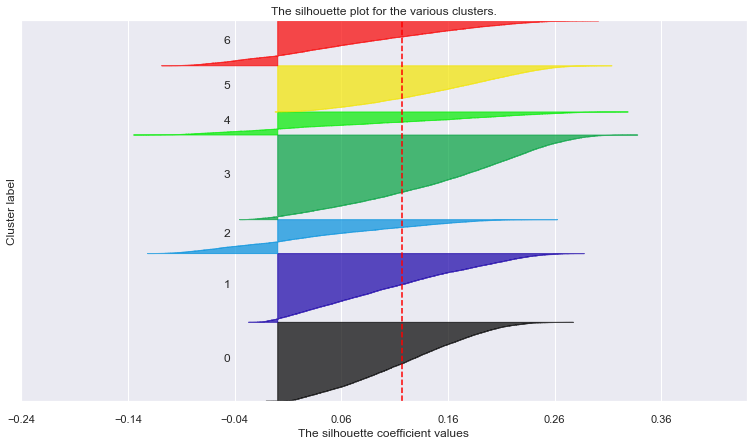

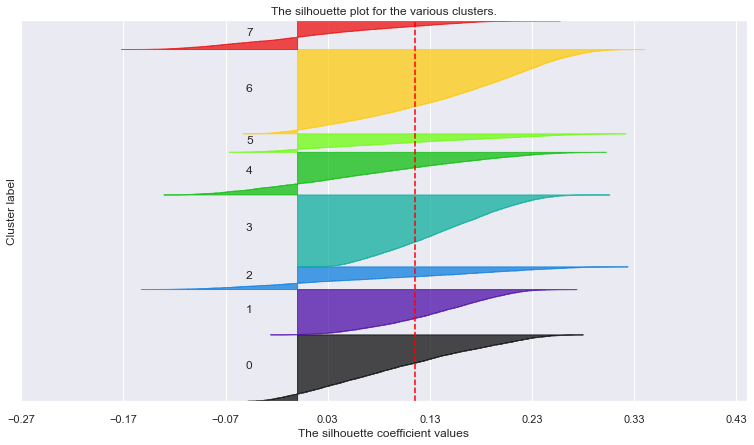

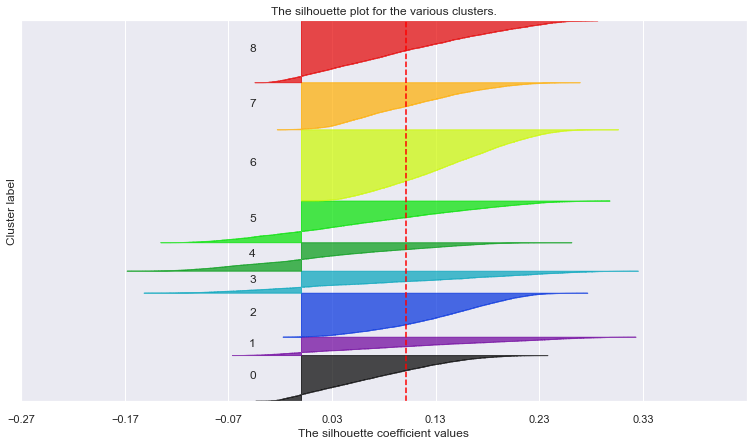

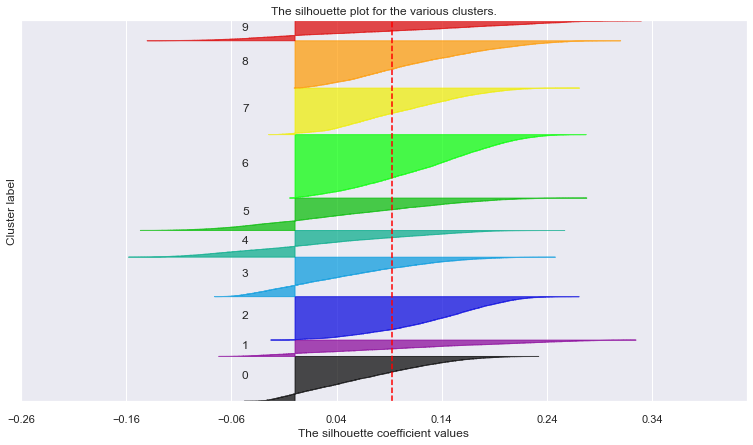

In [88]:
# Adapted from:
# https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html#sphx-glr-auto-examples-cluster-plot-kmeans-silhouette-analysis-py

# Storing average silhouette metric
avg_silhouette = []
for nclus in range_clusters:
    # Skip nclus == 1
    if nclus == 1:
        continue
    
    # Create a figure
    fig = plt.figure(figsize=(13, 7))

    # Initialize the KMeans object with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    kmclust = KMeans(n_clusters=nclus, init='k-means++', n_init=15, random_state=1)
    cluster_labels = kmclust.fit_predict(df_cen)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed clusters
    silhouette_avg = silhouette_score(df_cen, cluster_labels)
    avg_silhouette.append(silhouette_avg)
    print(f"For n_clusters = {nclus}, the average silhouette_score is : {silhouette_avg}")

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(df_cen, cluster_labels)

    y_lower = 10
    for i in range(nclus):
        # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()
        
        # Get y_upper to demarcate silhouette y range size
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        
        # Filling the silhouette
        color = cm.nipy_spectral(float(i) / nclus)
        plt.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    plt.title("The silhouette plot for the various clusters.")
    plt.xlabel("The silhouette coefficient values")
    plt.ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    plt.axvline(x=silhouette_avg, color="red", linestyle="--")
    
    # The silhouette coefficient can range from -1, 1
    xmin, xmax = np.round(sample_silhouette_values.min() -0.1, 2), np.round(sample_silhouette_values.max() + 0.1, 2)
    plt.xlim([xmin, xmax])
    
    # The (nclus+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    plt.ylim([0, len(df_cen) + (nclus + 1) * 10])

    plt.yticks([])  # Clear the yaxis labels / ticks
    plt.xticks(np.arange(xmin, xmax, 0.1))

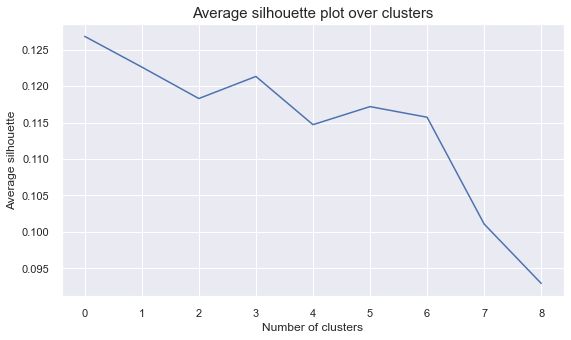

In [89]:
# The average silhouette plot
# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(avg_silhouette)
plt.ylabel("Average silhouette")
plt.xlabel("Number of clusters")
plt.title("Average silhouette plot over clusters", size=15)
plt.show()

#3-5

In [36]:
# Performing kmeans and appending the cluster labels to a new dataframe that keeps the cluster labels
clust_labels, cent = clus_Kmeans(df_cen,4)
kmeans_cen_df = df_cen.copy()
kmeans_cen_df["kmeans_cen_labels"] = clust_labels

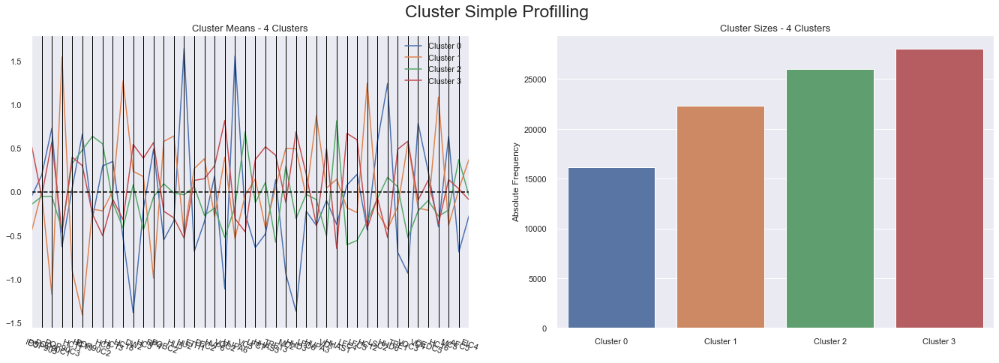

In [37]:
cluster_profiles(kmeans_cen_df, ["kmeans_cen_labels"], figsize=(23, 7))

In [38]:
#R2 score

r2(kmeans_cen_df, ["kmeans_cen_labels"])

0.2785393968819888

In [125]:
# We are essentially decomposing the R² into the R² for each variable
r2_variables(kmeans_cen_df, ['kmeans_cen_labels']).drop('kmeans_cen_labels').sort_values()

POP903     0.007852
LFC6       0.021967
HC13       0.027850
OEDC5      0.028166
EIC4       0.049720
HVP6       0.061441
LSC2       0.072181
PEC2       0.082041
ETH1       0.104016
HC5        0.112299
AFC5       0.121804
LFC7       0.121972
MC3        0.123973
VC4        0.132008
IC5        0.143783
HU5        0.144952
VC1        0.148242
POBC2      0.150237
TPE13      0.151049
POP90C2    0.158540
TPE1       0.163637
HHAS3      0.165692
HC8        0.187859
VC3        0.207049
LFC5       0.215341
MC2        0.243884
LFC4       0.247666
HUPA3      0.254426
HC11       0.271825
HHAS1      0.343150
HC16       0.373623
RP4        0.374607
HHD6       0.403408
VOC3       0.408119
DW2        0.438062
HC12       0.490813
HC18       0.515122
POP90C1    0.522115
HUPA6      0.527856
VOC2       0.531696
HHD3       0.553720
HU2        0.610829
HC19       0.644424
POP90C3    0.759839
dtype: float64

With this cluster we were able to see the most important variables for census segmentation. We will only keep the variables that have an R2 score above 0.50. In the chapter "Clustering with the most important features" we will proceed our exploration.

In [39]:
census = r2_variables(kmeans_cen_df, ['kmeans_cen_labels']).drop('kmeans_cen_labels').sort_values().tail(8).index.to_list()

In [40]:
census

['HC18', 'POP90C1', 'HUPA6', 'VOC2', 'HHD3', 'HU2', 'HC19', 'POP90C3']

## Interests segmentation

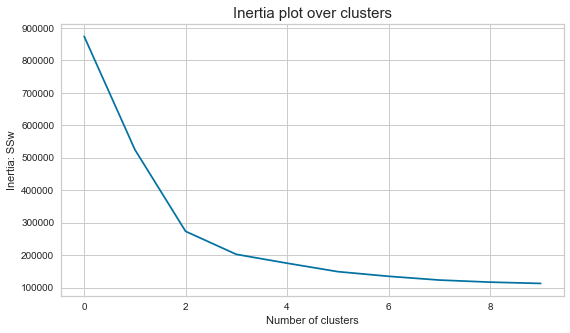

In [38]:
inertia = []
for n_clus in range_clusters:  # iterate over desired ncluster range
    kmclust = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
    kmclust.fit(df_int)
    inertia.append(kmclust.inertia_)  # save the inertia of the given cluster solution

# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(inertia)
plt.ylabel("Inertia: SSw")
plt.xlabel("Number of clusters")
plt.title("Inertia plot over clusters", size=15)
plt.show()

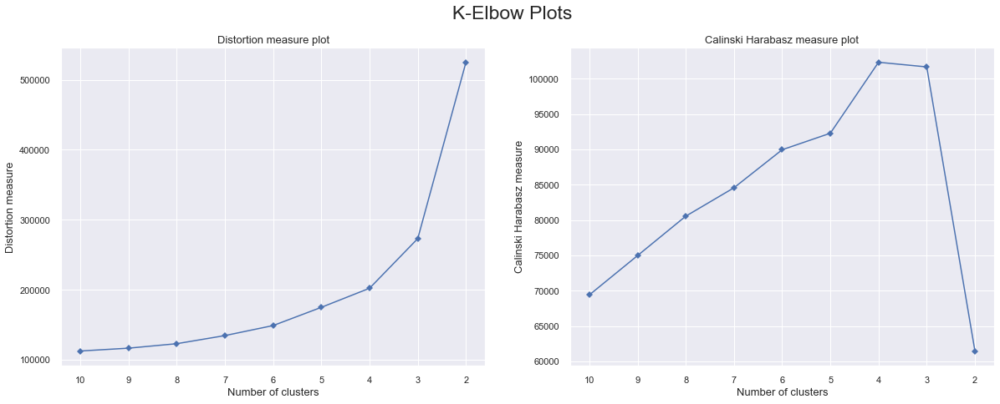

In [39]:
# Instantiate a scikit-learn K-Means model
clus_estim = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
# K-elbow plots
kelbowplots(clus_estim, df_int)

For n_clusters = 2, the average silhouette_score is : 0.696170570864834
For n_clusters = 3, the average silhouette_score is : 0.6775166963453366
For n_clusters = 4, the average silhouette_score is : 0.5439811828871688
For n_clusters = 5, the average silhouette_score is : 0.4479664985294064
For n_clusters = 6, the average silhouette_score is : 0.44885780736822356
For n_clusters = 7, the average silhouette_score is : 0.4141460282748346
For n_clusters = 8, the average silhouette_score is : 0.41922673369818003
For n_clusters = 9, the average silhouette_score is : 0.41764341447146686
For n_clusters = 10, the average silhouette_score is : 0.42752740980075465


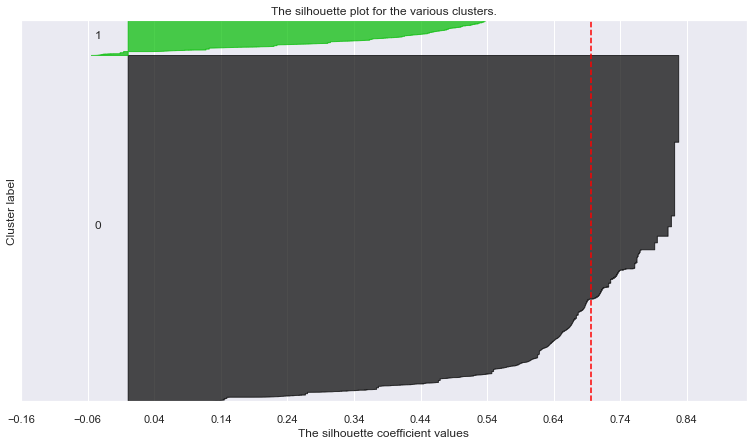

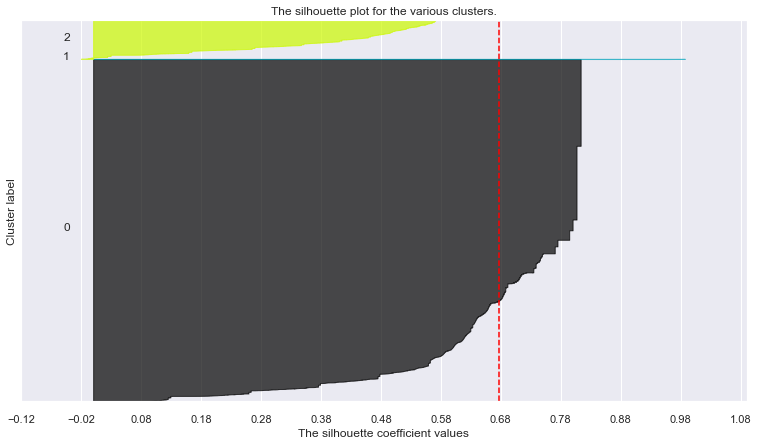

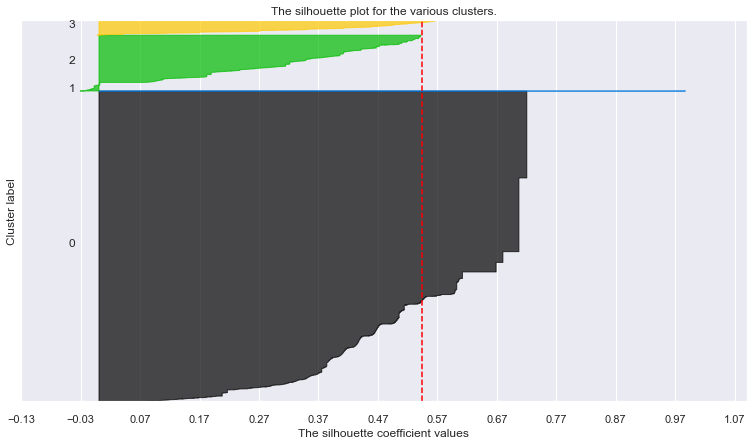

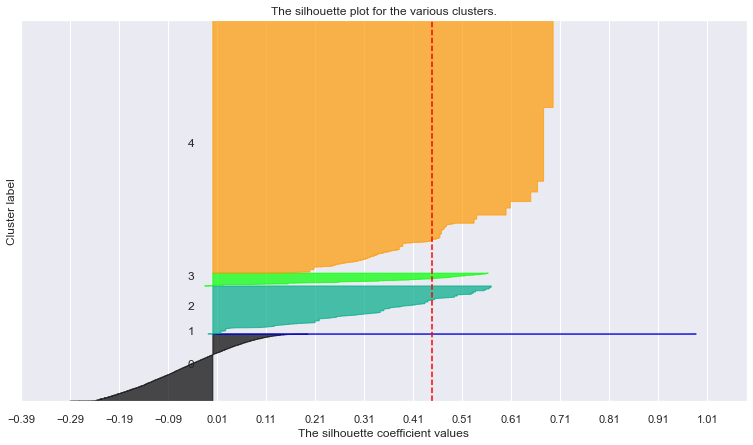

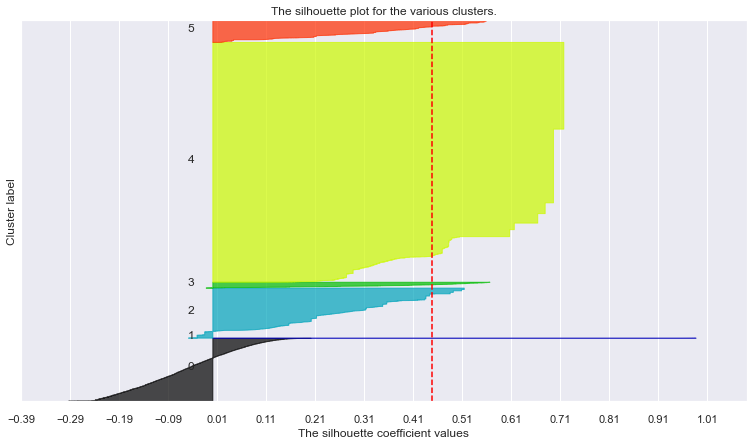

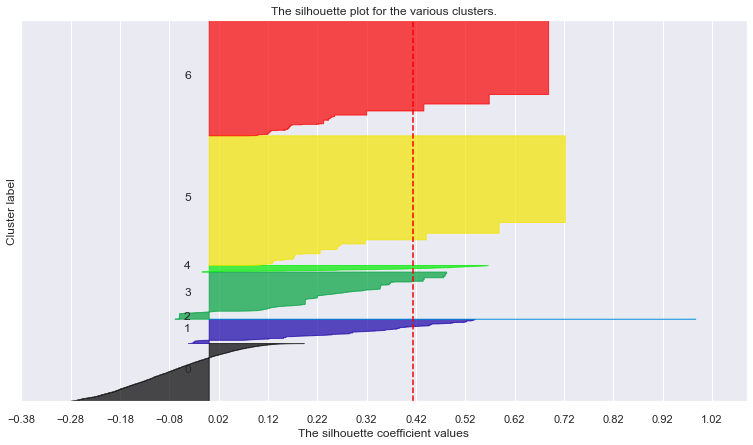

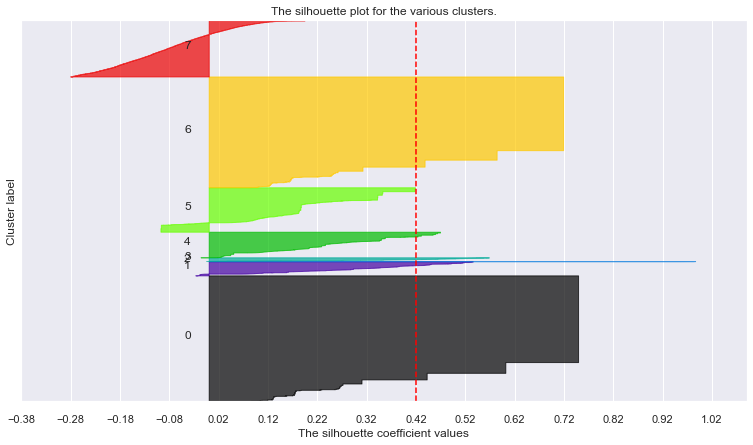

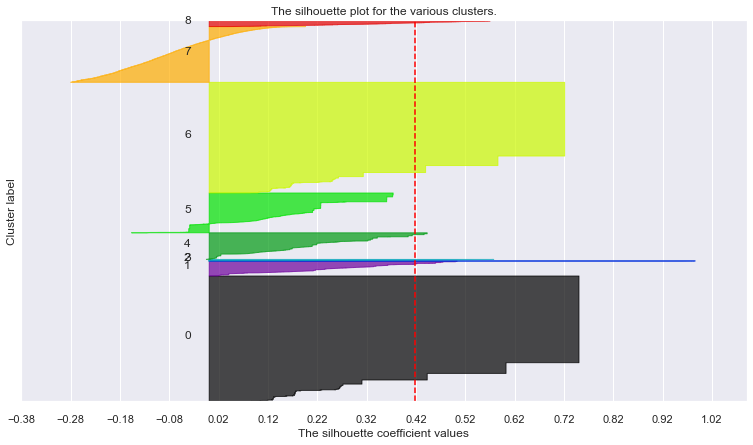

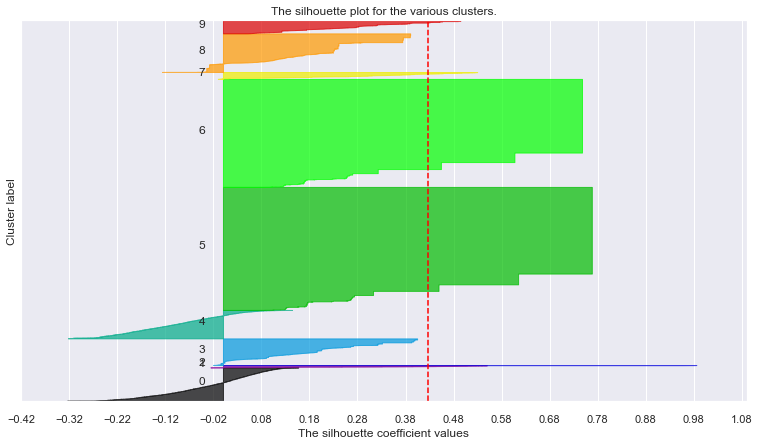

In [40]:
# Adapted from:
# https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html#sphx-glr-auto-examples-cluster-plot-kmeans-silhouette-analysis-py

# Storing average silhouette metric
avg_silhouette = []
for nclus in range_clusters:
    # Skip nclus == 1
    if nclus == 1:
        continue
    
    # Create a figure
    fig = plt.figure(figsize=(13, 7))

    # Initialize the KMeans object with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    kmclust = KMeans(n_clusters=nclus, init='k-means++', n_init=15, random_state=1)
    cluster_labels = kmclust.fit_predict(df_int)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed clusters
    silhouette_avg = silhouette_score(df_int, cluster_labels)
    avg_silhouette.append(silhouette_avg)
    print(f"For n_clusters = {nclus}, the average silhouette_score is : {silhouette_avg}")

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(df_int, cluster_labels)

    y_lower = 10
    for i in range(nclus):
        # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()
        
        # Get y_upper to demarcate silhouette y range size
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        
        # Filling the silhouette
        color = cm.nipy_spectral(float(i) / nclus)
        plt.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    plt.title("The silhouette plot for the various clusters.")
    plt.xlabel("The silhouette coefficient values")
    plt.ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    plt.axvline(x=silhouette_avg, color="red", linestyle="--")
    
    # The silhouette coefficient can range from -1, 1
    xmin, xmax = np.round(sample_silhouette_values.min() -0.1, 2), np.round(sample_silhouette_values.max() + 0.1, 2)
    plt.xlim([xmin, xmax])
    
    # The (nclus+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    plt.ylim([0, len(df_int) + (nclus + 1) * 10])

    plt.yticks([])  # Clear the yaxis labels / ticks
    plt.xticks(np.arange(xmin, xmax, 0.1))

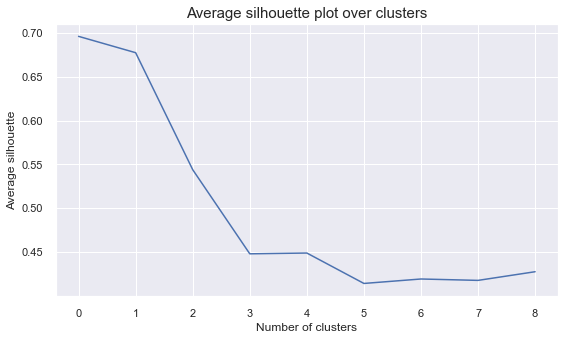

In [41]:
# The average silhouette plot
# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(avg_silhouette)
plt.ylabel("Average silhouette")
plt.xlabel("Number of clusters")
plt.title("Average silhouette plot over clusters", size=15)
plt.show()

In [41]:
# Performing kmeans and appending the cluster labels to a new dataframe that keeps the cluster labels
clust_labels, cent = clus_Kmeans(df_sum, 4)
kmeans_int_df = df_int.copy()
kmeans_int_df["kmeans_int_labels"] = clust_labels

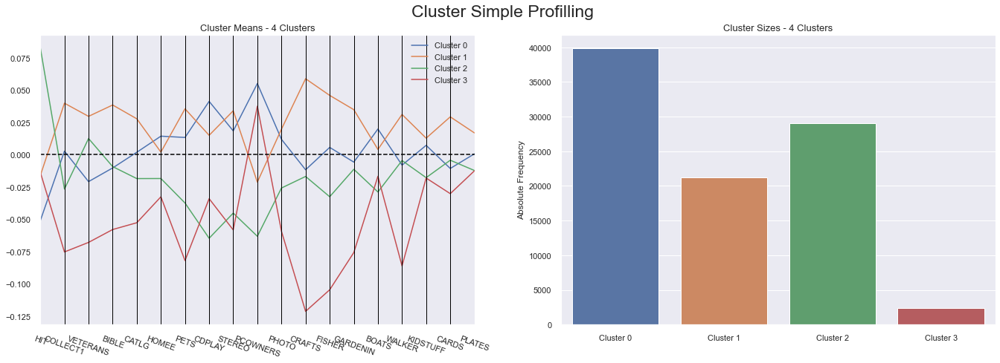

In [132]:
cluster_profiles(kmeans_int_df, ["kmeans_int_labels"], figsize=(23, 7))

In [133]:
# We are essentially decomposing the R² into the R² for each variable
r2_variables(kmeans_int_df, ['kmeans_int_labels']).drop('kmeans_int_labels').sort_values()

PLATES      0.000117
KIDSTUFF    0.000168
HOMEE       0.000224
CARDS       0.000275
CATLG       0.000359
BOATS       0.000443
WALKER      0.000451
PHOTO       0.000452
GARDENIN    0.000483
BIBLE       0.000499
VETERANS    0.000559
COLLECT1    0.000738
PETS        0.000981
FISHER      0.001115
STEREO      0.001142
CRAFTS      0.001325
CDPLAY      0.002132
PCOWNERS    0.002701
HIT         0.003340
dtype: float64

In [134]:
r2(kmeans_int_df, ['kmeans_int_labels'])

0.043474368564226484

Since all the variables have a low R2 we won't be keeping any of them. In other words, we won't be using the interests segmentation.

# Clustering with the most important variables

In [42]:
df_dem

,AGE,NUMCHLD,HOMEOWNR,GENDER,INCOME
CONTROLN,,,,,
95515,0.063676,-0.360928,-1.116803,-0.863304,-0.479693
148535,-0.961093,1.300858,0.895413,0.817879,1.320075
15078,0.131994,-0.360928,-1.116803,0.817879,-0.479693
172556,0.678537,-0.360928,-1.116803,-0.863304,-1.679539
7112,1.225080,1.300858,0.895413,-0.863304,-0.479693
...,...,...,...,...,...
184568,0.131994,-0.360928,-1.116803,0.817879,-0.479693
122706,-0.824457,1.300858,0.895413,0.817879,1.919998
189641,-0.004642,-0.360928,-1.116803,0.817879,-0.479693


In [63]:
#will only keep the most interesting variables for our analysis
census = ['POP90C1', 'HU2','HHD3','POP90C3']
df_cen2 = df_cen[census] 
df_cen2

,POP90C1,HU2,HHD3,POP90C3
CONTROLN,,,,
95515,-1.247266,-0.752620,0.697272,0.959688
148535,0.844518,-1.236379,1.873973,-0.657877
15078,-1.247266,-0.365614,0.370411,1.780913
172556,-1.247266,1.085661,0.108922,1.631599
7112,0.844518,-0.946124,-0.675545,-0.657877
...,...,...,...,...
184568,0.844518,0.698654,-0.217939,-0.657877
122706,0.781131,-0.849372,1.677856,-0.558335
189641,0.844518,0.214896,-1.067779,-0.657877


In [43]:
df_sum2= df_sum[summ]
df_sum2

,RAMNTALL,RFA_2A,MAXRAMNT,LASTGIFT,AVGGIFT,NEXTDATE,CARDGIFT,PEPSTRFL
CONTROLN,,,,,,,,
95515,1.318587,-0.972255,-0.551818,-0.611523,-0.661429,0.713749,1.987839,1.054529
148535,-0.533500,1.406257,0.388291,0.676629,0.301708,-0.982297,-0.896215,-0.948291
15078,0.953928,-0.972255,-0.262553,-1.040908,-0.693083,0.434272,1.987839,1.054529
172556,0.061471,-0.972255,-0.624134,-0.611523,-0.774388,1.490990,0.434887,1.054529
7112,1.452936,0.217001,-0.334870,-0.182139,-0.768024,3.993503,0.656737,-0.948291
...,...,...,...,...,...,...,...,...
184568,-0.744618,1.406257,0.388291,0.676629,1.436040,-1.259948,-1.118066,-0.948291
122706,-0.792600,0.217001,0.026711,0.247245,0.828362,-1.171355,-1.118066,-0.948291
189641,-0.427940,-0.972255,-0.696450,-0.611523,-0.595340,-0.900098,-0.230664,1.054529


# K-means

## Demographic variables

In [147]:
# Performing kmeans and appending the cluster labels to a new dataframe that keeps the cluster labels
clust_labels, cent = clus_Kmeans(df_dem, 5)
kmeans_dem2_df = df_dem.copy()
kmeans_dem2_df["kmeans_dem2_labels"] = clust_labels

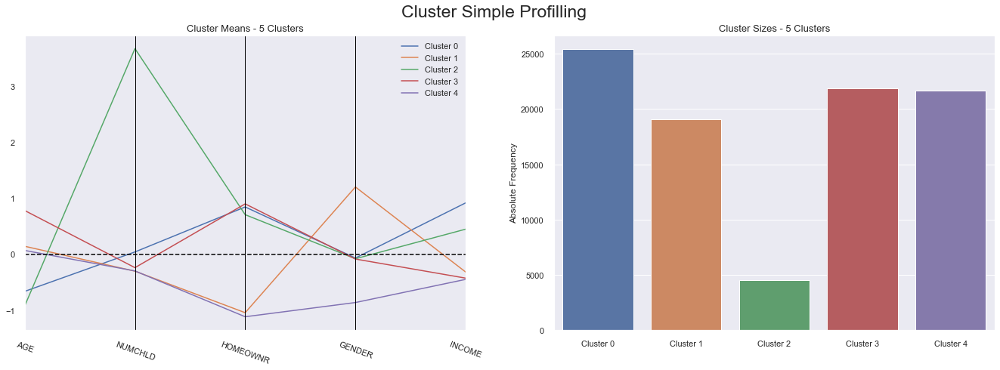

In [148]:
cluster_profiles(kmeans_dem2_df, ["kmeans_dem2_labels"], figsize=(23, 7))

Cluster 0 -> young group of people, highest number of children, homeowner, mixed group of female and male people and highest bound of income 

Cluster 1 -> middle group in terms of age, no kids, not a homeowner, male, slightly above the lower boundary of income

Cluster 2 -> youngest group, with a big number of children, is a homeowner, mixed group of female and male people and has the second highest income.

Cluster 3 -> oldest group, a few number of kids, is a homeowner, mixed group of female and male people and the lower bound of income

Cluster 4 -> middle group in terms of age, no kids, not a homeowner, female and the lower bound of income


In [149]:
#R2 score

r2(kmeans_dem2_df, ["kmeans_dem2_labels"])

0.7017114523712487

In [150]:
# We are essentially decomposing the R² into the R² for each variable
r2_variables(kmeans_dem2_df, ['kmeans_dem2_labels']).drop('kmeans_dem2_labels').sort_values()

AGE         0.310509
INCOME      0.350693
GENDER      0.473157
NUMCHLD     0.711448
HOMEOWNR    0.924388
dtype: float64

## Census variables

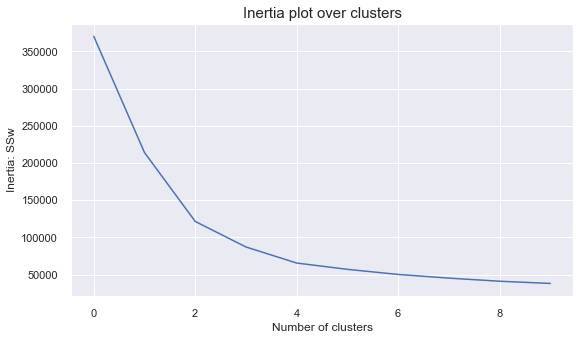

In [64]:
inertia = []
for n_clus in range_clusters:  # iterate over desired ncluster range
    kmclust = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
    kmclust.fit(df_cen2)
    inertia.append(kmclust.inertia_)  # save the inertia of the given cluster solution

# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(inertia)
plt.ylabel("Inertia: SSw")
plt.xlabel("Number of clusters")
plt.title("Inertia plot over clusters", size=15)
plt.show()

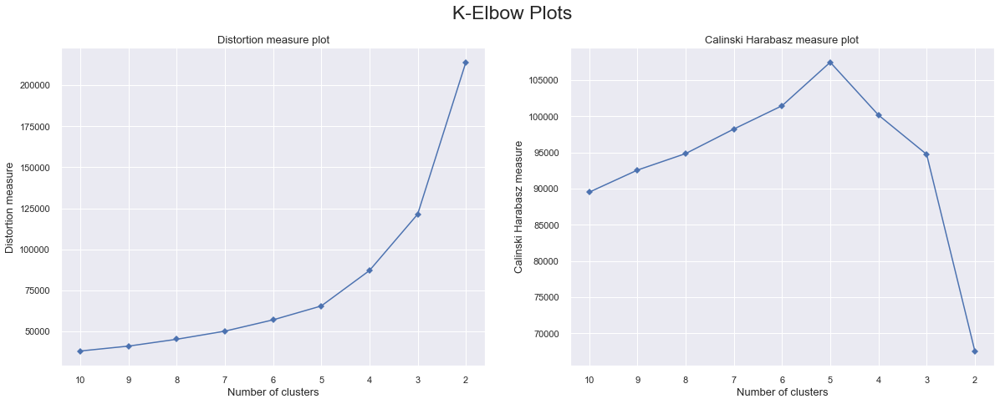

In [65]:
# Instantiate a scikit-learn K-Means model
clus_estim = KMeans(n_clusters=10, init='k-means++', n_init=15, random_state=1)
# K-elbow plots
kelbowplots(clus_estim, df_cen2)

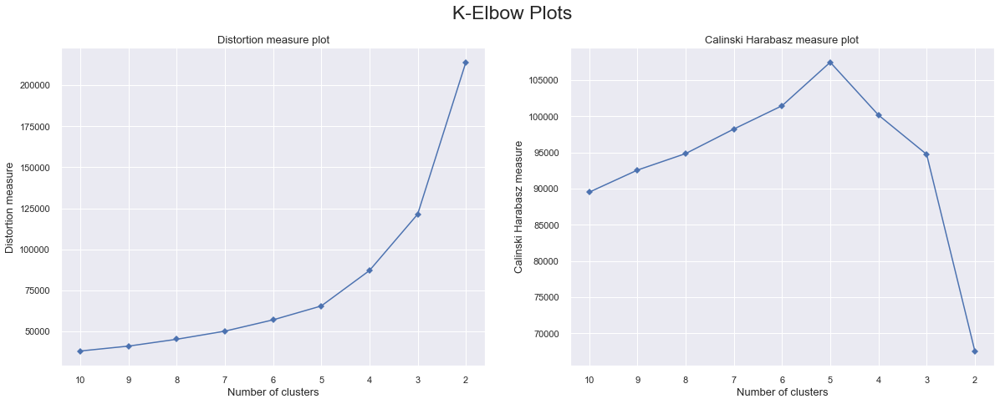

In [382]:
# Instantiate a scikit-learn K-Means model
clus_estim = KMeans(n_clusters=10, init='k-means++', n_init=15, random_state=1)
# K-elbow plots
kelbowplots(clus_estim, df_cen2)

For n_clusters = 2, the average silhouette_score is : 0.44681909752467314
For n_clusters = 3, the average silhouette_score is : 0.47653923884768723
For n_clusters = 4, the average silhouette_score is : 0.5045345810703783
For n_clusters = 5, the average silhouette_score is : 0.4791507687327872


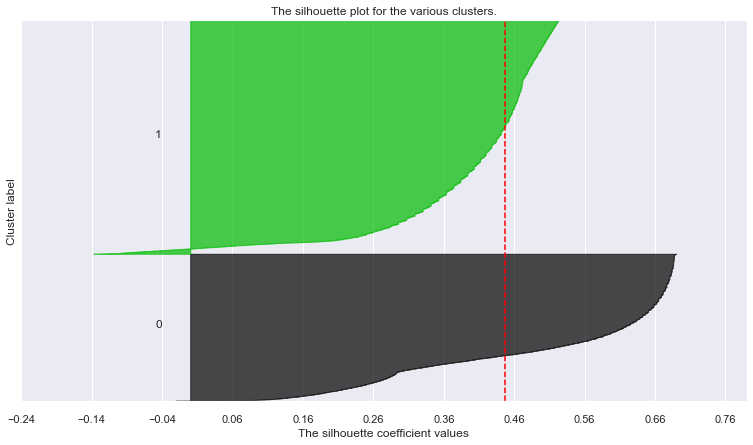

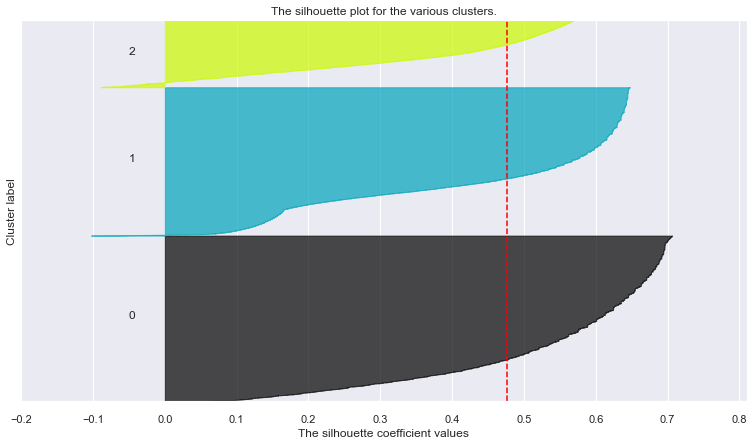

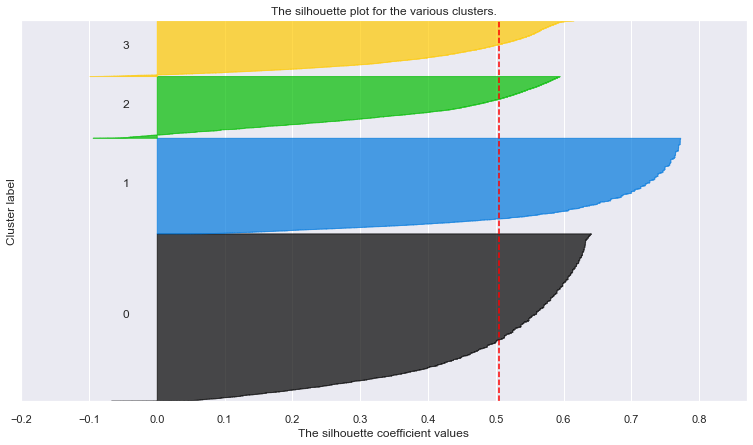

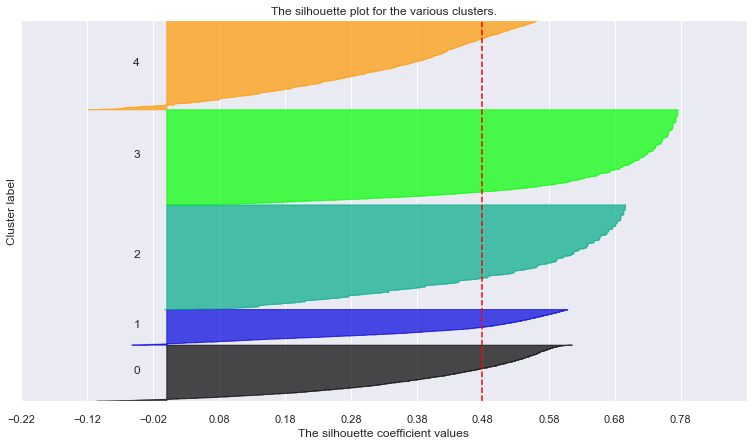

In [55]:
# Adapted from:
# https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html#sphx-glr-auto-examples-cluster-plot-kmeans-silhouette-analysis-py

# Storing average silhouette metric
avg_silhouette = []
for nclus in range(1,6):
    # Skip nclus == 1
    if nclus == 1:
        continue
    
    # Create a figure
    fig = plt.figure(figsize=(13, 7))

    # Initialize the KMeans object with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    kmclust = KMeans(n_clusters=nclus, init='k-means++', n_init=15, random_state=1)
    cluster_labels = kmclust.fit_predict(df_cen2)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed clusters
    silhouette_avg = silhouette_score(df_cen2, cluster_labels)
    avg_silhouette.append(silhouette_avg)
    print(f"For n_clusters = {nclus}, the average silhouette_score is : {silhouette_avg}")

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(df_cen2, cluster_labels)

    y_lower = 10
    for i in range(nclus):
        # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()
        
        # Get y_upper to demarcate silhouette y range size
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        
        # Filling the silhouette
        color = cm.nipy_spectral(float(i) / nclus)
        plt.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    plt.title("The silhouette plot for the various clusters.")
    plt.xlabel("The silhouette coefficient values")
    plt.ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    plt.axvline(x=silhouette_avg, color="red", linestyle="--")
    
    # The silhouette coefficient can range from -1, 1
    xmin, xmax = np.round(sample_silhouette_values.min() -0.1, 2), np.round(sample_silhouette_values.max() + 0.1, 2)
    plt.xlim([xmin, xmax])
    
    # The (nclus+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    plt.ylim([0, len(df_cen2) + (nclus + 1) * 10])

    plt.yticks([])  # Clear the yaxis labels / ticks
    plt.xticks(np.arange(xmin, xmax, 0.1))
    
#

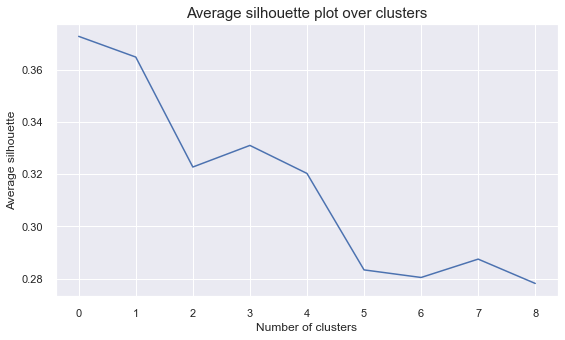

In [155]:
# The average silhouette plot
# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(avg_silhouette)
plt.ylabel("Average silhouette")
plt.xlabel("Number of clusters")
plt.title("Average silhouette plot over clusters", size=15)
plt.show()

In [66]:
# Performing kmeans and appending the cluster labels to a new dataframe that keeps the cluster labels
clust_labels, cent = clus_Kmeans(df_cen2, 4)
kmeans_cen2_df = df_cen2.copy()
kmeans_cen2_df["kmeans_cen2_labels"] = clust_labels

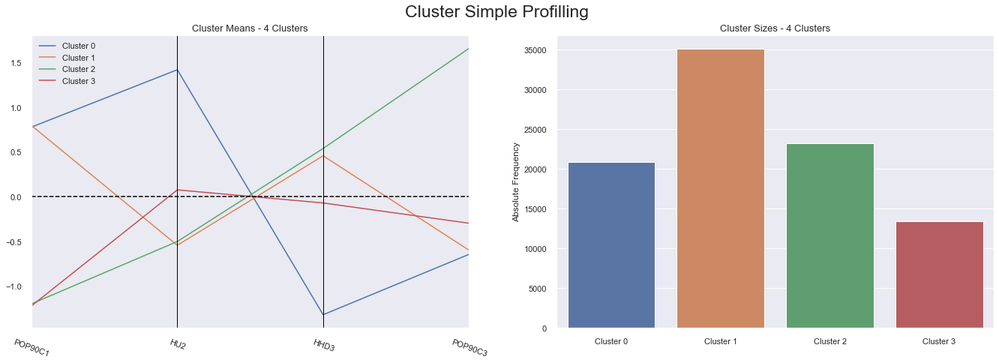

In [67]:
cluster_profiles(kmeans_cen2_df, ["kmeans_cen2_labels"], figsize=(23, 7))

Cluster 0 -> urban area, high percentage of renter occupied units, almost no Married Couple Families, non Rural Area 

Cluster 1 -> urban area, very low percentage of renter occupied units, a lot of Married Couple Families, male, non rural area

Cluster 2 -> non urban area, very low percentage of renter occupied units, great number of Married Couple Families, Rural Area

Cluster 3 -> non urban area, a slightly significant percentage of renter occupied units, some Married Couple Families, group with a few people in a rural area



In [68]:
#R2 score

r2(kmeans_cen2_df, ["kmeans_cen2_labels"])

0.810067646846034

In [69]:
# We are essentially decomposing the R² into the R² for each variable
r2_variables(kmeans_cen2_df, ['kmeans_cen2_labels']).drop('kmeans_cen2_labels').sort_values()

HHD3       0.545710
HU2        0.630347
POP90C3    0.930236
POP90C1    0.952201
dtype: float64

## Summary variables

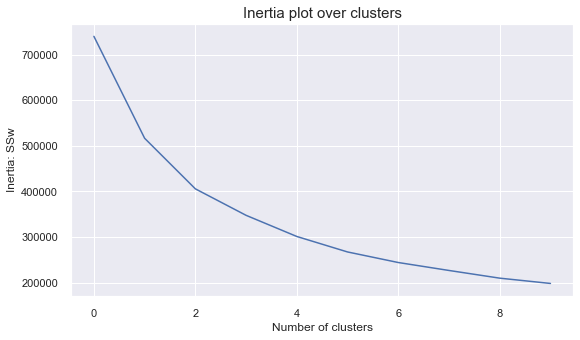

In [165]:
inertia = []
for n_clus in range_clusters:  # iterate over desired ncluster range
    kmclust = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
    kmclust.fit(df_sum2)
    inertia.append(kmclust.inertia_)  # save the inertia of the given cluster solution

# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(inertia)
plt.ylabel("Inertia: SSw")
plt.xlabel("Number of clusters")
plt.title("Inertia plot over clusters", size=15)
plt.show()

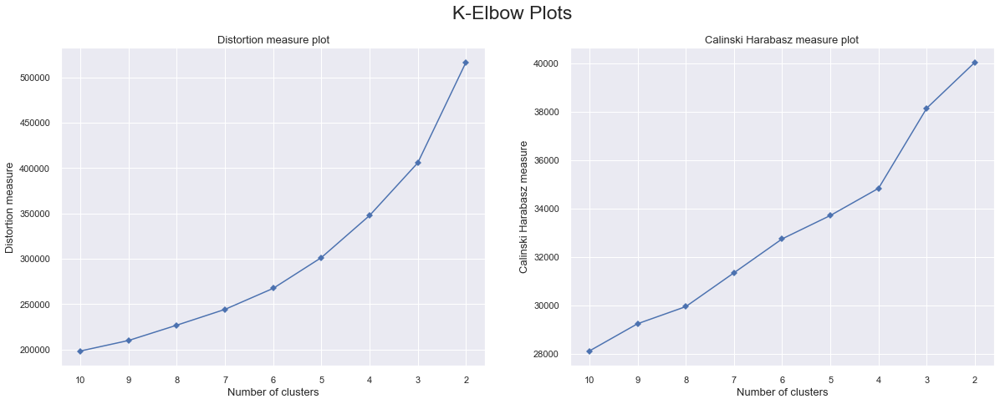

In [166]:
# Instantiate a scikit-learn K-Means model
clus_estim = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
# K-elbow plots
kelbowplots(clus_estim, df_sum2)

For n_clusters = 2, the average silhouette_score is : 0.36001050323496914
For n_clusters = 3, the average silhouette_score is : 0.38000491340097997
For n_clusters = 4, the average silhouette_score is : 0.3744666165541512
For n_clusters = 5, the average silhouette_score is : 0.3224921768122629


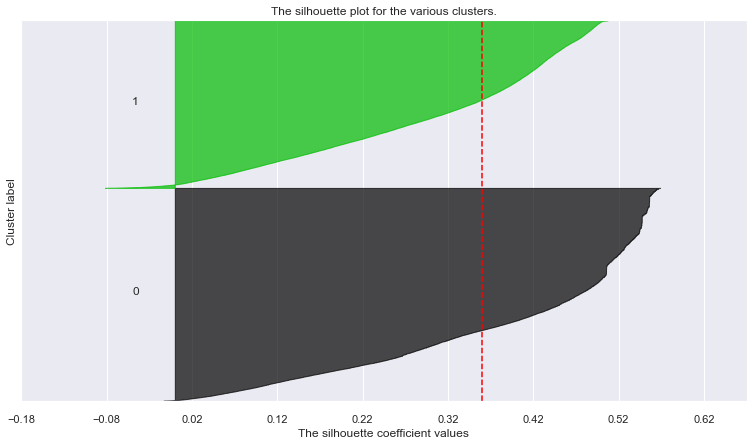

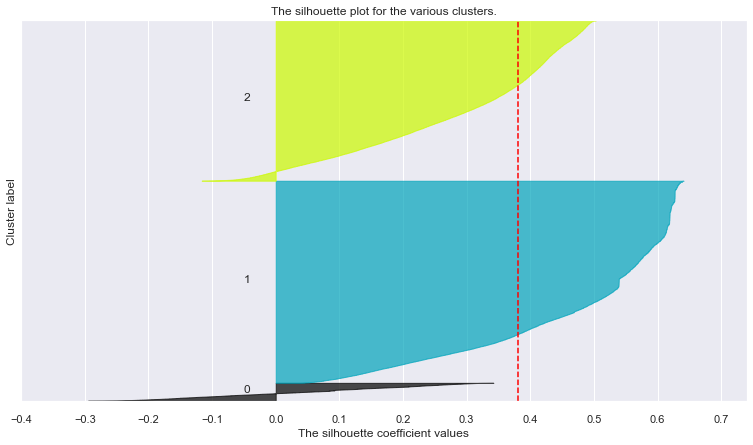

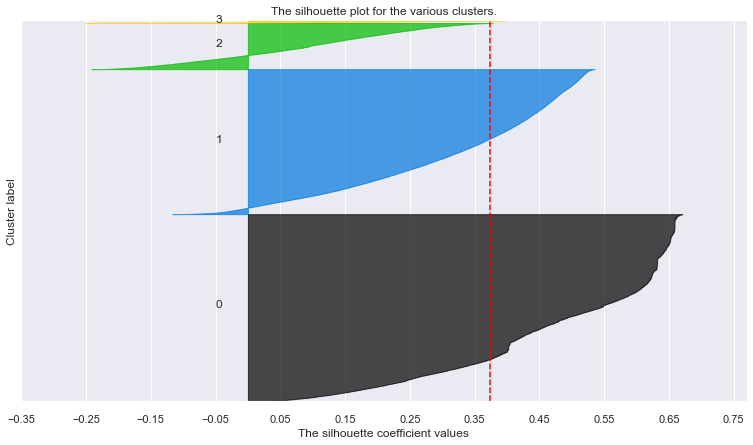

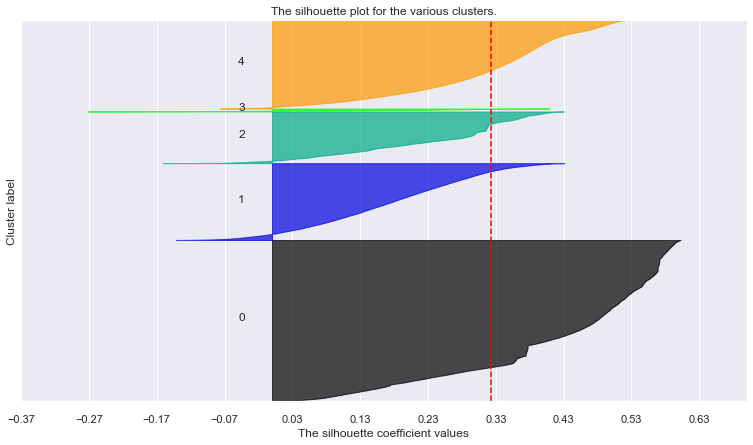

In [70]:
# Adapted from:
# https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html#sphx-glr-auto-examples-cluster-plot-kmeans-silhouette-analysis-py

# Storing average silhouette metric
avg_silhouette = []
for nclus in range(1,6):
    # Skip nclus == 1
    if nclus == 1:
        continue
    
    # Create a figure
    fig = plt.figure(figsize=(13, 7))

    # Initialize the KMeans object with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    kmclust = KMeans(n_clusters=nclus, init='k-means++', n_init=15, random_state=1)
    cluster_labels = kmclust.fit_predict(df_sum2)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed clusters
    silhouette_avg = silhouette_score(df_sum2, cluster_labels)
    avg_silhouette.append(silhouette_avg)
    print(f"For n_clusters = {nclus}, the average silhouette_score is : {silhouette_avg}")

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(df_sum2, cluster_labels)

    y_lower = 10
    for i in range(nclus):
        # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()
        
        # Get y_upper to demarcate silhouette y range size
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        
        # Filling the silhouette
        color = cm.nipy_spectral(float(i) / nclus)
        plt.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    plt.title("The silhouette plot for the various clusters.")
    plt.xlabel("The silhouette coefficient values")
    plt.ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    plt.axvline(x=silhouette_avg, color="red", linestyle="--")
    
    # The silhouette coefficient can range from -1, 1
    xmin, xmax = np.round(sample_silhouette_values.min() -0.1, 2), np.round(sample_silhouette_values.max() + 0.1, 2)
    plt.xlim([xmin, xmax])
    
    # The (nclus+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    plt.ylim([0, len(df_sum2) + (nclus + 1) * 10])

    plt.yticks([])  # Clear the yaxis labels / ticks
    plt.xticks(np.arange(xmin, xmax, 0.1))

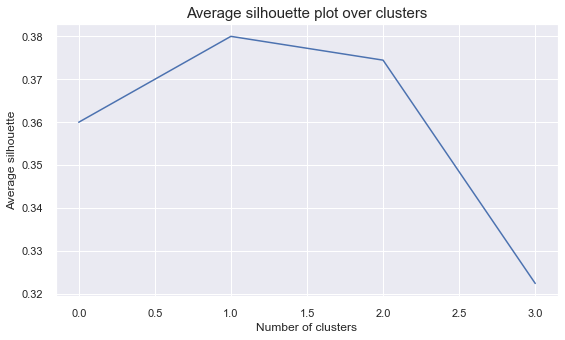

In [71]:
# The average silhouette plot
# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(avg_silhouette)
plt.ylabel("Average silhouette")
plt.xlabel("Number of clusters")
plt.title("Average silhouette plot over clusters", size=15)
plt.show()

#3 ou 4

In [72]:
# Performing kmeans and appending the cluster labels to a new dataframe that keeps the cluster labels
clust_labels, cent = clus_Kmeans(df_sum2, 3)
kmeans_sum2_df = df_sum2.copy()
kmeans_sum2_df["kmeans_sum2_labels"] = clust_labels

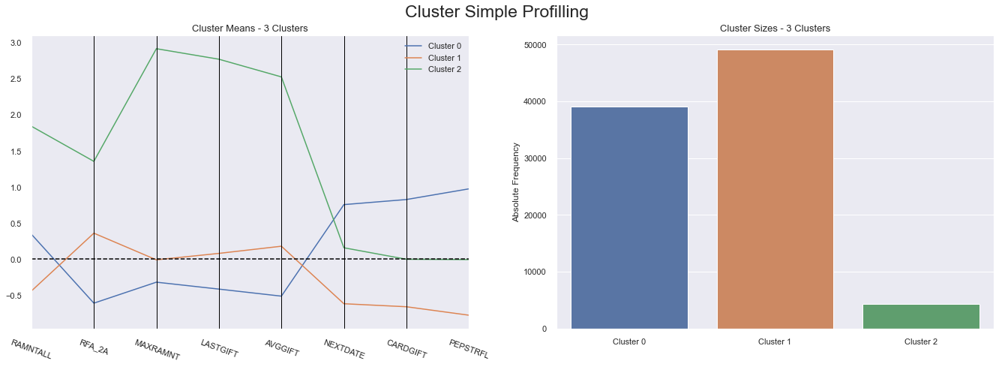

In [73]:
cluster_profiles(kmeans_sum2_df, ["kmeans_sum2_labels"], figsize=(23, 7))

Cluster 0 -> middle group of money spent in all the lifetime gifts to date, spent the least money in the last promotion (RFA_2), spent the least in the largest gift to date, spent the least money in the most recent gift, lowest average dollar amount of gifts to date, upper group of date of second gift (did it the most recent time), first position with the highest number of lifetime gifts to card promotions to date, group with PEP star RFA status


Cluster 1 -> spent the least money in all the lifetime gifts to date, middle group of money spent in the last promotion (RFA_2), middle group of money spent in the largest gift to date, middle group of money spent in the most recent gift, middle group in the average dollar amount of gifts to date, date of second gift took in the last place in this dataset, last position with the highest number of lifetime gifts to card promotions to date, group with no PEP star RFA status


Cluster 2 -> spent the most money in all the lifetime gifts to date, spent the most money in the last promotion (RFA_2), spent the most in the largest gift to date, spent the most money in the most recent gift, highest average dollar amount of gifts to date, middle group of date of second gift, second position with the highest number of lifetime gifts to card promotions to date, mixed group with PEP star RFA status

In [74]:
#R2 score

r2(kmeans_sum2_df, ["kmeans_sum2_labels"])

0.4734777516174954

In [75]:
# We are essentially decomposing the R² into the R² for each variable
r2_variables(kmeans_sum2_df, ['kmeans_sum2_labels']).drop('kmeans_sum2_labels').sort_values()

RFA_2A      0.311667
RAMNTALL    0.313630
AVGGIFT     0.427805
LASTGIFT    0.437062
MAXRAMNT    0.443068
NEXTDATE    0.444064
CARDGIFT    0.518077
PEPSTRFL    0.719480
dtype: float64

## All Data Segmentation

In [79]:
df_dem

,AGE,NUMCHLD,HOMEOWNR,GENDER,INCOME
CONTROLN,,,,,
95515,0.063676,-0.360928,-1.116803,-0.863304,-0.479693
148535,-0.961093,1.300858,0.895413,0.817879,1.320075
15078,0.131994,-0.360928,-1.116803,0.817879,-0.479693
172556,0.678537,-0.360928,-1.116803,-0.863304,-1.679539
7112,1.225080,1.300858,0.895413,-0.863304,-0.479693
...,...,...,...,...,...
184568,0.131994,-0.360928,-1.116803,0.817879,-0.479693
122706,-0.824457,1.300858,0.895413,0.817879,1.919998
189641,-0.004642,-0.360928,-1.116803,0.817879,-0.479693


In [384]:
df_sum2

,RAMNTALL,RFA_2A,MAXRAMNT,LASTGIFT,AVGGIFT,NEXTDATE,CARDGIFT,PEPSTRFL
CONTROLN,,,,,,,,
95515,1.318587,-0.972255,-0.551818,-0.611523,-0.661429,0.713749,1.987839,1.054529
148535,-0.533500,1.406257,0.388291,0.676629,0.301708,-0.982297,-0.896215,-0.948291
15078,0.953928,-0.972255,-0.262553,-1.040908,-0.693083,0.434272,1.987839,1.054529
172556,0.061471,-0.972255,-0.624134,-0.611523,-0.774388,1.490990,0.434887,1.054529
7112,1.452936,0.217001,-0.334870,-0.182139,-0.768024,3.993503,0.656737,-0.948291
...,...,...,...,...,...,...,...,...
184568,-0.744618,1.406257,0.388291,0.676629,1.436040,-1.259948,-1.118066,-0.948291
122706,-0.792600,0.217001,0.026711,0.247245,0.828362,-1.171355,-1.118066,-0.948291
189641,-0.427940,-0.972255,-0.696450,-0.611523,-0.595340,-0.900098,-0.230664,1.054529


In [88]:
df_cen2

,POP90C1,HU2,HHD3,POP90C3
CONTROLN,,,,
95515,-1.247266,-0.752620,0.697272,0.959688
148535,0.844518,-1.236379,1.873973,-0.657877
15078,-1.247266,-0.365614,0.370411,1.780913
172556,-1.247266,1.085661,0.108922,1.631599
7112,0.844518,-0.946124,-0.675545,-0.657877
...,...,...,...,...
184568,0.844518,0.698654,-0.217939,-0.657877
122706,0.781131,-0.849372,1.677856,-0.558335
189641,0.844518,0.214896,-1.067779,-0.657877


In [126]:
dem_sum = df_dem.merge(df_sum2, on='CONTROLN') #.drop(['RFA_2A', 'AVGGIFT', 'LASTGIFT'], axis=1)
df_merged = dem_sum.merge(df_cen2, on='CONTROLN')
df_merged


#com todos do summary segment

,AGE,NUMCHLD,HOMEOWNR,GENDER,INCOME,RAMNTALL,RFA_2A,MAXRAMNT,LASTGIFT,AVGGIFT,NEXTDATE,CARDGIFT,PEPSTRFL,POP90C1,HU2,HHD3,POP90C3
CONTROLN,,,,,,,,,,,,,,,,,
95515,0.063676,-0.360928,-1.116803,-0.863304,-0.479693,1.318587,-0.972255,-0.551818,-0.611523,-0.661429,0.713749,1.987839,1.054529,-1.247266,-0.752620,0.697272,0.959688
148535,-0.961093,1.300858,0.895413,0.817879,1.320075,-0.533500,1.406257,0.388291,0.676629,0.301708,-0.982297,-0.896215,-0.948291,0.844518,-1.236379,1.873973,-0.657877
15078,0.131994,-0.360928,-1.116803,0.817879,-0.479693,0.953928,-0.972255,-0.262553,-1.040908,-0.693083,0.434272,1.987839,1.054529,-1.247266,-0.365614,0.370411,1.780913
172556,0.678537,-0.360928,-1.116803,-0.863304,-1.679539,0.061471,-0.972255,-0.624134,-0.611523,-0.774388,1.490990,0.434887,1.054529,-1.247266,1.085661,0.108922,1.631599
7112,1.225080,1.300858,0.895413,-0.863304,-0.479693,1.452936,0.217001,-0.334870,-0.182139,-0.768024,3.993503,0.656737,-0.948291,0.844518,-0.946124,-0.675545,-0.657877
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
184568,0.131994,-0.360928,-1.116803,0.817879,-0.479693,-0.744618,1.406257,0.388291,0.676629,1.436040,-1.259948,-1.118066,-0.948291,0.844518,0.698654,-0.217939,-0.657877
122706,-0.824457,1.300858,0.895413,0.817879,1.919998,-0.792600,0.217001,0.026711,0.247245,0.828362,-1.171355,-1.118066,-0.948291,0.781131,-0.849372,1.677856,-0.558335
189641,-0.004642,-0.360928,-1.116803,0.817879,-0.479693,-0.427940,-0.972255,-0.696450,-0.611523,-0.595340,-0.900098,-0.230664,1.054529,0.844518,0.214896,-1.067779,-0.657877


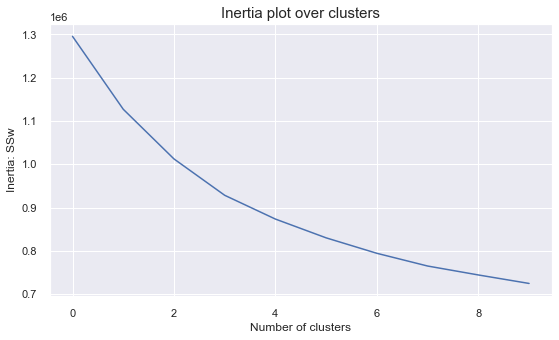

In [107]:
inertia = []
for n_clus in range_clusters:  # iterate over desired ncluster range
    kmclust = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
    kmclust.fit(df_merged)
    inertia.append(kmclust.inertia_)  # save the inertia of the given cluster solution

# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(inertia)
plt.ylabel("Inertia: SSw")
plt.xlabel("Number of clusters")
plt.title("Inertia plot over clusters", size=15)
plt.show()

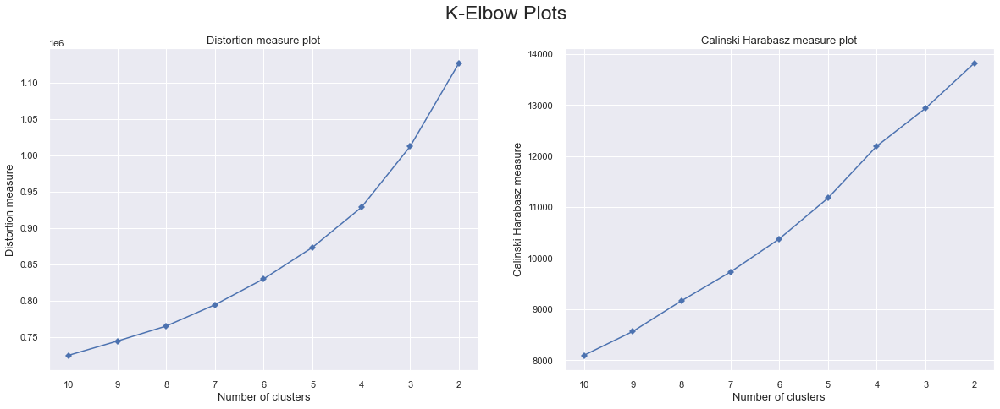

In [108]:
# Instantiate a scikit-learn K-Means model
clus_estim = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
# K-elbow plots
kelbowplots(clus_estim, df_merged)

For n_clusters = 2, the average silhouette_score is : 0.13980810893548318
For n_clusters = 3, the average silhouette_score is : 0.13843671942161695
For n_clusters = 4, the average silhouette_score is : 0.13495756503855905
For n_clusters = 5, the average silhouette_score is : 0.13532265436790783


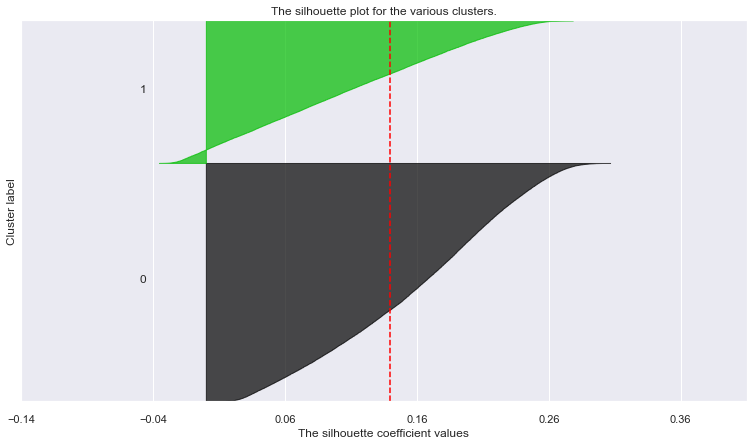

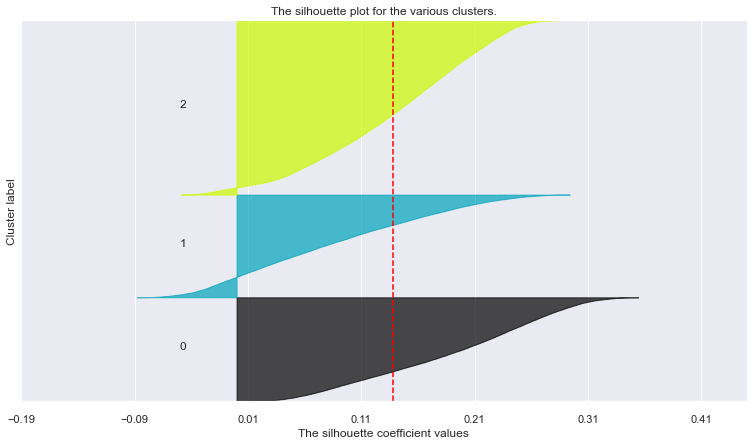

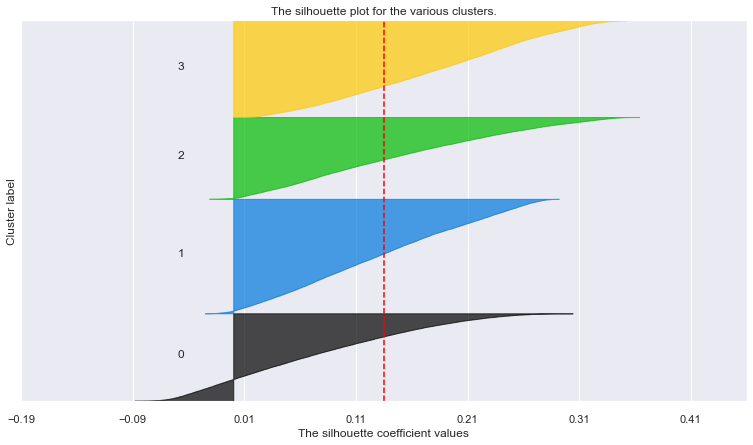

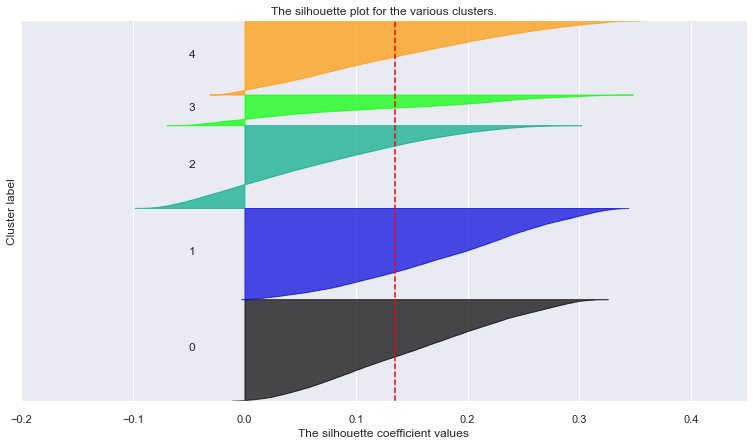

In [109]:
# Adapted from:
# https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html#sphx-glr-auto-examples-cluster-plot-kmeans-silhouette-analysis-py

# Storing average silhouette metric
avg_silhouette = []
for nclus in range(1,6):
    # Skip nclus == 1
    if nclus == 1:
        continue
    
    # Create a figure
    fig = plt.figure(figsize=(13, 7))

    # Initialize the KMeans object with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    kmclust = KMeans(n_clusters=nclus, init='k-means++', n_init=15, random_state=1)
    cluster_labels = kmclust.fit_predict(df_merged)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed clusters
    silhouette_avg = silhouette_score(df_merged, cluster_labels)
    avg_silhouette.append(silhouette_avg)
    print(f"For n_clusters = {nclus}, the average silhouette_score is : {silhouette_avg}")

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(df_merged, cluster_labels)

    y_lower = 10
    for i in range(nclus):
        # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()
        
        # Get y_upper to demarcate silhouette y range size
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        
        # Filling the silhouette
        color = cm.nipy_spectral(float(i) / nclus)
        plt.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    plt.title("The silhouette plot for the various clusters.")
    plt.xlabel("The silhouette coefficient values")
    plt.ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    plt.axvline(x=silhouette_avg, color="red", linestyle="--")
    
    # The silhouette coefficient can range from -1, 1
    xmin, xmax = np.round(sample_silhouette_values.min() -0.1, 2), np.round(sample_silhouette_values.max() + 0.1, 2)
    plt.xlim([xmin, xmax])
    
    # The (nclus+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    plt.ylim([0, len(df_merged) + (nclus + 1) * 10])

    plt.yticks([])  # Clear the yaxis labels / ticks
    plt.xticks(np.arange(xmin, xmax, 0.1))

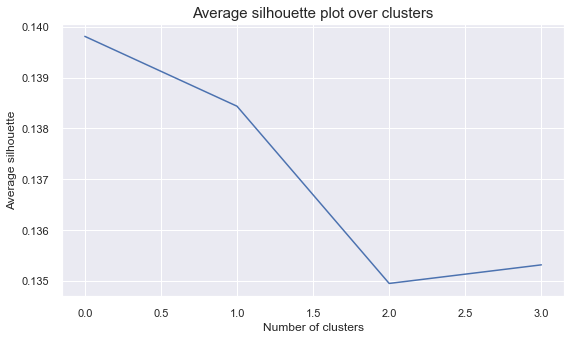

In [110]:
# The average silhouette plot
# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(avg_silhouette)
plt.ylabel("Average silhouette")
plt.xlabel("Number of clusters")
plt.title("Average silhouette plot over clusters", size=15)
plt.show()

In [401]:
# Performing kmeans and appending the cluster labels to a new dataframe that keeps the cluster labels
clust_labels, cent = clus_Kmeans(df_merged, 3)
kmeans_merged_df = df_merged.copy()
kmeans_merged_df["kmeans_merged_labels"] = clust_labels

#com todos do summary segment

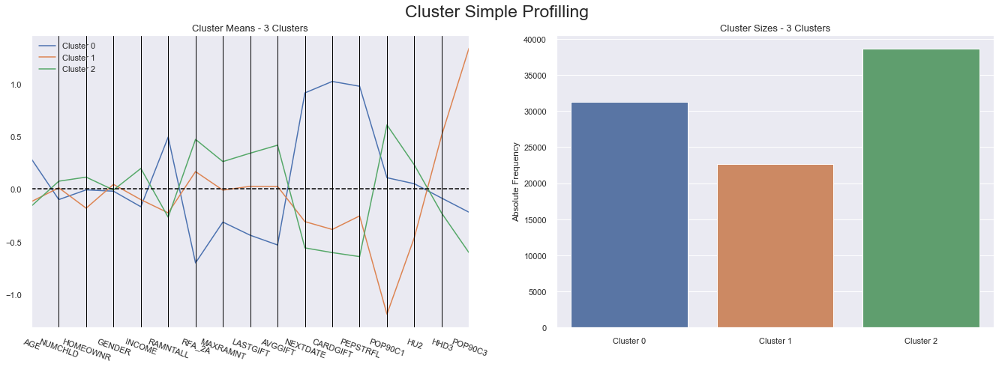

In [402]:
cluster_profiles(kmeans_merged_df, ["kmeans_merged_labels"], figsize=(23, 7))

Cluster 0 -> slightly older group of people, with a bit less children, mixed group of people who are homeowners and who are not, slightly comparatively below income, spent the most in all the lifetime gifts to date but spent the least in the last promotion (RFA_2) and in the largest gift to date, leastamount of most recent gift, the least Average dollar amount of gifts to date,the second gift was done the most recent, highest number of lifetime gifts to card promotions to date, every person has PEP star RFA status, most live in an Urbanized Area, mixed people in renter occupied housing units and some live Inside Rural Area, in the neighborhood there is a low Percentage of Married Couple Families.


Cluster 1 -> younger group of people, slightly less people who are homeowners, slightly comparatively below income, spent the second least in all the lifetime gifts to date and spent second the least in the last promotion (RFA_2) and in the largest gift to date, few people have the PEP star RFA status, most do not live in an Urbanized Area, most people do not live in renter occupied housing units and most live Inside Rural Area, in the neighborhood there is a higher Percentage of Married Couple Families.


(least amount of most recent gift, the least Average dollar amount of gifts to date,the second gift was done the most recent, highest number of lifetime gifts to card promotions to date, )



Cluster 2 -> younger group of people, with a bit more children, slightly more people who are homeowners, slightly above income, spent least in all the lifetime gifts to date but spent the most in the last promotion (RFA_2) and in the largest gift to date, least amount of most recent gift, the highest Average dollar amount of gifts to date,the second gift was done the most time ago, lowest number of lifetime gifts to card promotions to date, few people have the PEP star RFA status, most live in an non Urbanized Area, more people live in renter occupied housing units and many people live Inside Rural Areas, in the neighborhood there is a lower Percentage of Married Couple Families.


In all the clusters there is a mix of people from both genders.

In [361]:
#R2 score

r2(kmeans_merged_df, ["kmeans_merged_labels"])

#drop gender

0.24365539485864296

In the rest of the notebook, we continued the exploration of the whole dataset with the most important variables. Although, there is a better r2 score with DBSCAN, this is due to having more clusters (5 instead of 3). From all the clusters explored, we found that kmeans is the best one for our dataset. 


GMM and DBSCAN both produce worse solutions since we obtain clusters with more similar average behaviour. For example, in the GMM clustering, in terms of Percentage of Population in Urbanized Area the 3 clusters lines are more near each other in the GMM than in the K-means solution. In the DBSCAN clustering, we can see that cluster 1 and cluster 3 don't appear to have any particular behaviour, since the cluster line overlap each other in many of the variables.


By analyzing the K-means solution, we can see that the variables that provide more discriminant behaviours across the clusters are Percentage of Population in Urbanized Area, Percent Population Inside Rural Area, PEP Star RFA Status and  Number of lifetime gifts to card promotions to date, suggesting that the customers differ mainly according to the historical behaviour with donations and where they live. 




# "
Furthermore, we can see (cluster 2) that there's a clear relationship between the year_salary and the product behaviour: people that earn less, invest mainly in the LOBs household, life and work_comp (and don't spend in motor). Besides, these customers are the ones that spend the highest proportion of their salary in premiums (t_premiums_salary) and the ones that have higher customer monetary value (cmv), making them a very important segment, despite their small size.

We can also identify a segment (cluster 1) of customers that spend a lot in motor and in nothing else. Finally, cluster 0 are the customers that spend the most in health, have the highest salary and are averse to spending money in motor."

## Using a Decision Tree

In [134]:
from sklearn.manifold import TSNE
from sklearn.tree import DecisionTreeClassifier, export_graphviz
from sklearn.model_selection import train_test_split
import graphviz

In [142]:
# Preparing the data
X = kmeans_merged_df.drop(columns=['kmeans_merged_labels'])
y = kmeans_merged_df.kmeans_merged_labels

# Splitting the data
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# Fitting the decision tree
dt = DecisionTreeClassifier(random_state=42, max_depth=3)
dt.fit(X_train, y_train)
print("It is estimated that in average, we are able to predict {0:.2f}% of the customers correctly".format(dt.score(X_test, y_test)*100))

It is estimated that in average, we are able to predict 86.73% of the customers correctly


In [143]:
# Assessing feature importance
pd.Series(dt.feature_importances_, index=X_train.columns)

AGE         0.000000
NUMCHLD     0.000000
HOMEOWNR    0.000000
GENDER      0.000000
INCOME      0.000000
RAMNTALL    0.000000
RFA_2A      0.019348
MAXRAMNT    0.000000
LASTGIFT    0.000000
AVGGIFT     0.000000
NEXTDATE    0.000000
CARDGIFT    0.454915
PEPSTRFL    0.065659
POP90C1     0.009428
HU2         0.000000
HHD3        0.000000
POP90C3     0.450649
dtype: float64

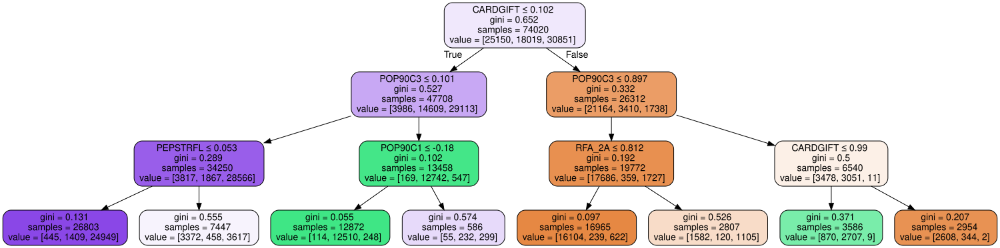

In [144]:
# Visualizing the decision tree
dot_data = export_graphviz(dt, out_file=None, 
                           feature_names=X.columns.to_list(),
                           filled=True,
                           rounded=True,
                           special_characters=True)  
graphviz.Source(dot_data)

## Classification of Outliers
Even though we believe some of the outliers we spotted previously can be truly aberrant observations, we will proceed to classify them according to the final concatenated cluster. For this task we will resort to a simple decision tree which allows us to easily classify the outliers.

This classifier will also provide a useful tool for the future, as a set of rules can be extracted that helps understand why customers belong to a certain cluster. With this information, we can easily classify future customers by making simple queries to the database. This will allow a more personalized service to each future customer which can be dynamically adapted (a customer can belong to different clusters across time).

In [276]:
df_out= df_outliers[kmeans_merged_df.drop(columns=['kmeans_merged_labels']).columns]
df_out

,AGE,NUMCHLD,HOMEOWNR,GENDER,INCOME,RAMNTALL,RFA_2A,MAXRAMNT,LASTGIFT,AVGGIFT,NEXTDATE,CARDGIFT,PEPSTRFL,POP90C1,HU2,HHD3,POP90C3
CONTROLN,,,,,,,,,,,,,,,,,
190313,NaN,0.0,0,1,NaN,68.0,0,10.0,7.0,6.181818,2556.0,6,0,99,3,88,0
185130,86.0,0.0,1,0,2.0,1405.0,3,200.0,100.0,100.357143,1917.0,1,0,91,32,66,8
183367,NaN,0.0,0,1,3.0,152.0,0,10.0,7.0,5.428571,3592.0,17,1,0,30,52,99
43238,51.0,0.0,0,0,3.0,78.0,2,22.0,15.0,15.600000,2100.0,4,0,99,27,55,0
191754,65.0,0.0,1,0,4.0,80.0,2,15.0,15.0,10.000000,3255.0,3,0,99,10,54,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
139169,41.0,0.0,1,0,4.0,30.0,2,15.0,15.0,10.000000,1126.0,0,0,0,21,58,99
190314,NaN,0.0,0,0,NaN,74.0,1,11.0,11.0,5.692308,2709.0,6,0,99,57,43,0
190309,NaN,0.0,0,0,NaN,71.0,2,20.0,20.0,8.875000,2587.0,4,1,99,11,71,1


In [277]:
#Firstly, to be able to predict the outliers, data needs to be imputed to the nan values and, 
#then, it needs to be standardized.

imp_mean = IterativeImputer(random_state=0)
df_complete = imp_mean.fit_transform(df_out[df_out.columns])
df_out[df_out.columns] = df_complete

df_out.reset_index(inplace=True)
out = df_out.columns.to_list()
out.remove('CONTROLN')

scaler = StandardScaler()
df_out[out] = pd.DataFrame(scaler.fit_transform(df_out[out]), columns = out)

df_out.set_index(['CONTROLN'],inplace=True) 

df_out

,AGE,NUMCHLD,HOMEOWNR,GENDER,INCOME,RAMNTALL,RFA_2A,MAXRAMNT,LASTGIFT,AVGGIFT,NEXTDATE,CARDGIFT,PEPSTRFL,POP90C1,HU2,HHD3,POP90C3
CONTROLN,,,,,,,,,,,,,,,,,
190313,0.020494,-0.202993,-0.747545,0.561589,0.489080,-0.328240,-2.662091,-0.247160,-0.441488,-0.386292,0.521042,0.328144,-0.765160,0.836365,-1.386281,1.608001,-0.608891
185130,1.950326,-0.202993,1.337712,-0.959210,-1.074604,1.403747,0.973378,0.346851,0.468525,0.542812,-0.074199,-0.770606,-0.765160,0.670212,-0.498536,0.729108,-0.396230
183367,0.078186,-0.202993,-0.747545,0.561589,-0.418587,-0.219424,-2.662091,-0.247160,-0.441488,-0.393723,1.486097,2.745395,1.306916,-1.219783,-0.559760,0.169813,2.022782
43238,-0.779035,-0.202993,-0.747545,-0.959210,-0.418587,-0.315285,-0.238445,-0.209644,-0.363207,-0.293375,0.096270,-0.111356,-0.765160,0.836365,-0.651596,0.289662,-0.608891
191754,0.312709,-0.202993,1.337712,-0.959210,0.237430,-0.312694,-0.238445,-0.231528,-0.363207,-0.348623,1.172175,-0.331106,-0.765160,0.836365,-1.171998,0.249712,-0.608891
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
139169,-1.558852,-0.202993,1.337712,-0.959210,0.237430,-0.377466,-0.238445,-0.231528,-0.363207,-0.348623,-0.811031,-0.990356,-0.765160,-1.219783,-0.835267,0.409511,2.022782
190314,0.028016,-0.202993,-0.747545,-0.959210,-0.146620,-0.320467,-1.450268,-0.244034,-0.402348,-0.391121,0.663565,0.328144,-0.765160,0.836365,0.266761,-0.189734,-0.608891
190309,0.022147,-0.202993,-0.747545,-0.959210,0.374380,-0.324353,-0.238445,-0.215896,-0.314282,-0.359722,0.549920,-0.111356,1.306916,0.836365,-1.141386,0.928857,-0.582308


In [278]:
# Predicting the cluster labels of the outliers
df_out['merged_labels'] = dt.predict(df_out)
df_out.head()


,AGE,NUMCHLD,HOMEOWNR,GENDER,INCOME,RAMNTALL,RFA_2A,MAXRAMNT,LASTGIFT,AVGGIFT,NEXTDATE,CARDGIFT,PEPSTRFL,POP90C1,HU2,HHD3,POP90C3,merged_labels
CONTROLN,,,,,,,,,,,,,,,,,,
190313,0.020494,-0.202993,-0.747545,0.561589,0.489080,-0.328240,-2.662091,-0.247160,-0.441488,-0.386292,0.521042,0.328144,-0.765160,0.836365,-1.386281,1.608001,-0.608891,0
185130,1.950326,-0.202993,1.337712,-0.959210,-1.074604,1.403747,0.973378,0.346851,0.468525,0.542812,-0.074199,-0.770606,-0.765160,0.670212,-0.498536,0.729108,-0.396230,2
183367,0.078186,-0.202993,-0.747545,0.561589,-0.418587,-0.219424,-2.662091,-0.247160,-0.441488,-0.393723,1.486097,2.745395,1.306916,-1.219783,-0.559760,0.169813,2.022782,0
43238,-0.779035,-0.202993,-0.747545,-0.959210,-0.418587,-0.315285,-0.238445,-0.209644,-0.363207,-0.293375,0.096270,-0.111356,-0.765160,0.836365,-0.651596,0.289662,-0.608891,2
191754,0.312709,-0.202993,1.337712,-0.959210,0.237430,-0.312694,-0.238445,-0.231528,-0.363207,-0.348623,1.172175,-0.331106,-0.765160,0.836365,-1.171998,0.249712,-0.608891,2


## Cluster visualization using t-SNE

<a class="anchor" id="hier">

In [286]:
kmeans_merge_sample = kmeans_merged_df.sample(n=20000)

In [287]:
kmeans_merge_sample

,AGE,NUMCHLD,HOMEOWNR,GENDER,INCOME,RAMNTALL,RFA_2A,MAXRAMNT,LASTGIFT,AVGGIFT,NEXTDATE,CARDGIFT,PEPSTRFL,POP90C1,HU2,HHD3,POP90C3,kmeans_merged_labels
CONTROLN,,,,,,,,,,,,,,,,,,
143490,0.131994,-0.360928,-1.116803,0.817879,0.120230,-0.840581,0.217001,-0.334870,-0.182139,0.220684,-0.964030,-0.896215,-0.948291,0.844518,3.214198,-2.440596,-0.657877,2
8113,1.361716,-0.360928,-1.116803,-0.863304,-0.479693,7.018793,0.217001,1.111451,0.418999,0.811000,1.824354,2.653390,1.054529,-1.247266,-0.317238,-0.348684,1.805798,0
188273,0.063676,-0.360928,-1.116803,0.817879,0.120230,-0.437537,0.217001,-0.334870,-0.182139,-0.216844,-0.315569,-0.896215,-0.948291,0.844518,-0.897748,1.024134,-0.657877,2
51093,-0.482867,-0.360928,0.895413,0.817879,0.720152,0.301379,0.217001,0.026711,-0.182139,0.207180,0.017795,-0.230664,-0.948291,-1.247266,-0.365614,0.893389,1.432514,1
84492,0.951809,-0.360928,0.895413,-0.863304,-0.479693,0.243801,1.406257,0.460607,0.762506,0.342220,0.296359,-0.230664,-0.948291,0.844518,0.166520,-0.740917,-0.657877,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
101583,0.063676,-0.360928,-1.116803,-0.863304,-0.479693,0.483709,-0.972255,-0.551818,-0.439770,-0.440166,1.630729,1.765989,1.054529,-1.247266,0.069769,-0.021823,0.536632,0
150934,0.405265,-0.360928,0.895413,-0.863304,-0.479693,1.683247,0.217001,-0.117921,-0.182139,-0.250874,1.603329,1.765989,1.054529,0.844518,-0.317238,0.239666,-0.657877,0
28853,0.131994,1.300858,-1.116803,-0.863304,-1.079616,-0.466325,-0.972255,-0.551818,-0.439770,-0.508529,-0.732046,-0.230664,-0.948291,-1.247266,0.747030,-0.806290,-0.110394,1


In [288]:
# This is step can be quite time consuming
two_dim = TSNE(random_state=42, n_jobs=4).fit_transform(kmeans_merge_sample.drop(columns=['kmeans_merged_labels']))   

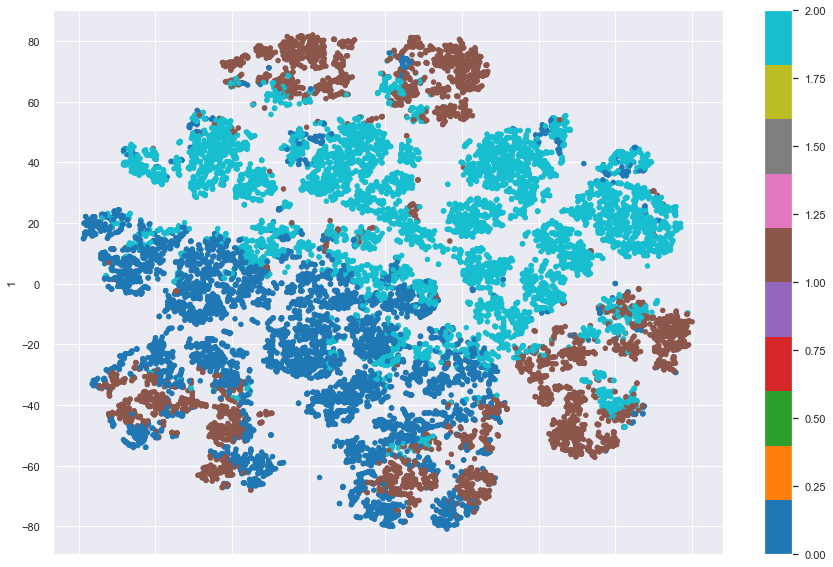

In [289]:
# t-SNE visualization
pd.DataFrame(two_dim).plot.scatter(x=0, y=1, c=kmeans_merge_sample['kmeans_merged_labels'], colormap='tab10', figsize=(15,10))
plt.show()

In [290]:
#nao vale a pena manter right?

## DBSCAN (Density-based spatial clustering of applications with noise)

<a class="anchor" id="hier">

We've tried with different parameters and the best results, with 5 clusters, can be seen below.

In [297]:
from sklearn.neighbors import NearestNeighbors

In [321]:
# Perform DBSCAN clustering
dbscan = DBSCAN(eps=2, min_samples=20, n_jobs=4)
dbscan_labels = dbscan.fit_predict(df_merged)

dbscan_n_clusters = len(np.unique(dbscan_labels))
print("Number of estimated clusters : %d" % dbscan_n_clusters)

Number of estimated clusters : 5


In [322]:
dbscan_merged_df = df_merged.copy()
dbscan_merged_df["dbscan_merged_labels"] = dbscan_labels

In [323]:
# Computing the R^2 of the cluster solution
df_nonoise = dbscan_merged_df.loc[dbscan_merged_df['dbscan_merged_labels'] != -1]
sst = get_ss(df_merged)  # get total sum of squares
ssw_labels = df_nonoise.groupby(by='dbscan_merged_labels').apply(get_ss)  # compute ssw for each cluster labels
ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
r2 = ssb / sst
print("Cluster solution with R^2 of %0.4f" % r2)

Cluster solution with R^2 of 0.4186


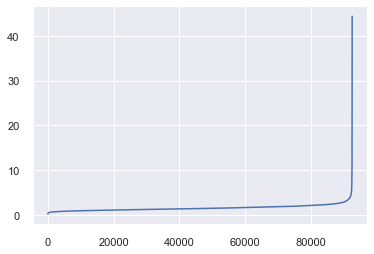

In [314]:
# K-distance graph to find out the right eps value
neigh = NearestNeighbors(n_neighbors=20,n_jobs=4)
neigh.fit(df_merged)
distances, _ = neigh.kneighbors(df_merged)
distances = np.sort(distances[:, -1])
plt.plot(distances)
plt.show()

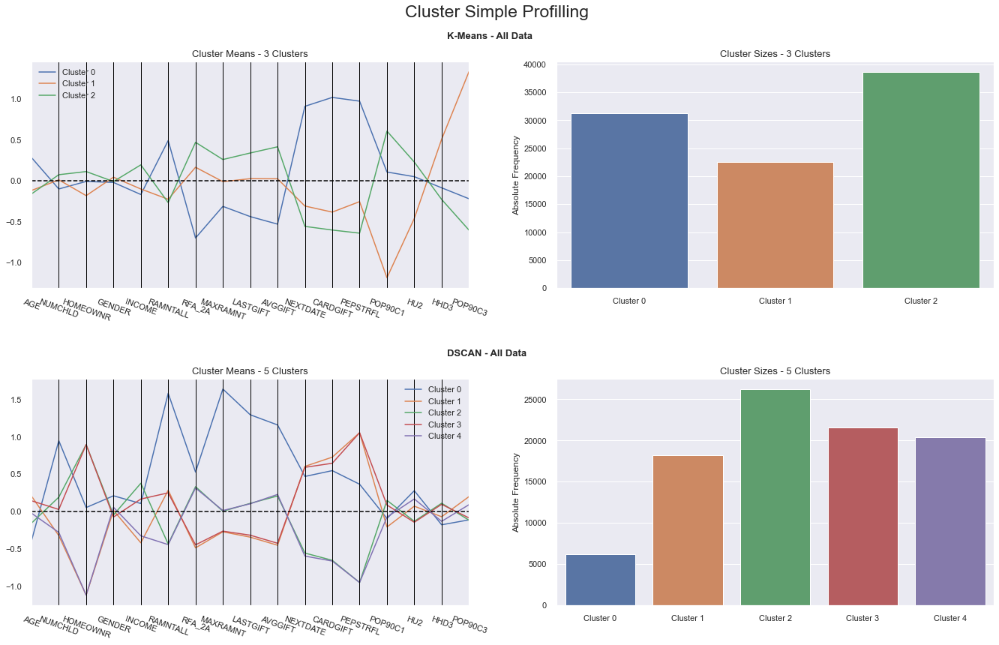

In [375]:
# Comparing both K-means and DBSCAN solutions
dbkm_complete_std_df = kmeans_merged_df.merge(dbscan_merged_df["dbscan_merged_labels"], left_index=True, right_index=True)
cluster_profiles(dbkm_complete_std_df, ["kmeans_merged_labels", "dbscan_merged_labels"], figsize=(23, 13), compar_titles=["K-Means - All Data", "DSCAN - All Data"])

## GMM (Gaussian Mixture Model )
### Characteristics:
- Assumes the data is generated from a mixture of finite number of Gaussian distributions with unknown parameters
- Use the EM (Expectation Maximization algorithm) to estimate the parameters
- Provides a probability of each observation belonging to each cluster
- Advantages over K-Means:
    - Can deal with spherical and elipsoid cluster shapes
    - Number of components needs to be defined apriori
<a class="anchor" id="hier">
    


In [363]:
# GMM
from sklearn.mixture import GaussianMixture

In [364]:
def comp_gmm_models(df, max_nclus, min_nclus=2):
    """
    This function produces a bar plot for each quality criteria (AIC, BIC) to asses what is the best gmm configuration
    """
    # Data
    n_components_range = range(min_nclus, max_nclus+1)
    cv_types = ['spherical', 'tied', 'diag', 'full'] #values of the covariance type parameter
    bic = np.empty((4, len(n_components_range)))
    aic = np.empty((4, len(n_components_range)))
    for r, cv_type in enumerate(cv_types):
        for c, n_components in enumerate(n_components_range):
            # Fit a Gaussian mixture with EM
            gmm = GaussianMixture(n_components=n_components, covariance_type=cv_type)
            gmm.fit(df)
            # Save quality measure value
            bic[r, c] = gmm.bic(df)
            aic[r, c] = gmm.aic(df)

    # Traces
    bic = pd.DataFrame(bic, columns=n_components_range, index=cv_types)
    aic = pd.DataFrame(aic, columns=n_components_range, index=cv_types)
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(23,7))
    
    sns.barplot(data=bic.reset_index().melt(id_vars="index"),
                x="variable", y="value", hue="index", ax=ax1)
    
    sns.barplot(data=aic.reset_index().melt(id_vars="index"),
                x="variable", y="value", hue="index", ax=ax2)

    # Layout
    ax1.set_xlabel('Number of Components')
    ax2.set_xlabel('Number of Components')
    ax1.set_ylabel('BIC Criteria')
    ax2.set_ylabel('AIC Criteria')
    ax1.legend(title="Covariance Type")
    ax2.legend(title="Covariance Type")
    plt.suptitle('BIC and AIC Scores per Model', fontsize=23)

    plt.show()

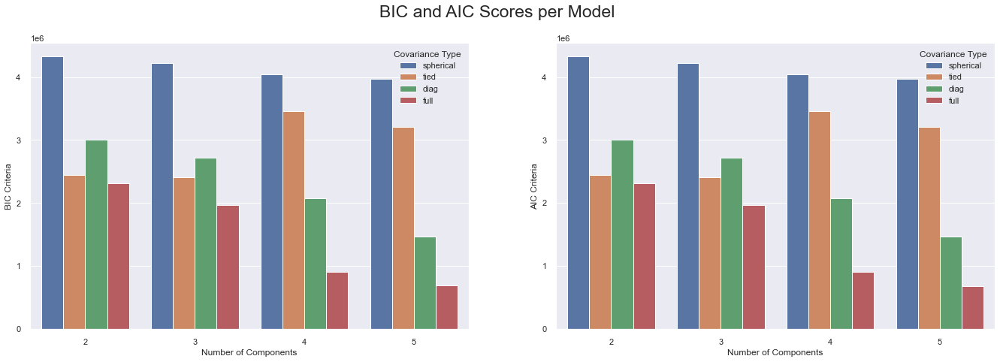

In [366]:
# Use the function built to choose the best GMM configuration
comp_gmm_models(df_merged, 5)

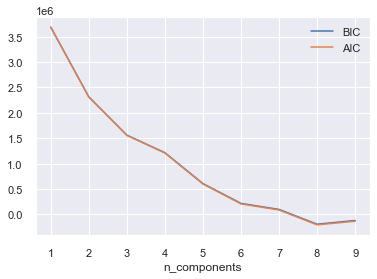

In [376]:
# Selecting number of components based on AIC and BIC
n_components = np.arange(1, 10)
models = [GaussianMixture(n, covariance_type='full', n_init=10, random_state=1).fit(df_merged) #, n_jobs=4
          for n in n_components]

bic_values = [m.bic(df_merged) for m in models]
aic_values = [m.aic(df_merged) for m in models]
plt.plot(n_components, bic_values, label='BIC')
plt.plot(n_components, aic_values, label='AIC')
plt.legend(loc='best')
plt.xlabel('n_components')
plt.xticks(n_components)
plt.show()

The first step in GMM is to define the parameters to use, such as the number of clusters to retain and the covariancy type to use. In this case, we will do with 3 clusters, following to the graph above.

From the plot above, the covariance type "full" is the best one to use, both in terms of AIC and BIC information criteria (the lower the better), which are measures of the cluster quality. Therefore, from the plot above we conclude that we want to use the "full" Covariance Type in our GMM.

Besides, it is also possible to see how the quality varies according to the number of clusters retained. One can conclude that with more clusters, the quality increases overall, independently of the covariance type (as it would be expected). Therefore, we will perform some further investigation on how many clusters to retain.

In [372]:
#the gmm method was aggregated on a function
def doGMM(df, nclust):
    model=GaussianMixture(n_components=nclust, init_params='kmeans', random_state=0)
    model.fit(df)
    clust_labels = model.predict(df)
    return(clust_labels)

In [377]:
# Performing gmm and appending the cluster labels to a new dataframe that keeps the cluster labels
clust_labels = doGMM(df_merged, 3)
gmm_df = df_merged.copy()
gmm_df["gmm_labels"] = clust_labels

In [378]:
# Computing the R^2 of the cluster solution
sst = get_ss(df_merged)  # get total sum of squares
ssw_labels = gmm_df.groupby(by='gmm_labels').apply(get_ss)  # compute ssw for each cluster labels
ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
r2 = ssb / sst
print("Cluster solution with R^2 of %0.4f" % r2)

Cluster solution with R^2 of 0.1885


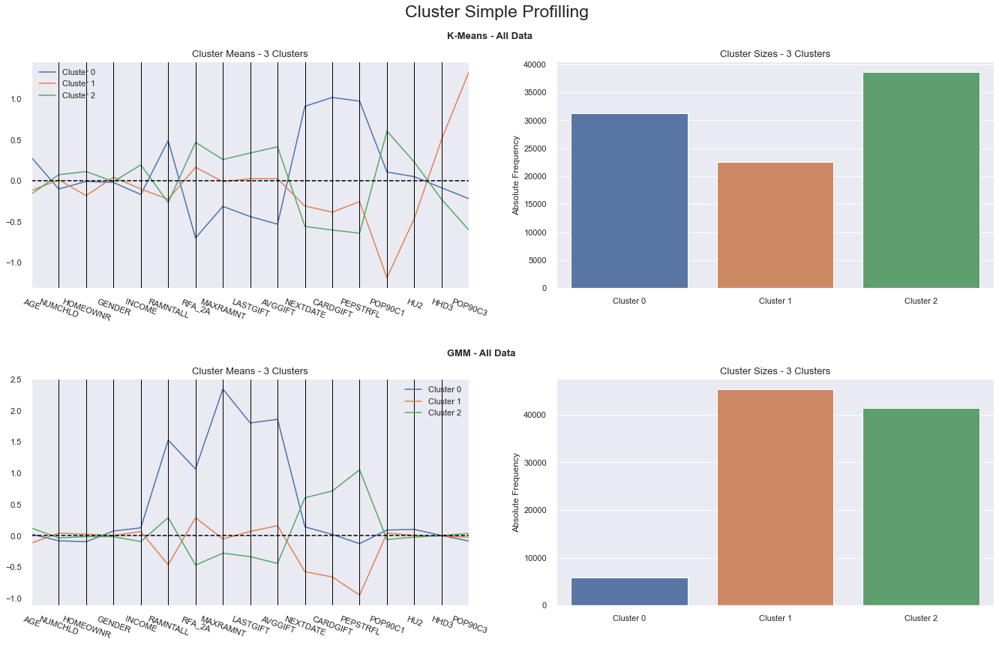

In [379]:
# Comparing both K-means and GMM solutions
comp_complete_df = kmeans_merged_df.merge(gmm_df["gmm_labels"], left_index=True, right_index=True)
cluster_profiles(comp_complete_df, ["kmeans_merged_labels", "gmm_labels"], figsize=(23, 13), compar_titles=["K-Means - All Data", "GMM - All Data"])

In [151]:
prof = ProfileReport(d[categorical_data])
prof.to_file(output_file='profiling2.html')

## References:
Deal with nan values:
https://stackoverflow.com/questions/50670080/mice-implementation-in-python
https://stackoverflow.com/questions/45321406/missing-value-imputation-in-python-using-knn
https://stackoverflow.com/questions/45239256/data-imputation-with-fancyimpute-and-pandas
https://stackoverflow.com/questions/54059964/can-not-use-mice-from-fancyimputer-python


Use mean or median:
https://www.wcc.nrcs.usda.gov/normals/median_average.htm